In [39]:
import time
import numpy as np

# Data Class

In [40]:
import os
import re
import json
import math
import cv2
import subprocess as sp
from osr2mp4.EEnum.EReplay import Replays
from osr2mp4.osr2mp4 import Osr2mp4
import torch
import torchvision.io as vision
import torchvision.transforms as transforms

In [41]:
class OSR():
    def __init__(self, beatmap_dir, beatmap, sample_rate=44100, hop_size=441, skin=None,
                 width=4,
                 tmp='./tmp', vtmp='./vid', atmp='./wav'):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.beatmap_path = os.path.join(self.beatmap_dir, self.beatmap)
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.rate = int(sample_rate / hop_size)
        self.fps = self.rate
        self.tmp = tmp
        self.vtmp = vtmp
        self.atmp = atmp
        self.width = 4
        self.skin = skin
        self.data_json = os.path.join(self.tmp, self.beatmap + '.json')
        self.video_path = os.path.join(self.vtmp, self.beatmap + '.avi')
        
        self.replay_info = None
        self.osr2mp4 = None
        self.video = None
        self.hitobjects = None
        self.cursorstream = None
        self.timestamp = None
                
    def run_osr2mp4(self):
        d = json.load(open('data.json', 'r'))
        f = open(self.data_json, 'w')
        d['Beatmap path'] = self.beatmap_path
        if self.skin is not None:
            d['Skin path'] = self.skin
        d['FPS'] = self.fps
        d['Output path'] = self.video_path
        json.dump(d, f)
        f.close()
                 
        self.osr2mp4 = Osr2mp4(filedata=self.data_json, filesettings='settings.json', filepp='ppsettings.json', 
                               filestrain='strainsettings.json', logtofile=True)
        while True:
            if self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_X] == 0 and self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_Y] == 0:
                self.osr2mp4.replay_info.play_data = self.osr2mp4.replay_info.play_data[0:-1]
            else:
                break
        
    def create_vid(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        cmd = ['python', 'create_vid.py', self.data_json]
        proc = sp.Popen(cmd)
        proc.wait()
        
    def parse_timings(self):
        if self.video is None:
            self.get_video()
        self.beat_len = []
        self.timestamp = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'BeatDivisor.*', l):
                self.BeatDivisor = int(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0]))
        self.timestamp.append(int(self.video[1].shape[1] / self.video[2]['audio_fps'] * 1000))
        f.close()
    
    def parse_hitobjects(self):
        self.hitobjects = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'ApproachRate.*', l):
                AR = float(l.split(':')[1])
                if AR < 5.0:
                    preempt = 1200 + 600 * (5 - AR) / 5
                    fadein = 800 + 400 * (5 - AR) / 5
                else:
                    preempt = 1200 - 750 * (AR - 5) / 5
                    fadein = 800 - 500 * (AR - 5) / 5
                self.preempt = preempt - fadein*0.1
                break
        f.seek(0)
        for l in f:
            if re.match(r'SliderMultiplier.*', l):
                self.sliderMultiplier = float(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
    
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
        
    def create_cursor_peak(self, y, i):
        alen = len(y)
        w = self.width/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j += 1
    
    def process_beatobjects(self):
        pass
    
    def process_hitobjects(self):
        if self.hitobjects is None:
               self.parse_beatmap()
        self.hitobjStream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
    
    def process_clicks(self):
        pass
    
    def process_cursor(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        n = math.ceil((self.osr2mp4.replay_info.play_data[-1][Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)
        self.cursorstream = [None] * n
        #self.cursorstream = np.zeros((n, 3))
        
        for j in range(len(self.osr2mp4.replay_info.play_data) - 1):
            a = self.osr2mp4.replay_info.play_data[j]
            b = self.osr2mp4.replay_info.play_data[j+1]
            delta = (b[Replays.TIMES] - a[Replays.TIMES]) * 0.001 * self.fps
            xdist = b[Replays.CURSOR_X] - a[Replays.CURSOR_X]
            ydist = b[Replays.CURSOR_Y] - a[Replays.CURSOR_Y]
            stime = (a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps
            x = a[Replays.CURSOR_X]
            y = a[Replays.CURSOR_Y]
            
            e = np.array([0.0, 0.0, 0])           
            for t in range(math.ceil(delta)):
                e[Replays.CURSOR_X] = x + xdist/delta*t
                e[Replays.CURSOR_Y] = y + ydist/delta*t
                self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
            e[Replays.KEYS_PRESSED] = a[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = a[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = a[Replays.CURSOR_Y]
            self.cursorstream[int((a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
            e[Replays.KEYS_PRESSED] = b[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = b[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = b[Replays.CURSOR_Y]
            self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
        
        for i in range(len(self.cursorstream)):
            if self.cursorstream[i] is None:
                self.cursorstream[i] = torch.tensor([0.0, 0.0, 0])
        r = copy.deepcopy(self.cursorstream)
        for i in range(len(self.cursorstream)):
            if r[i][Replays.KEYS_PRESSED] != 0:
                self.create_cursor_peak(self.cursorstream, i)
        #for i in range(len(self.cursorstream)):
        #    self.cursorstream[i] = torch.tensor(self.cursorstream[i])
        
    def process_events(self):
        self.process_clicks()
        self.process_cursor()
        
    def read_video(self, scale=1):
        if not os.path.exists(self.video_path):
            self.create_vid()
        #self.video = vision.read_video(self.video_path)
        transform = transforms.ToTensor()
        frames = []
        vc = cv2.VideoCapture(self.video_path)
        while True:
            r, f = vc.read()
            f = cv2.resize(f, (0,0), fx=scale, fy=scale)
            frames.append(transform(f))
            if r is False:
                break
        return torch.stack(frames)
        
    def queue_vid(self):
        if not os.path.exists(self.video_path):
            self.create_vid()   
        return self.video_path
    
    def get_offset(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        return self.osr2mp4.replay_info.play_data[0][Replays.TIMES]
    
    def get_beatobjects(self):
        if self.beatobjStream is None:
            self.process_beatobjects()
        stream = [None] * len(self.beatobjStream)
        for i in range(len(self.beatobjStream)):
            if self.beatobjStream[i] == [] or self.beatobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.beatobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
        
    def get_hitobjects(self):
        if self.hitobjStream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitobjStream)
        for i in range(len(self.hitobjStream)):
            if self.hitobjStream[i] == [] or self.hitobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.hitobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_cursor(self):
        if self.cursorstream is None:
            self.process_events()
        return torch.stack(self.cursorstream)
        
    def get_video(self, scale=1):
        if self.video is None:
            self.read_video(scale=1)
        return self.video

# Dataset

In [42]:
import glob
import copy
import traceback
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import cv2
import matplotlib.pyplot as plt

In [43]:
class OSR_Dataset(Dataset):
    def __init__(self, beatmap_dir, sample_rate=44100, hop_size=441, seq_dur=10, scale=1, hidden_mod=0, maximum=100):
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.hidden_mod = hidden_mod
        self.maximum = maximum
        self.scale = scale
        
        self.osrs = []
        
        if beatmap_dir is None:
            self.v = []
            self.c = []
            return
        
        j = 0
        def parse_beatmaps(j):
            for r, dirs, _ in os.walk(beatmap_dir):
                for dir in dirs:
                    for root, _, files in os.walk(os.path.join(r, dir)):
                        for f in files:
                            if re.match(r'.*osu$', f):
                                if self.hidden_mod == 0 or j % self.hidden_mod != 0:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size))
                                else:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size, skin='./skin_hidden'))
                                if j == self.maximum:
                                    return j
                                j += 1
            return j
        j = parse_beatmaps(j)
        
        self.v = [None] * j
        self.c = [None] * j
        
        def process(i):
            m = self.osrs[i]
            self.osrs[i] = None;
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)
                self.v[i] = copy.deepcopy(m.queue_vid())
                self.c[i] = copy.deepcopy(m.get_cursor())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)
                self.v[i] = None
                self.c[i] = None
            del m
        
        list(map(process, range(j)))
        
    def take(self, ds, i, j):
        self.v = ds.v[i:j]
        self.c = ds.c[i:j]

    def __len__(self):
        return len(self.v)

    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        
        transform = transforms.ToTensor()
        j = np.random.randint(0, self.c[i].shape[0] - self.seq_len)
        vc = cv2.VideoCapture(self.v[i])
        vc.set(cv2.CAP_PROP_POS_FRAMES, j)
        #for k in range(j):
        #    _, _ = vc.read()
        
        f = [None] * self.seq_len
        for k in range(self.seq_len):
            frame = vc.read()[1]
            frame = cv2.resize(frame, (0,0), fx=self.scale, fy=self.scale)
            f[k] = transform(frame)
        
        c = self.c[i][j: j+self.seq_len]
        cy = torch.div(c[:,Replays.CURSOR_Y], 384) #, dtype=c.type())
        c[:,1] = torch.div(c[:,Replays.CURSOR_X], 512) #, dtype=c.type())
        c[:,0] = cy
        
        return (torch.stack(f), c) #self.c[i][j: j+self.seq_len])

# Testing

In [110]:
s = OSR_Dataset('../ex/beatmaps', sample_rate=44100, hop_size=441*2, hidden_mod=0, maximum=1)

0/0 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu


(600, 1024, 3)
tensor(0.4718, dtype=torch.float64) tensor(0.4639, dtype=torch.float64)
(242, 142)


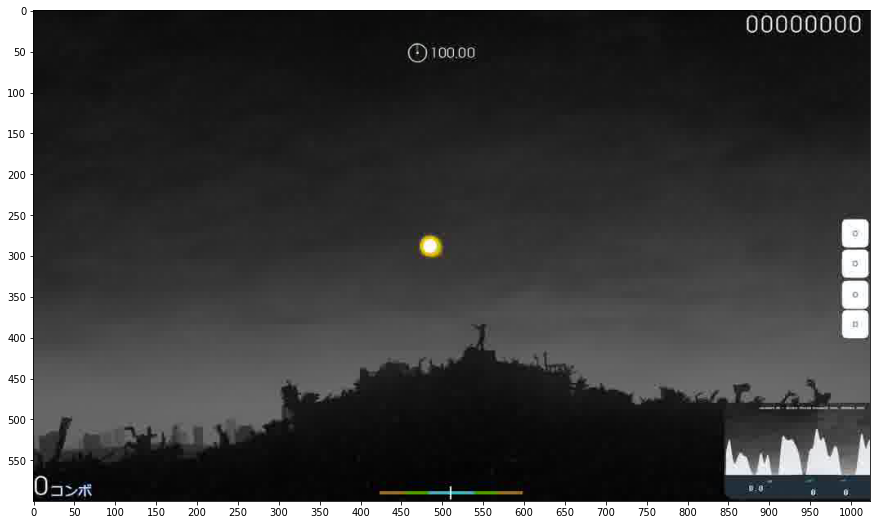

In [7]:
import matplotlib.pyplot as plt

import op

op.h = 600 / 2
op.w = 1024 / 2
op.calratio()

e = s[0]
print(e[0][0].permute(1, 2, 0).numpy().shape)

plt.rcParams["figure.figsize"] = (15, 15)

plt.xticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[1], 50))
plt.yticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[0], 50))

plt.imshow(cv2.cvtColor(e[0][0].permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
print(e[1][0][1], e[1][0][0])
print(op.cor(e[1][0][1] * 512, e[1][0][0] * 384))
#print(op.cor(e[1][0][1], e[1][0][0]))
#for x in e[1][0:10]:
    #print(op.cor(x[0], x[1]))

# Constants

In [9]:
sample_rate = 44100
hop_size = 441*2
hidden_mod = 3
maximum = 32
width = 4
ds_path = './datasets/VN/ds.pkl'
model_path = './models/VN/model02_'

# Process Data

In [55]:
import time

In [35]:
ds = OSR_Dataset('../beatmaps', sample_rate=sample_rate, hop_size=hop_size, hidden_mod=hidden_mod, maximum=maximum)

0/31 Chata - Engage (Lasse) [Insane].osu
1/31 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/31 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/31 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/31 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/31 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/31 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/31 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/31 fripSide - future gazer (TV Size) (alacat) [Insane].osu
9/31 cYsmix - bells! (Gero) [normal!].osu
10/31 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/31 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/31 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/31 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu
14/31 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu
15/31 Narushima - Gothic and 

In [36]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

0.01752758026123047 secs


# Load Daaset

In [10]:
ds = torch.load(ds_path)

# Model

In [11]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as nnF

In [12]:
class VN(nn.Module):
    def __init__(self, dim_in, device):
        super(VN, self).__init__()
        
        self.device = device
        self.lstmA_size = 64
        self.lstmA_layers = 2
        self.dim_out = 2

        cA = [0,0]
        W = dim_in[0]
        K = cAK = 4
        P = cAP = 1
        S = cAS = 2
        w = int(((W - K + 2*P)/S) + 1)
        k = mAk = 2
        p = mAp = 0
        s = mAs = 2
        m = int(((w - k + 2*p)/s) + 1)
        cA[0] = w
        
        W = dim_in[1]
        K = cAK
        P = cAP
        S = cAS
        w = int(((W - K + 2*P)/S) + 1)
        k = mAk
        p = mAp
        s = mAs
        m = int(((w - k + 2*p)/s) + 1)
        cA[1] = w
        
        cB = [0,0]
        W = cA[0]
        K = cBK = 4
        P = cBP = 1
        S = cBS = 2
        w = int(((W - K + 2*P)/S) + 1)
        k = mBk = 2
        p = mBp = 0
        s = mBs = 2
        m = int(((w - k + 2*p)/s) + 1)
        cB[0] = w
        
        W = cA[1]
        K = cBK
        P = cBP
        S = cBS
        w = int(((W - K + 2*P)/S) + 1)
        k = mBk
        p = mBp
        s = mBs
        m = int(((w - k + 2*p)/s) + 1)
        cB[1] = w
        
        
        self.convA = nn.Conv2d(3, 1, cAK, stride=cAS, padding=cAP)
        #self.maxPA = nn.MaxPool2d(mAk, stride=mAs, padding=mAp)
        self.convB = nn.Conv2d(1, 1, cBK, stride=cBS, padding=cBP) 
        #self.maxPB = nn.MaxPool2d(mBk, stride=mBs, padding=mBp)
        self.linear1 = nn.Linear(math.prod(cB),  int(math.prod(cB)/4))
        
        self.lstmA = nn.LSTM(int(math.prod(cB)/4), hidden_size=self.lstmA_size, num_layers=self.lstmA_layers,
                             batch_first=True, bidirectional=False)
        self.linearA = nn.Linear(self.lstmA_size, 32)
        self.linearB = nn.Linear(32, self.dim_out)
        
        self.hiddenA = None
        
    def init_hidden(self, batch_size):
        h = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        c = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        self.hiddenA = (h, c)
 
    def forward(self, x):
        s = x.shape
        x = torch.reshape(x, (s[0] * s[1], s[2], s[3], s[4]))
        x = self.convA(x)
        x = nnF.relu(x)
        #x = self.maxPA(x)
        x = self.convB(x)
        x = nnF.relu(x)
        #x = self.maxPB(x)
        x = torch.flatten(x, start_dim=1)
        x = torch.reshape(x, (s[0], s[1], x.shape[-1]))
                          
        x = self.linear1(x)
        x = nnF.relu(x)

        
        x, self.hiddenA = self.lstmA(x, self.hiddenA)
        x = self.linearA(x)
        x = nnF.relu(x)
        x = self.linearB(x)
        
        return x

# Training

In [13]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt
import op

In [14]:
batch_size = 2
scale = 1/4
dim_in = (int(600 * scale), int(1024 * scale))
seq_dur = 4

In [15]:
device = torch.device('cuda')

In [16]:
epoch_cum = 0
val_hist = []
train_hist = []
vn = VN(dim_in=dim_in, device=device)
vn.to(device)

VN(
  (convA): Conv2d(3, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (convB): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (linear1): Linear(in_features=2368, out_features=592, bias=True)
  (lstmA): LSTM(592, 64, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=64, out_features=32, bias=True)
  (linearB): Linear(in_features=32, out_features=2, bias=True)
)

In [17]:
vn.init_hidden(1)
summary(vn, input_size=(1, 1, 3, dim_in[0], dim_in[1]), col_width=16,
           col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
VN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 3, 150, 256] [1, 1, 75, 128]  49               [3, 1, 4, 4]     470,400
├─Conv2d: 1-2                            [1, 1, 75, 128]  [1, 1, 37, 64]   17               [1, 1, 4, 4]     40,256
├─Linear: 1-3                            [1, 1, 2368]     [1, 1, 592]      1,402,448        [2368, 592]      1,402,448
├─LSTM: 1-4                              [1, 1, 592]      [1, 1, 64]       201,728          --               201,728
├─Linear: 1-5                            [1, 1, 64]       [1, 1, 32]       2,080            [64, 32]         2,080
├─Linear: 1-6                            [1, 1, 32]       [1, 1, 2]        66               [32, 2]          66
Total params: 1,606,388
Trainable params: 1,606,388
Non-trainable params:

In [18]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

In [19]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(vn.parameters(), lr=0.001)

In [20]:
op.h = dim_in[0]
op.w = dim_in[1]
op.calratio()

def trainVN():
    global epoch_cum, lamb
    global v, c, PV, pv, g, gt, MP, MC

    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            mp = PV.cpu()
            mc = c
            for i in range(c.shape[0]):
                for j in range(c.shape[1]):
                    xc = c[i][j][2]
                    mc[i][j] = torch.tensor([c[i][j][0]*xc, c[i][j][1]*xc, c[i][j][2]])
                    mp[i][j] = torch.tensor([mp[i][j][0]*xc, mp[i][j][1]*xc])

            loss1 = criterion(PV, C[:,:,:2])
            loss2 = criterion(mp, mc[:,:,:2])
            loss = loss1 + loss2 * lamb
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for v, c in val_ldr:
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss1 = criterion(PV, C[:,:,:2])
            loss2 = criterion(mp, mc[:,:,:2])
            loss = loss1 + loss2 * lamb
            val_loss += loss.item()

        print(epoch+epoch_cum, 'of', epochs+epoch_cum)

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 3)
        
        e = v[0][10].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[0], pv[1])
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[0], gt[1])
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        
        plt.show()

    epoch_cum += epochs

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  3.1875                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 64
pred: 0.06237958371639252 0.28030624985694885
gt: 0.4398995637893677 0.43883928656578064
(116, 69)


<Figure size 1080x360 with 0 Axes>

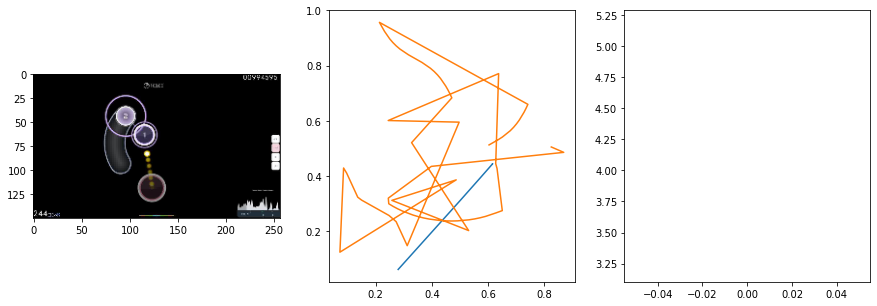

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  0.2540                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 64
pred: 0.1380329132080078 0.26031869649887085
gt: 0.007097888737916946 0.5117488503456116
(49, 77)


<Figure size 1080x360 with 0 Axes>

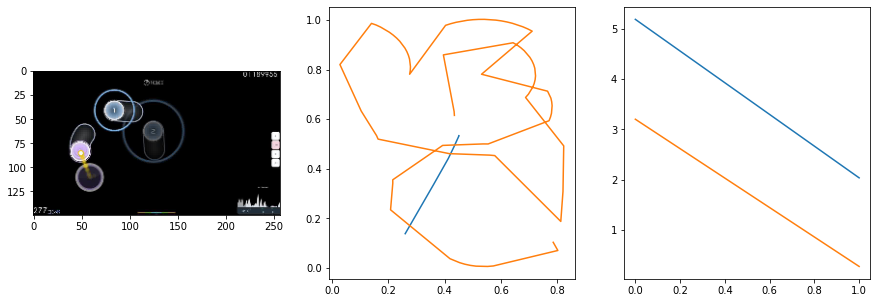

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  1.3079                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 64
pred: 0.12974481284618378 0.29489004611968994
gt: 0.8096078634262085 0.5
(173, 76)


<Figure size 1080x360 with 0 Axes>

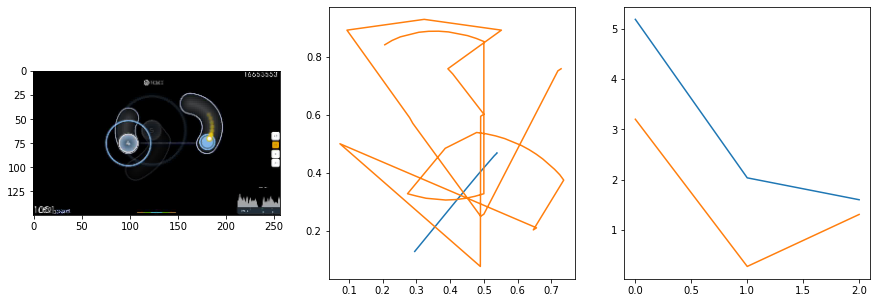

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  5.0099                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 64
pred: 0.14491760730743408 0.2649238407611847
gt: 0.671875 0.3125
(152, 54)


<Figure size 1080x360 with 0 Axes>

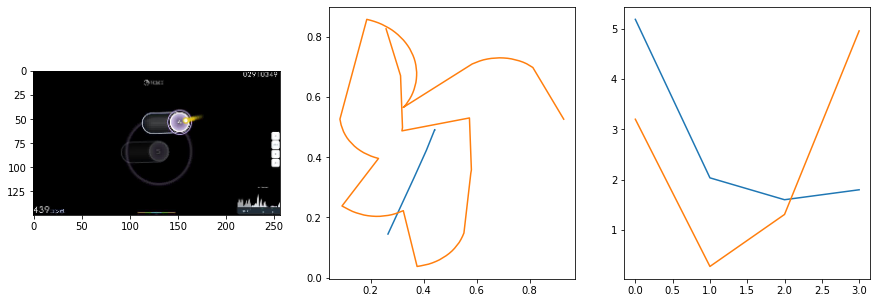

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  1.1773                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 64
pred: 0.1552313268184662 0.2869425415992737
gt: 0.566373884677887 0.283847838640213
(135, 51)


<Figure size 1080x360 with 0 Axes>

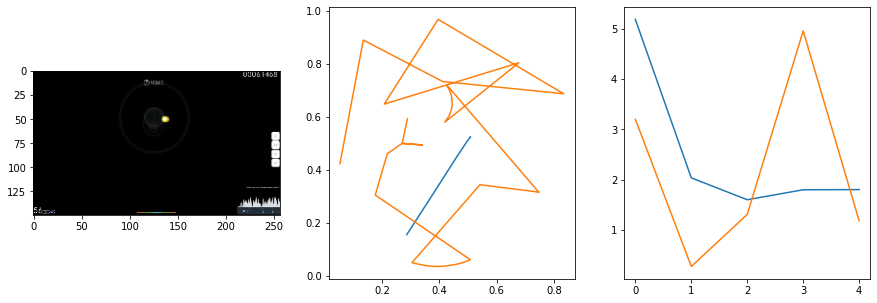

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  4.3001                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 64
pred: 0.1550007462501526 0.28247782588005066
gt: 0.654902994632721 0.6172174215316772
(149, 89)


<Figure size 1080x360 with 0 Axes>

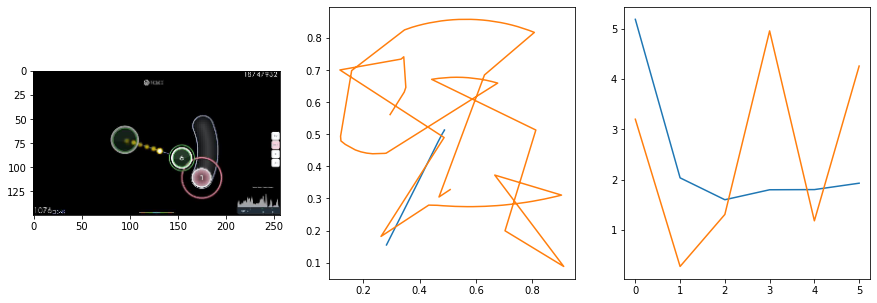

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  1.4935                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 64
pred: 0.1581914722919464 0.2901664674282074
gt: 0.322265625 0.3255208432674408
(97, 55)


<Figure size 1080x360 with 0 Axes>

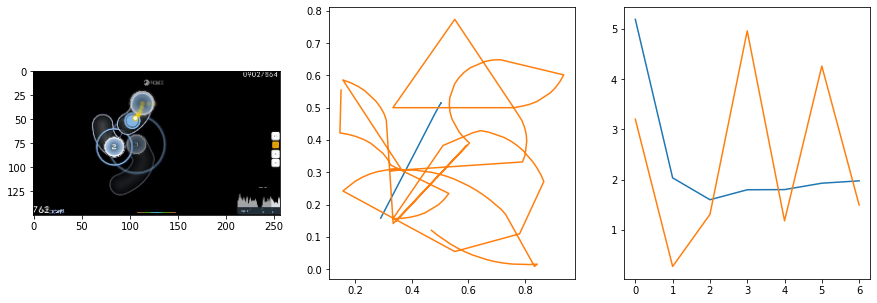

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  1.2123                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 64
pred: 0.157893568277359 0.2883956730365753
gt: 0.3754880726337433 0.3315344750881195
(106, 56)


<Figure size 1080x360 with 0 Axes>

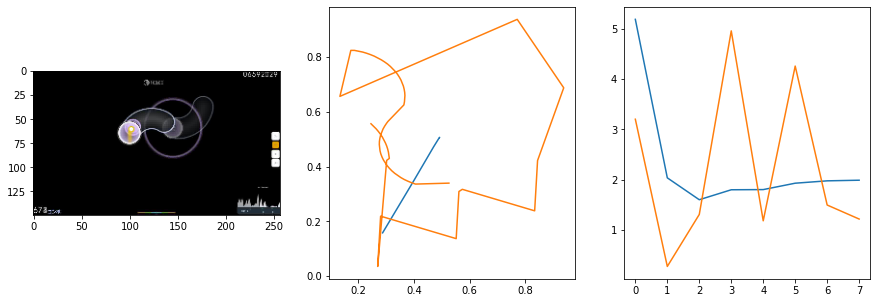

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  3.0400                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 64
pred: 0.15890759229660034 0.2992028594017029
gt: 0.2558082044124603 0.9007686972618103
(87, 122)


<Figure size 1080x360 with 0 Axes>

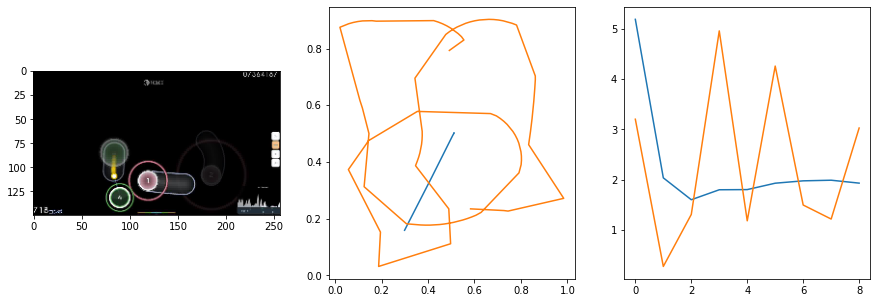

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  1.8349                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 64
pred: 0.1602027416229248 0.2855774164199829
gt: 0.7363011837005615 0.879131555557251
(162, 120)


<Figure size 1080x360 with 0 Axes>

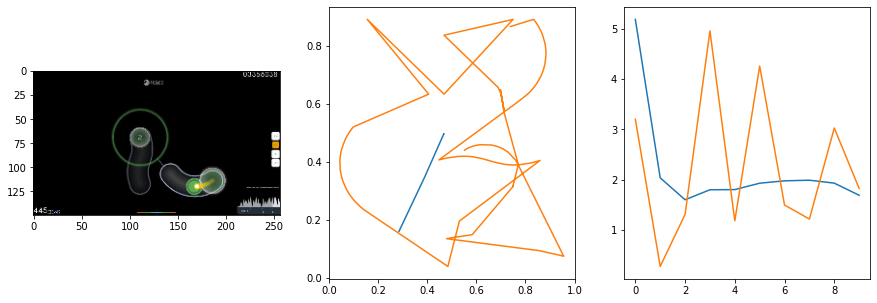

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.61it/s  2.2891                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 64
pred: 0.15169483423233032 0.30955272912979126
gt: 0.515625 0.6666666865348816
(127, 95)


<Figure size 1080x360 with 0 Axes>

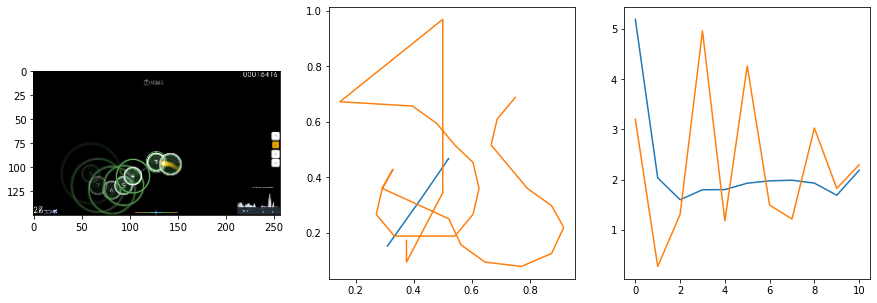

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.1689                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 64
pred: 0.16691049933433533 0.28462696075439453
gt: 0.18605287373065948 0.13799379765987396
(76, 34)


<Figure size 1080x360 with 0 Axes>

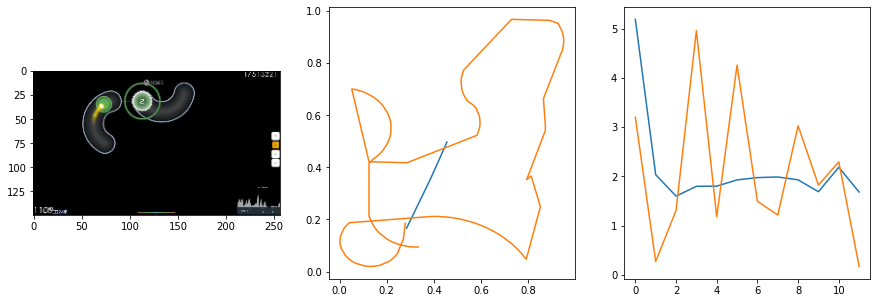

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  2.0808                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 64
pred: 0.15775366127490997 0.3117511570453644
gt: 0.4557291567325592 0.2118055671453476
(118, 42)


<Figure size 1080x360 with 0 Axes>

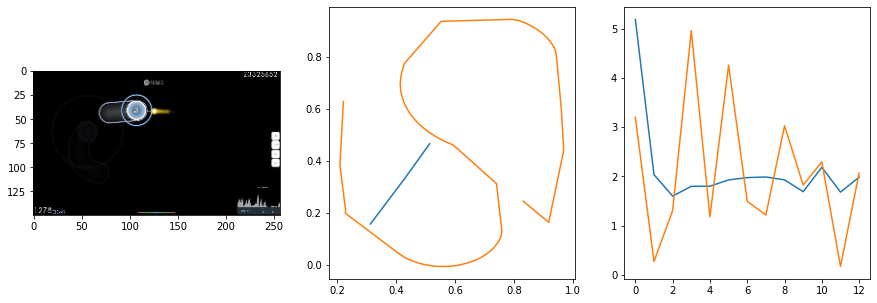

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  2.1087                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 64
pred: 0.16306376457214355 0.332523375749588
gt: 0.3577806055545807 0.15348638594150543
(103, 35)


<Figure size 1080x360 with 0 Axes>

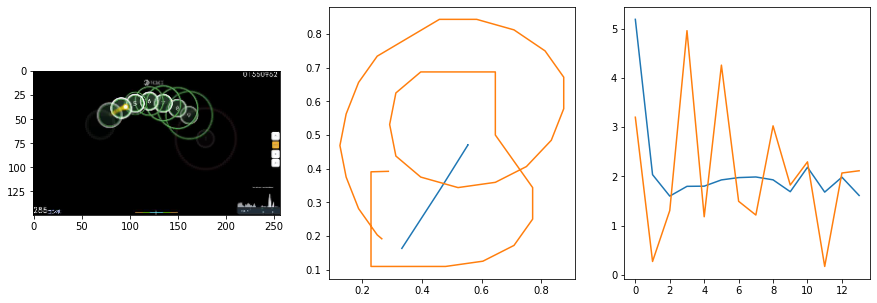

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  1.8291                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 64
pred: 0.20514746010303497 0.3020481467247009
gt: 0.16794635355472565 0.8314394354820251
(74, 114)


<Figure size 1080x360 with 0 Axes>

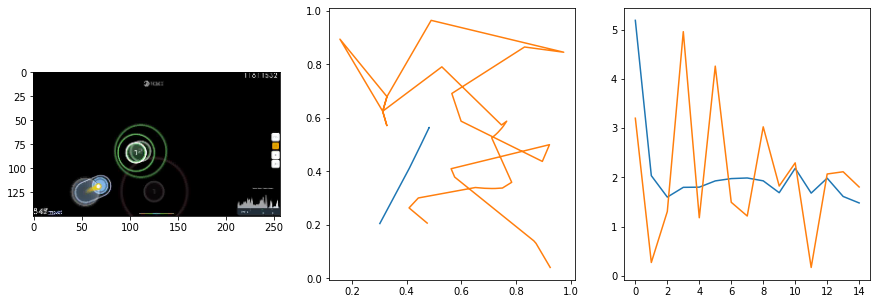

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  2.8359                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 64
pred: 0.19665907323360443 0.3137478828430176
gt: 0.8170582056045532 0.8308908343315125
(174, 114)


<Figure size 1080x360 with 0 Axes>

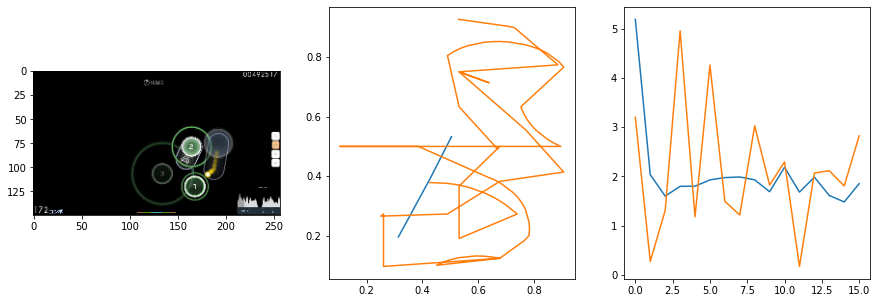

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  2.6108                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 64
pred: 0.15866810083389282 0.3342287838459015
gt: 0.16377314925193787 0.3459683656692505
(73, 58)


<Figure size 1080x360 with 0 Axes>

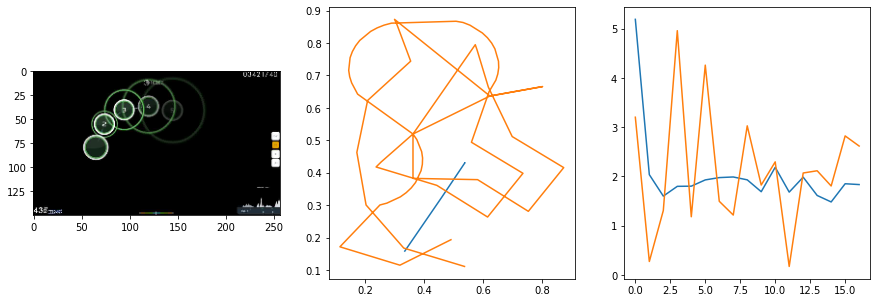

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  1.4968                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 64
pred: 0.20867441594600677 0.31646728515625
gt: 0.5008067488670349 0.7680169939994812
(125, 107)


<Figure size 1080x360 with 0 Axes>

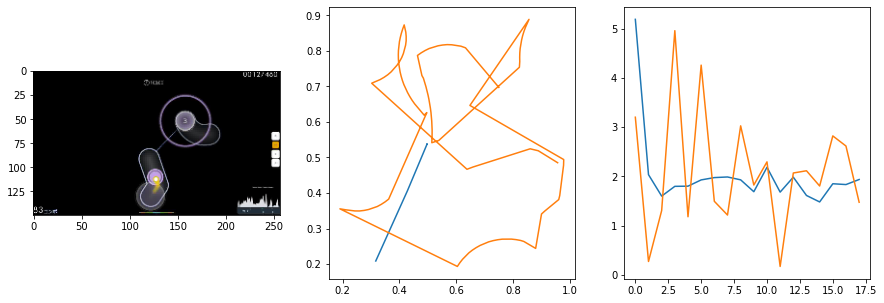

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.71it/s  0.7118                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 64
pred: 0.19673725962638855 0.30184394121170044
gt: 0.6853809356689453 0.6972699165344238
(154, 99)


<Figure size 1080x360 with 0 Axes>

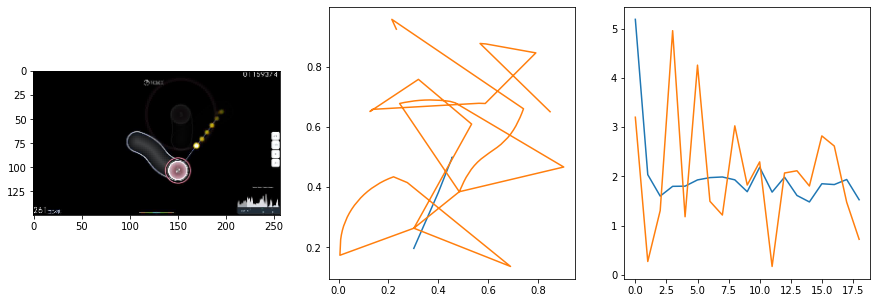

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  2.1826                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 64
pred: 0.17688937485218048 0.326829731464386
gt: 0.5933593511581421 0.22142601013183594
(140, 43)


<Figure size 1080x360 with 0 Axes>

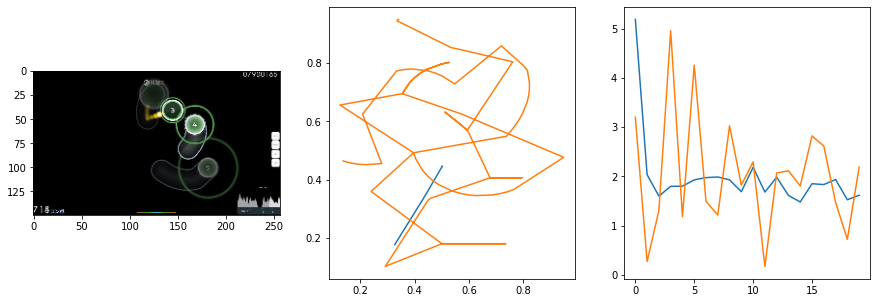

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.58it/s  0.4922                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 64
pred: 0.22748878598213196 0.31357666850090027
gt: 0.18227949738502502 0.6225418448448181
(76, 90)


<Figure size 1080x360 with 0 Axes>

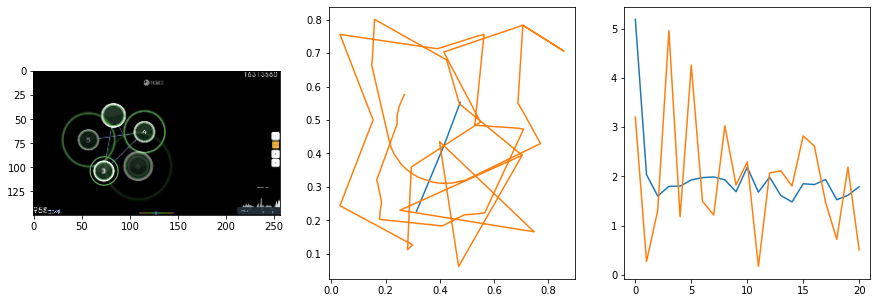

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.61it/s  1.0642                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 64
pred: 0.1979629397392273 0.34019994735717773
gt: 0.9154834151268005 0.48176586627960205
(189, 74)


<Figure size 1080x360 with 0 Axes>

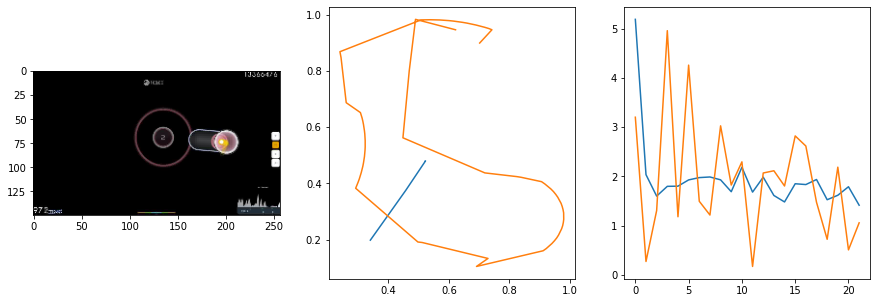

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  2.7527                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 64
pred: 0.19903166592121124 0.34158045053482056
gt: 0.2984693944454193 0.2708333432674408
(94, 49)


<Figure size 1080x360 with 0 Axes>

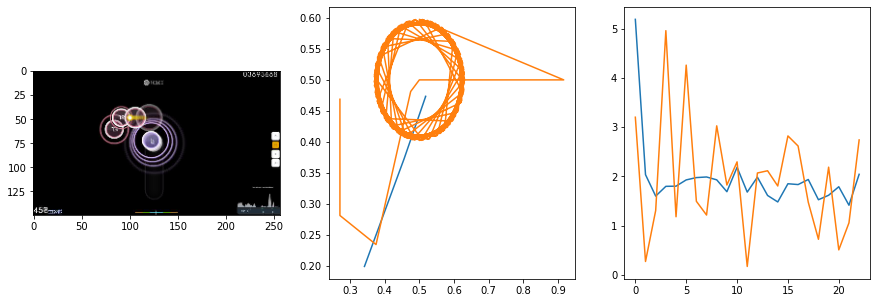

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  1.7016                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 64
pred: 0.2314424365758896 0.33022093772888184
gt: 0.19798018038272858 0.41829267144203186
(78, 66)


<Figure size 1080x360 with 0 Axes>

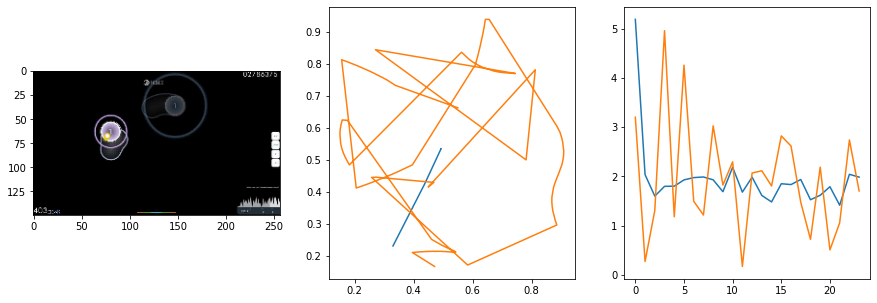

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.6248                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 64
pred: 0.19364608824253082 0.32366466522216797
gt: 0.9279499053955078 0.7548522353172302
(191, 105)


<Figure size 1080x360 with 0 Axes>

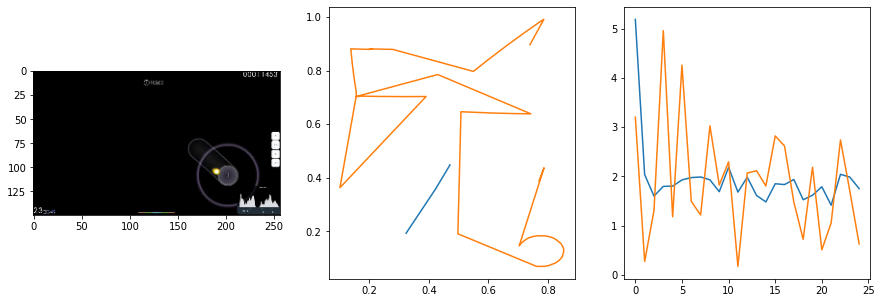

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  4.2763                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 64
pred: 0.22614705562591553 0.3601784110069275
gt: 0.7921053767204285 0.7230303287506104
(170, 102)


<Figure size 1080x360 with 0 Axes>

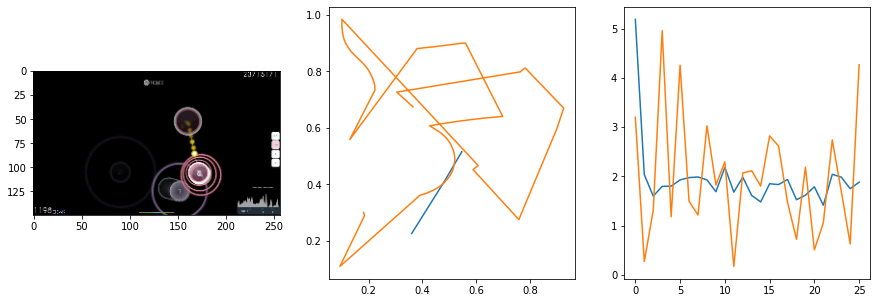

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  4.2135                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 64
pred: 0.22594211995601654 0.3266140818595886
gt: 0.4092881977558136 0.8408564925193787
(111, 115)


<Figure size 1080x360 with 0 Axes>

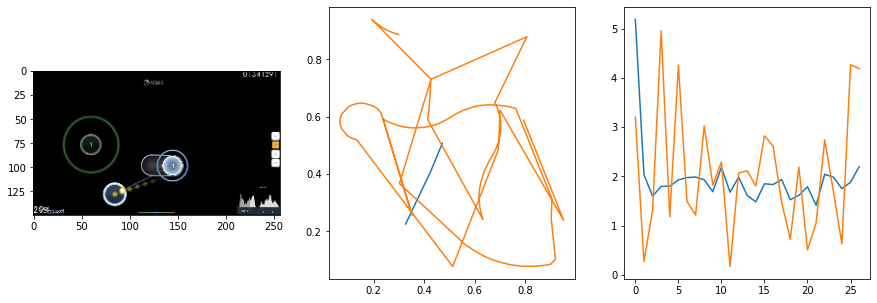

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  2.0810                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 64
pred: 0.22000396251678467 0.34770986437797546
gt: 0.5922860503196716 0.7567718029022217
(139, 106)


<Figure size 1080x360 with 0 Axes>

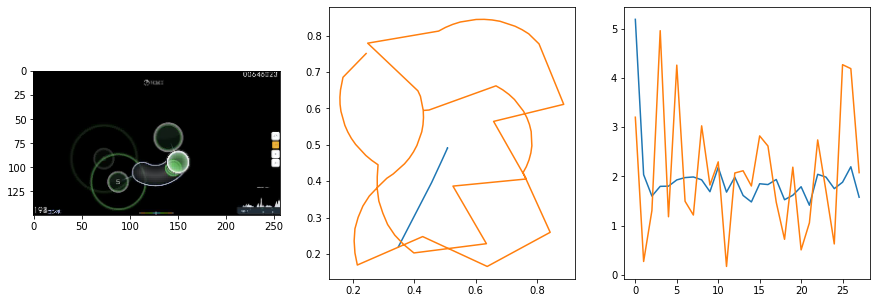

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  1.7300                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 64
pred: 0.2140921652317047 0.3465450704097748
gt: 0.5629300475120544 0.8766695857048035
(135, 119)


<Figure size 1080x360 with 0 Axes>

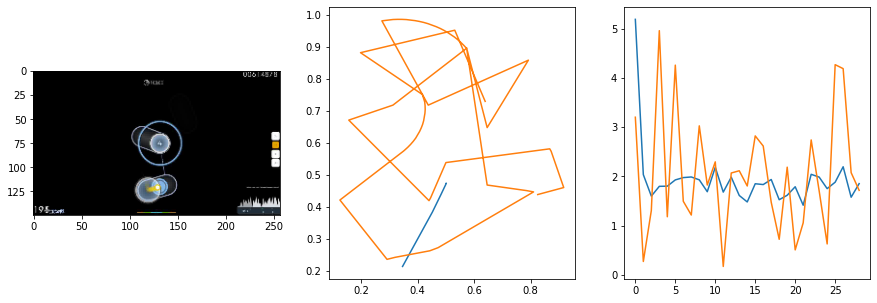

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  1.4939                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 64
pred: 0.21810826659202576 0.3491438627243042
gt: 0.4719780385494232 0.7762225270271301
(121, 108)


<Figure size 1080x360 with 0 Axes>

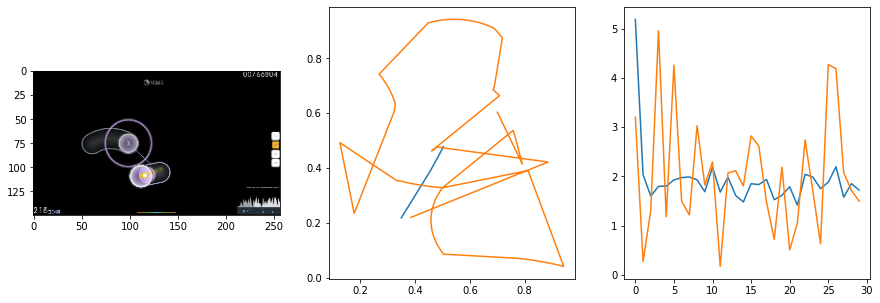

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  1.8472                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 64
pred: 0.21492187678813934 0.3813607692718506
gt: 0.224424809217453 0.2918250262737274
(82, 51)


<Figure size 1080x360 with 0 Axes>

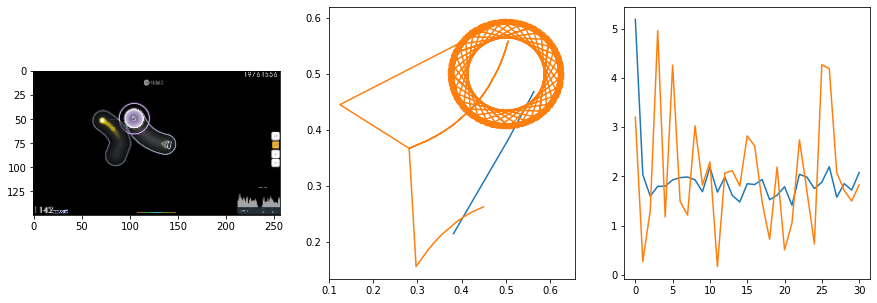

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  2.4968                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 64
pred: 0.24267250299453735 0.3542967140674591
gt: 0.5496651530265808 0.7061011791229248
(133, 100)


<Figure size 1080x360 with 0 Axes>

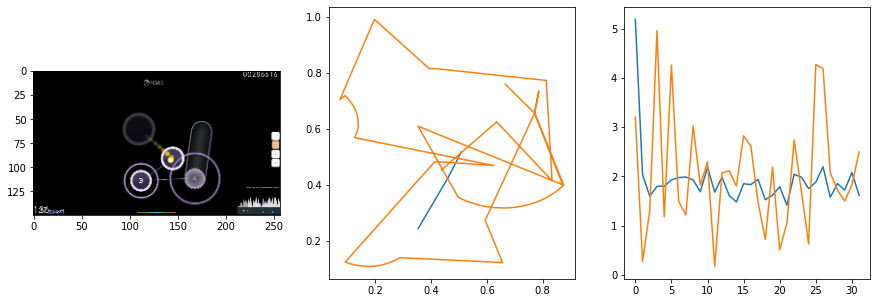

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.0297                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 64
pred: 0.22884368896484375 0.35206133127212524
gt: 0.9445533156394958 0.7770895957946777
(194, 108)


<Figure size 1080x360 with 0 Axes>

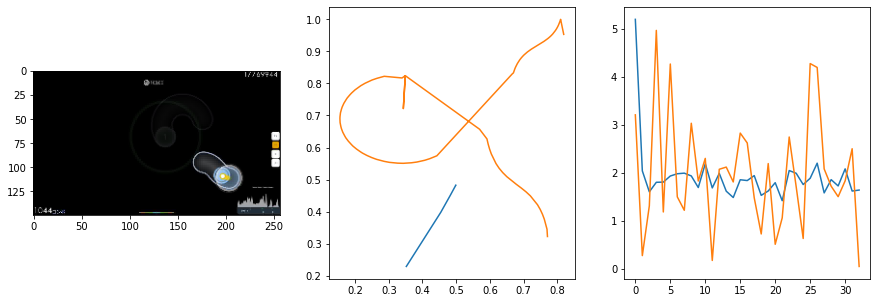

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.62it/s  0.5024                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 64
pred: 0.2485792338848114 0.3437671661376953
gt: 0.4579926133155823 0.2585163414478302
(119, 48)


<Figure size 1080x360 with 0 Axes>

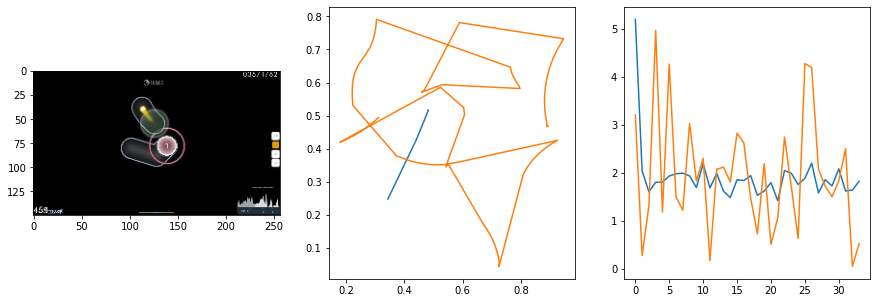

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.1399                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 64
pred: 0.23725676536560059 0.36200016736984253
gt: 0.22961127758026123 0.8515413403511047
(83, 117)


<Figure size 1080x360 with 0 Axes>

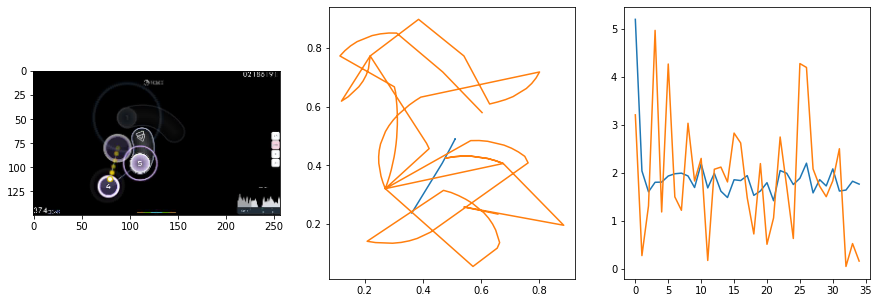

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  1.4401                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 64
pred: 0.24232840538024902 0.3571701645851135
gt: 0.3331845700740814 0.6191464066505432
(99, 90)


<Figure size 1080x360 with 0 Axes>

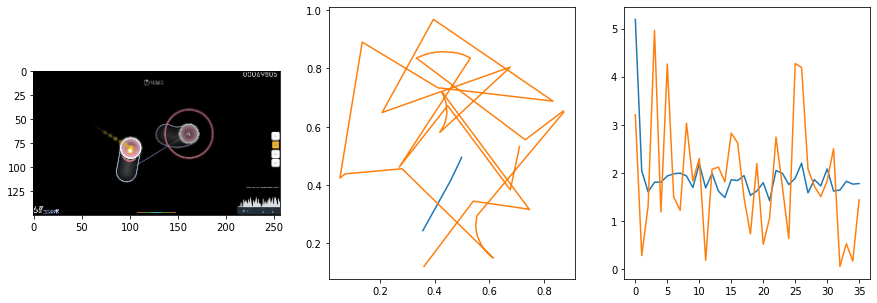

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.59it/s  1.4671                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 64
pred: 0.2575044631958008 0.3596343994140625
gt: 0.34535008668899536 0.48237133026123047
(101, 74)


<Figure size 1080x360 with 0 Axes>

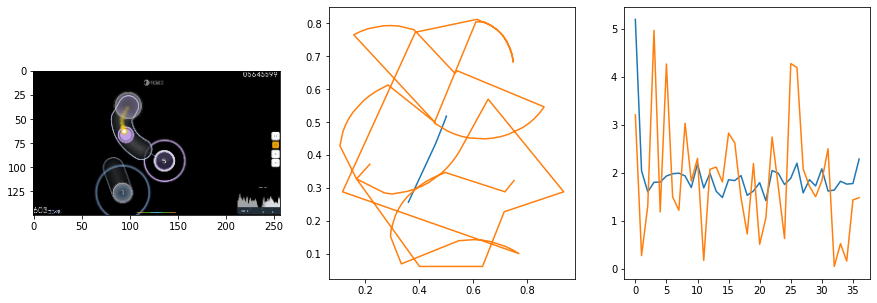

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  3.2284                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 64
pred: 0.22752636671066284 0.35636472702026367
gt: 0.3629591763019562 0.3672989308834076
(104, 60)


<Figure size 1080x360 with 0 Axes>

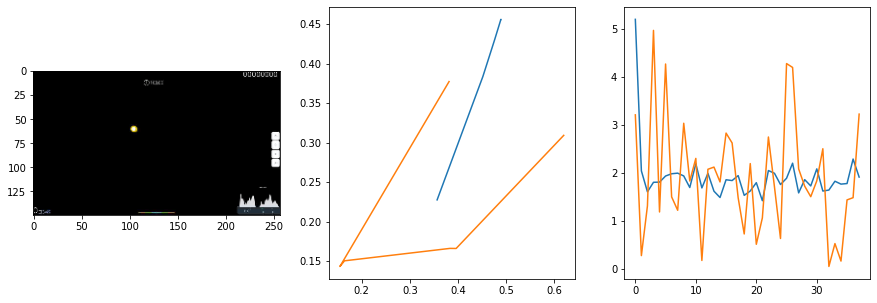

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  0.0006                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 64
pred: 0.26129862666130066 0.3741585612297058
gt: 0.6801120638847351 0.721807062625885
(153, 101)


<Figure size 1080x360 with 0 Axes>

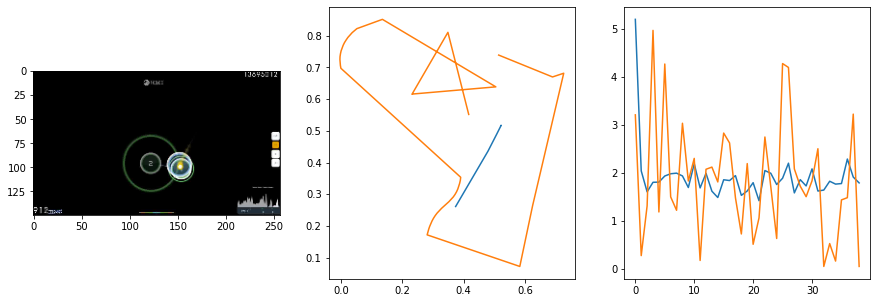

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.58it/s  0.0092                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 64
pred: 0.2545173764228821 0.37169149518013
gt: 0.5 0.2604166567325592
(125, 48)


<Figure size 1080x360 with 0 Axes>

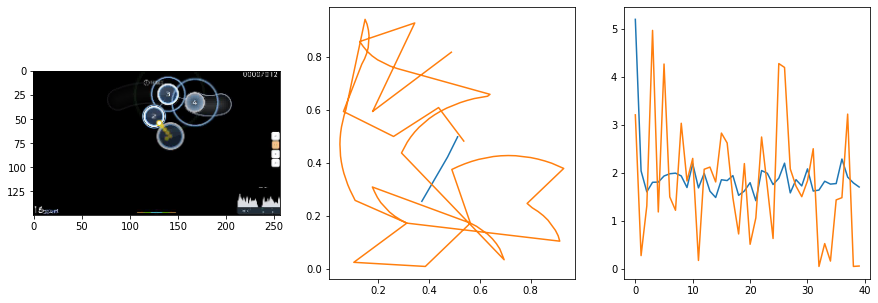

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  1.7608                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 64
pred: 0.24373896420001984 0.3738873600959778
gt: 0.37890625 0.5052083134651184
(106, 76)


<Figure size 1080x360 with 0 Axes>

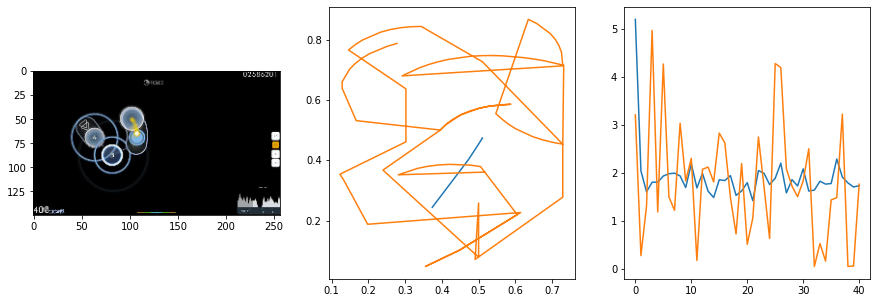

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  3.1088                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 64
pred: 0.26609736680984497 0.38387465476989746
gt: 0.5 0.8125
(125, 112)


<Figure size 1080x360 with 0 Axes>

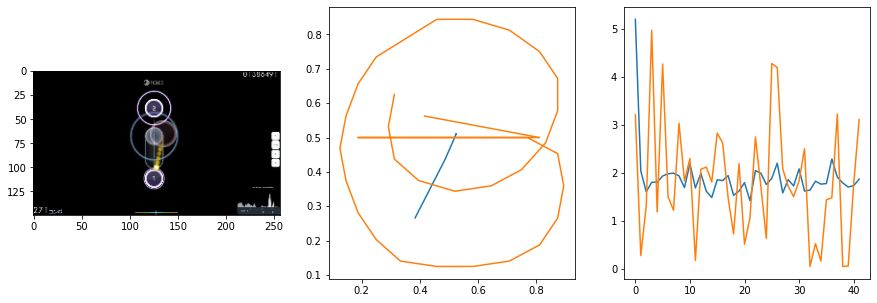

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  1.2899                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 64
pred: 0.2436661720275879 0.36916881799697876
gt: 0.2892880141735077 0.6807697415351868
(92, 97)


<Figure size 1080x360 with 0 Axes>

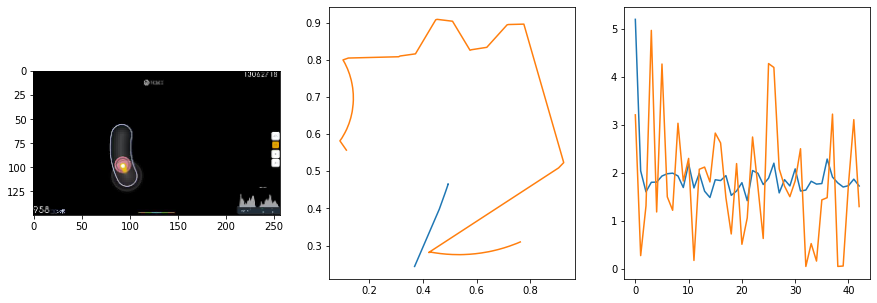

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  2.9216                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 64
pred: 0.25727546215057373 0.36573201417922974
gt: 0.7300999760627747 0.8901333212852478
(161, 121)


<Figure size 1080x360 with 0 Axes>

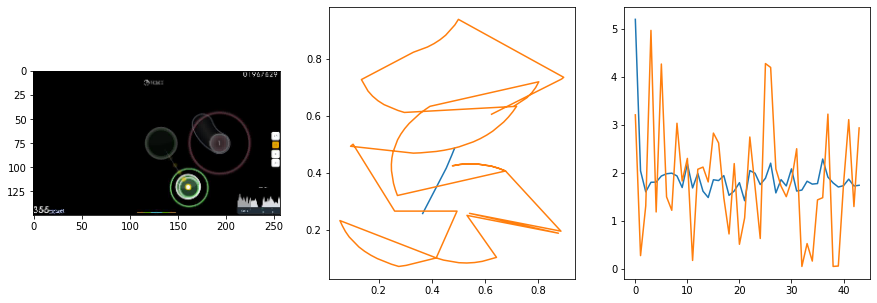

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  2.1870                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 64
pred: 0.2735613286495209 0.3665938973426819
gt: 0.8660814762115479 0.6250856518745422
(182, 90)


<Figure size 1080x360 with 0 Axes>

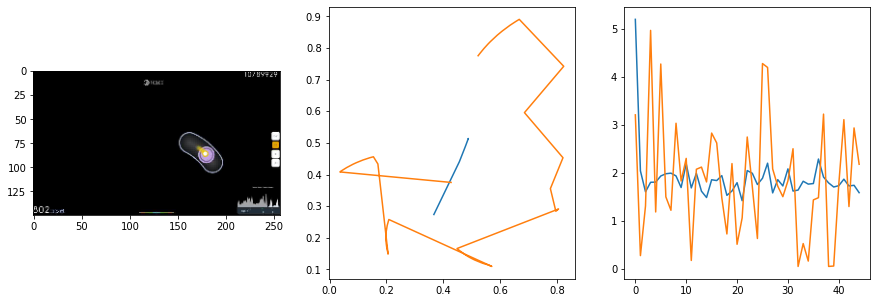

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.57it/s  0.9792                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 64
pred: 0.25945329666137695 0.35590657591819763
gt: 0.30922022461891174 0.7390919327735901
(95, 103)


<Figure size 1080x360 with 0 Axes>

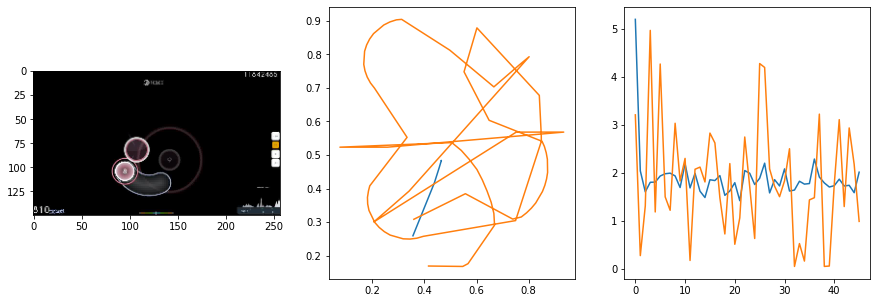

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.9997                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 64
pred: 0.2699154317378998 0.3878694176673889
gt: 0.5 0.5867013335227966
(125, 86)


<Figure size 1080x360 with 0 Axes>

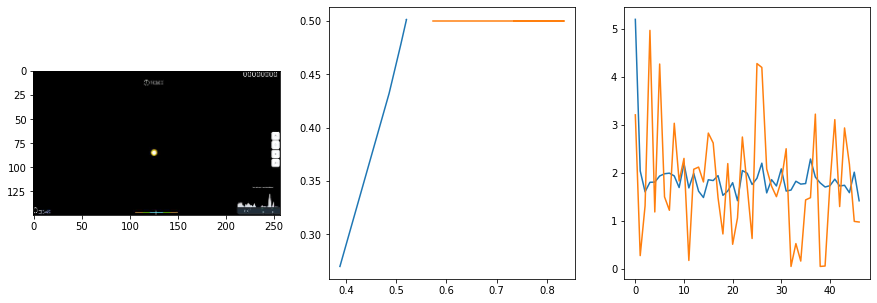

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.4413                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 64
pred: 0.27104759216308594 0.3838094472885132
gt: 0.56640625 0.6536458134651184
(135, 94)


<Figure size 1080x360 with 0 Axes>

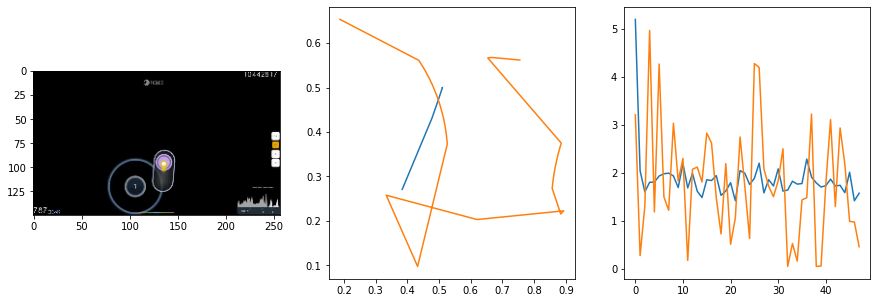

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.58it/s  0.9452                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 64
pred: 0.2807186245918274 0.37877482175827026
gt: 0.762499988079071 0.40416666865348816
(166, 65)


<Figure size 1080x360 with 0 Axes>

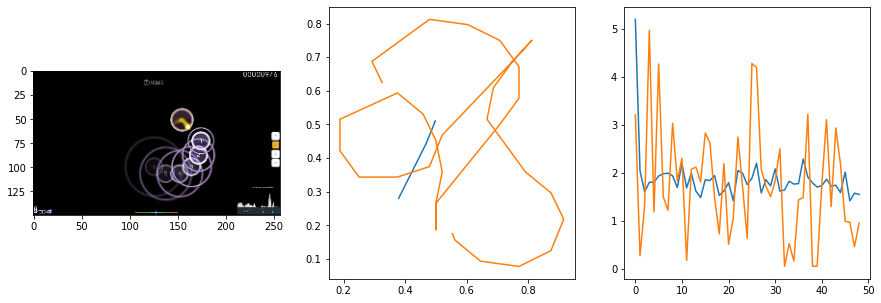

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  3.3201                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 64
pred: 0.27858877182006836 0.3927370309829712
gt: 0.5644142031669617 0.7014670372009277
(135, 99)


<Figure size 1080x360 with 0 Axes>

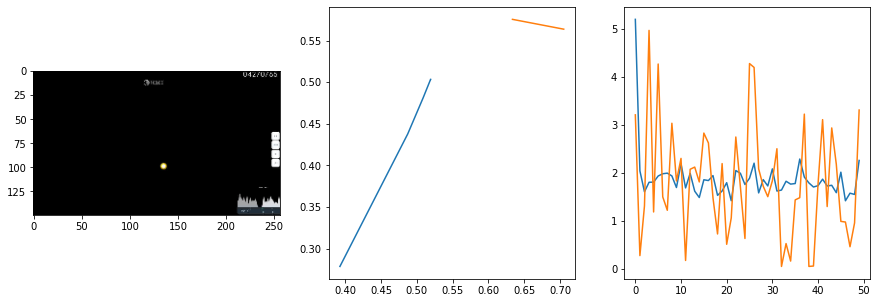

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  1.8124                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 64
pred: 0.27824604511260986 0.3860907554626465
gt: 0.024266818538308144 0.5493985414505005
(51, 81)


<Figure size 1080x360 with 0 Axes>

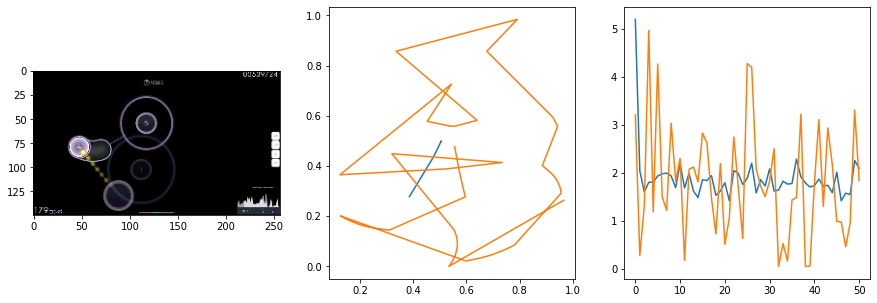

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.5056                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 64
pred: 0.2730253338813782 0.3680421710014343
gt: 0.542383074760437 0.47387608885765076
(132, 73)


<Figure size 1080x360 with 0 Axes>

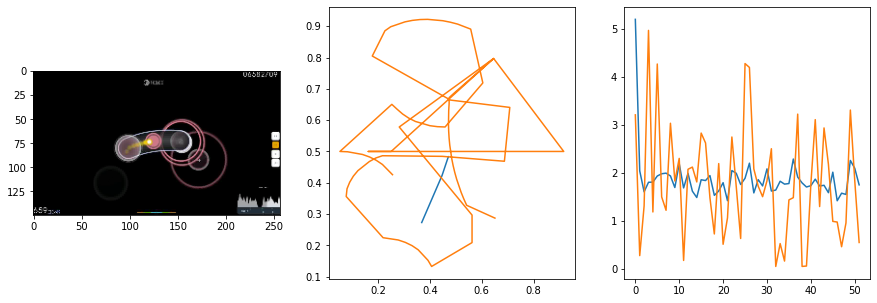

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  2.0560                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 64
pred: 0.27304142713546753 0.38542914390563965
gt: 0.5625 0.6458333134651184
(135, 93)


<Figure size 1080x360 with 0 Axes>

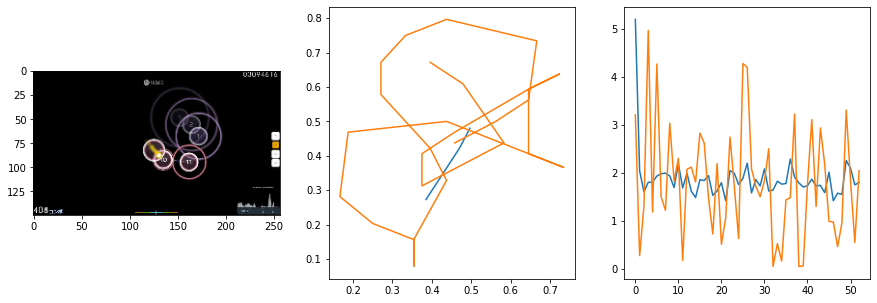

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  4.0834                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 64
pred: 0.276547908782959 0.3655320703983307
gt: 0.375 0.8854166865348816
(106, 120)


<Figure size 1080x360 with 0 Axes>

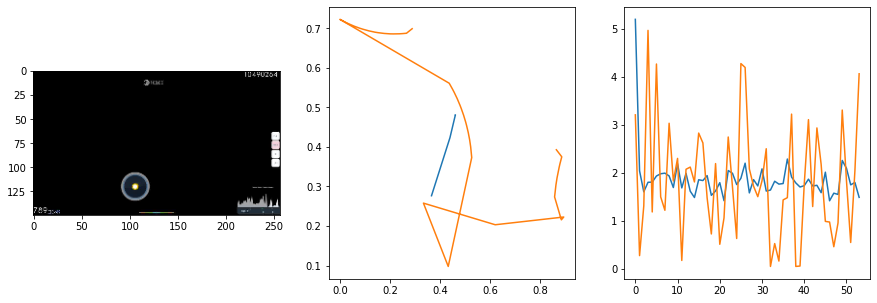

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.4115                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 64
pred: 0.29950323700904846 0.38085806369781494
gt: 0.75 0.8125
(164, 112)


<Figure size 1080x360 with 0 Axes>

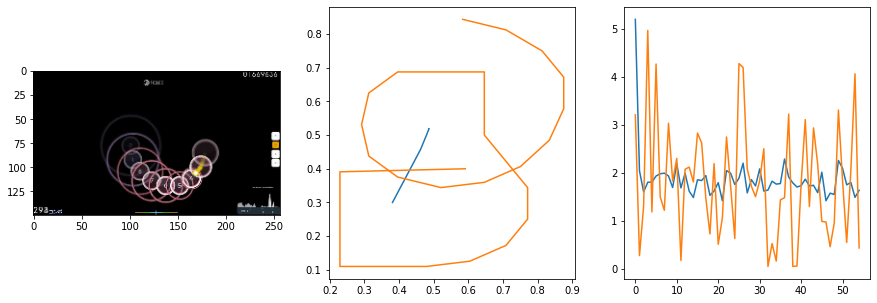

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  1.7789                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 64
pred: 0.27149659395217896 0.3740028738975525
gt: 0.5053123831748962 0.3699844777584076
(126, 61)


<Figure size 1080x360 with 0 Axes>

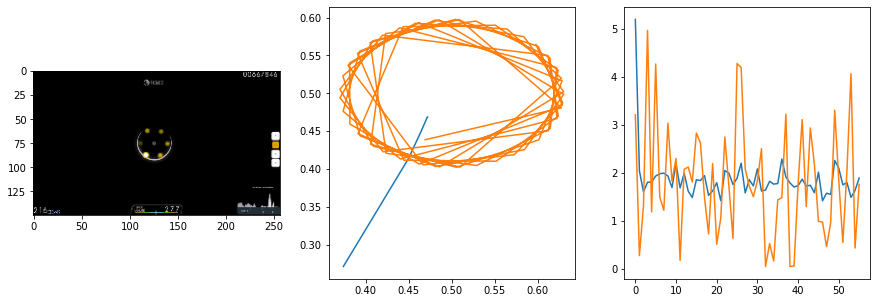

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  3.8141                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 64
pred: 0.27046656608581543 0.37663859128952026
gt: 0.5 0.5160064101219177
(125, 78)


<Figure size 1080x360 with 0 Axes>

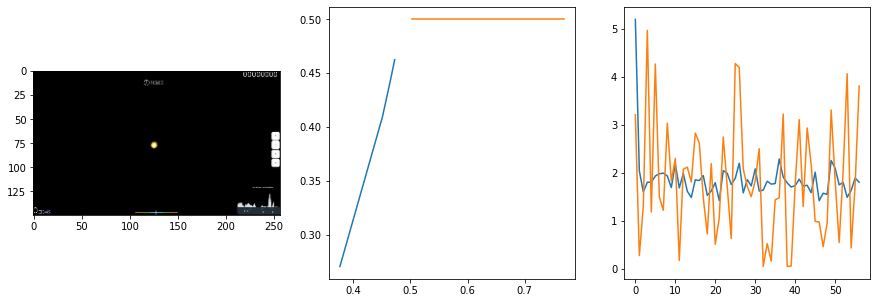

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  2.4946                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 64
pred: 0.30541273951530457 0.4147583246231079
gt: 0.43811455368995667 0.4667811393737793
(115, 72)


<Figure size 1080x360 with 0 Axes>

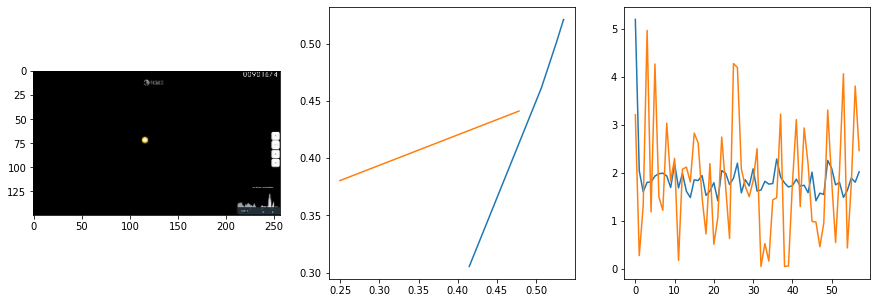

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.61it/s  3.0606                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 64
pred: 0.2604503035545349 0.39538952708244324
gt: 0.5 0.375
(125, 61)


<Figure size 1080x360 with 0 Axes>

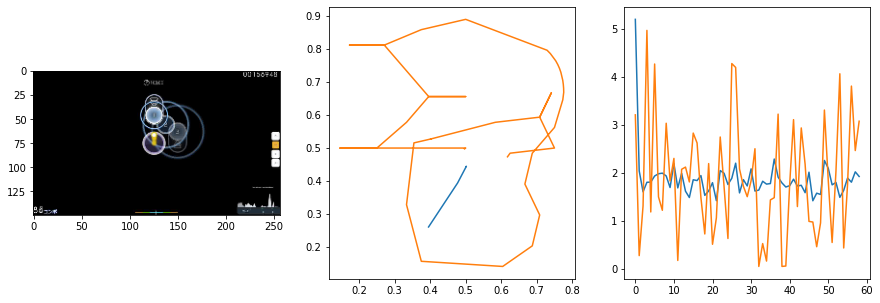

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  1.3648                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 64
pred: 0.28623777627944946 0.40504294633865356
gt: 0.6759583353996277 0.12031713128089905
(152, 31)


<Figure size 1080x360 with 0 Axes>

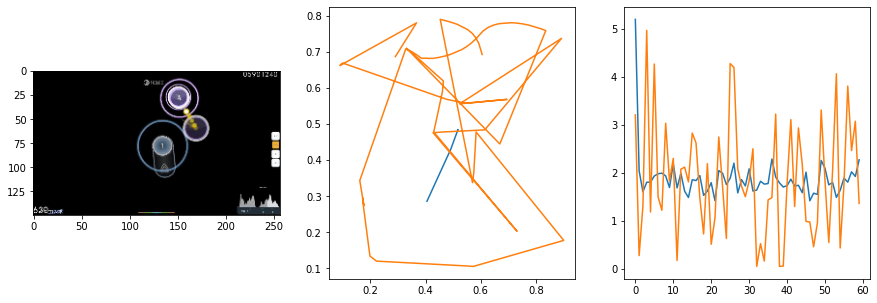

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.0819                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 64
pred: 0.28822803497314453 0.37089061737060547
gt: 0.8341156244277954 0.15082578361034393
(177, 35)


<Figure size 1080x360 with 0 Axes>

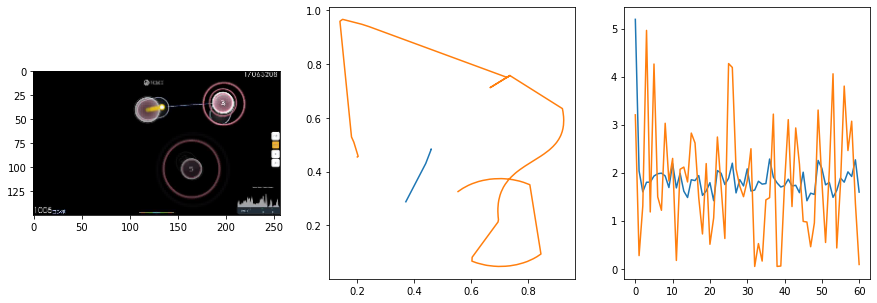

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  1.1726                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 64
pred: 0.31395265460014343 0.42591068148612976
gt: 0.8919634222984314 0.8497382998466492
(186, 116)


<Figure size 1080x360 with 0 Axes>

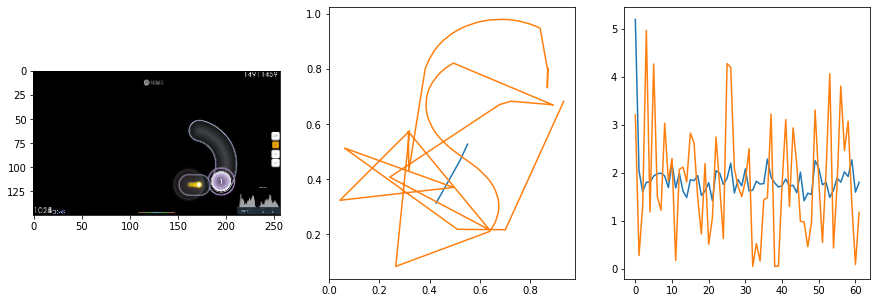

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  2.9167                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 64
pred: 0.28046607971191406 0.38023194670677185
gt: 0.197265625 0.3020833432674408
(78, 53)


<Figure size 1080x360 with 0 Axes>

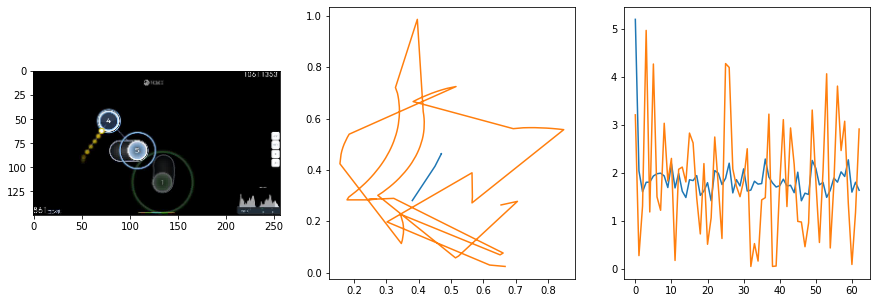

 Iters    Elapsed Time      Speed     loss                                      
 2/13   00:00:01<00:00:07  1.38it/s  1.4123                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

KeyboardInterrupt: 

In [21]:
start = time.time()

epochs = 24
lamb = 0.5
trainVN()

end = time.time()
print(end - start, 'secs')

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.6057                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

64 of 128
pred: 0.18117669224739075 0.32313647866249084
gt: 0.22190505266189575 0.4088541567325592
(82, 65)


<Figure size 1080x360 with 0 Axes>

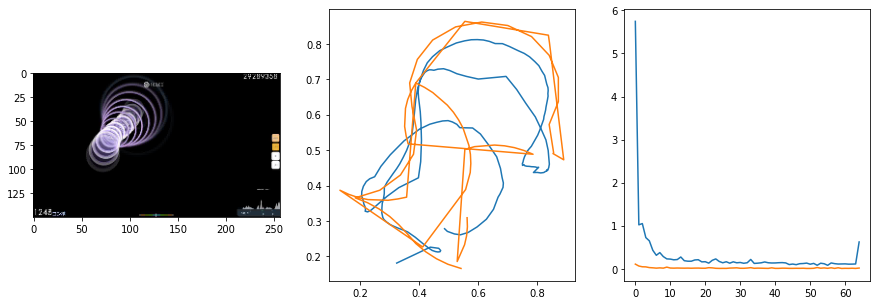

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  1.0068                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

65 of 128
pred: 0.47115468978881836 0.24104386568069458
gt: 0.7775202393531799 0.22674018144607544
(168, 44)


<Figure size 1080x360 with 0 Axes>

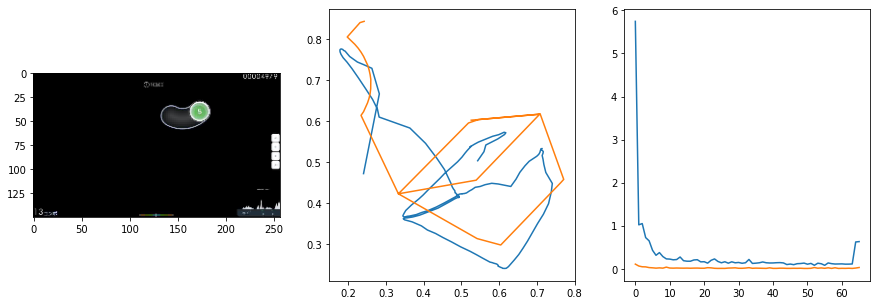

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  1.7788                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

66 of 128
pred: 0.4046708047389984 0.20382949709892273
gt: 0.5964220762252808 0.3928643465042114
(140, 63)


<Figure size 1080x360 with 0 Axes>

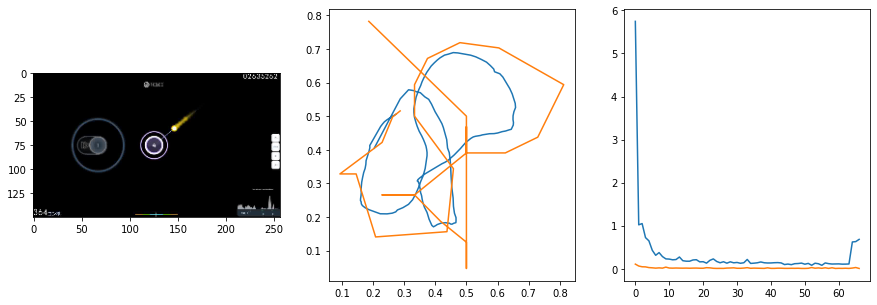

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.7196                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

67 of 128
pred: 0.3809850513935089 0.5095424652099609
gt: 0.490234375 0.7916666865348816
(124, 110)


<Figure size 1080x360 with 0 Axes>

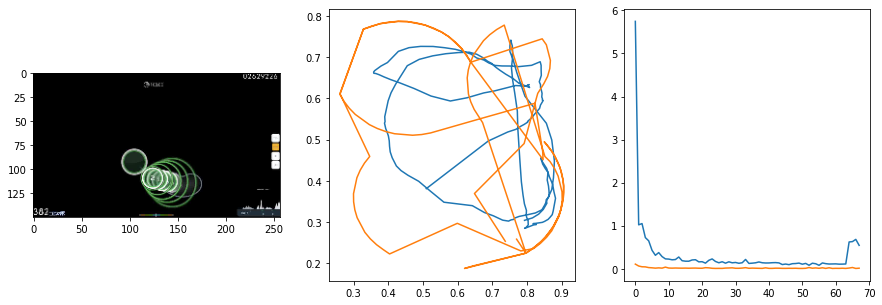

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.4932                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

68 of 128
pred: 0.43061280250549316 0.3148023188114166
gt: 0.6243014335632324 0.3534633219242096
(144, 59)


<Figure size 1080x360 with 0 Axes>

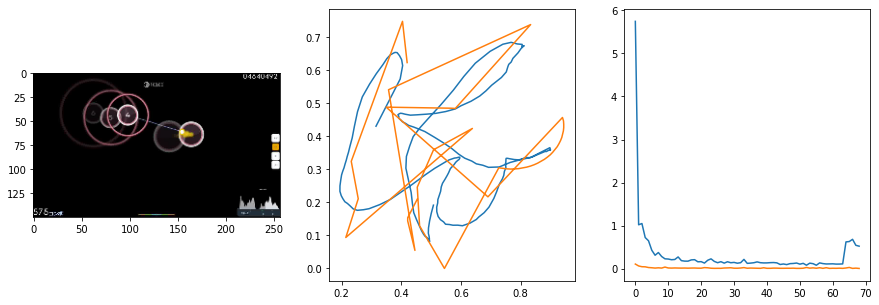

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.6226                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

69 of 128
pred: 0.4763345718383789 0.318902850151062
gt: 0.5 0.5
(125, 76)


<Figure size 1080x360 with 0 Axes>

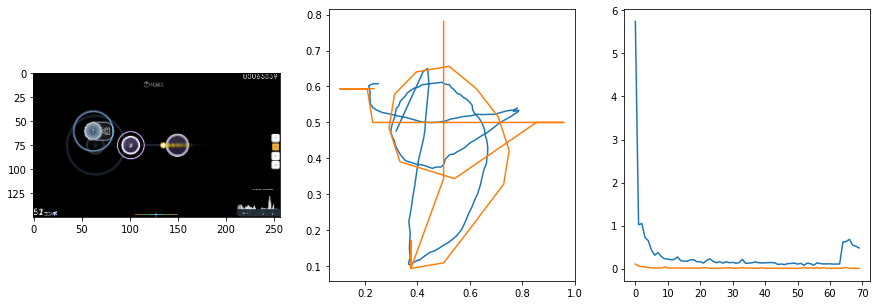

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  0.5919                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

70 of 128
pred: 0.37753167748451233 0.3788481652736664
gt: 0.5 0.7834150195121765
(125, 109)


<Figure size 1080x360 with 0 Axes>

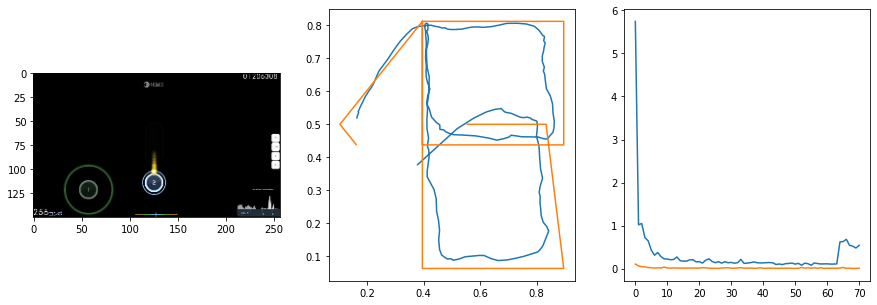

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.2298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

71 of 128
pred: 0.36867964267730713 0.4562024474143982
gt: 0.47265625 0.321066677570343
(121, 55)


<Figure size 1080x360 with 0 Axes>

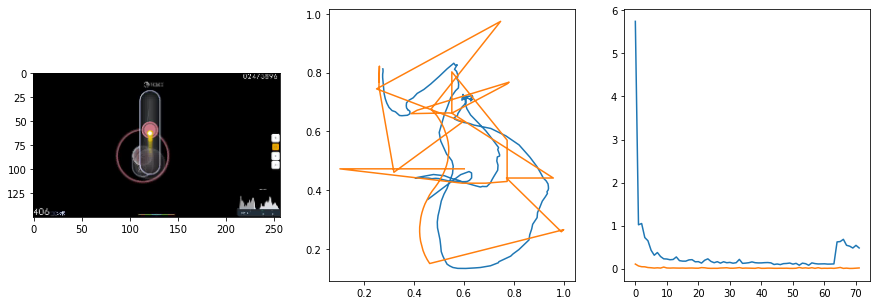

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  1.0315                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

72 of 128
pred: 0.2666488289833069 0.14828452467918396
gt: 0.4221145212650299 0.06045786663889885
(113, 25)


<Figure size 1080x360 with 0 Axes>

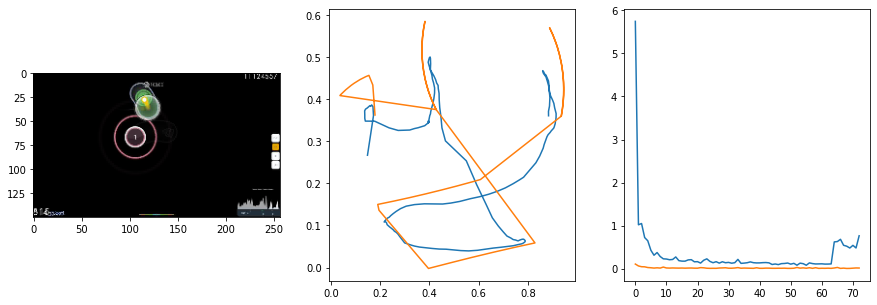

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  0.5885                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

73 of 128
pred: 0.539593517780304 0.44605499505996704
gt: 0.6668276786804199 0.4146318733692169
(151, 66)


<Figure size 1080x360 with 0 Axes>

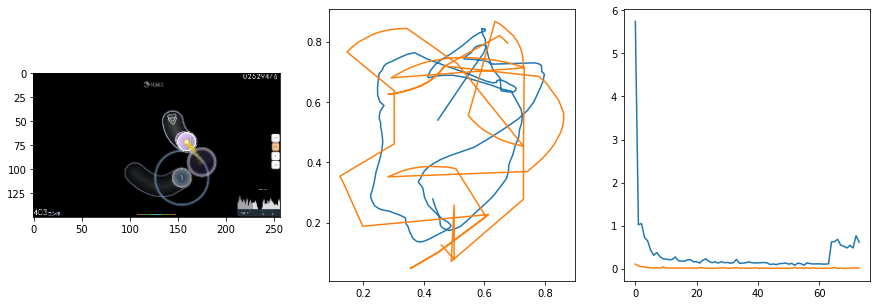

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.4792                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

74 of 128
pred: 0.499437153339386 0.5495437383651733
gt: 0.7781553864479065 0.8141090273857117
(168, 112)


<Figure size 1080x360 with 0 Axes>

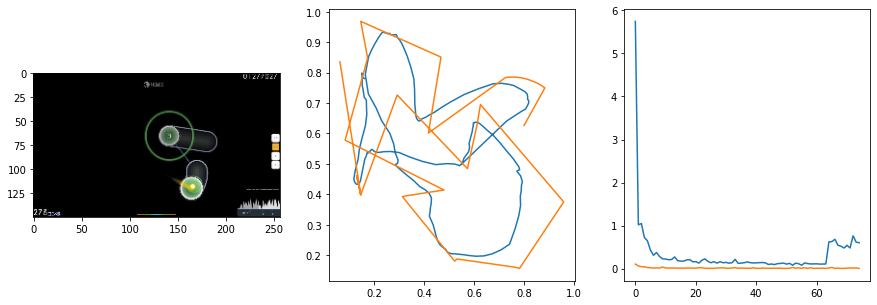

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.9700                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

75 of 128
pred: 0.32946446537971497 0.3820185661315918
gt: 0.40273740887641907 0.7136628031730652
(110, 101)


<Figure size 1080x360 with 0 Axes>

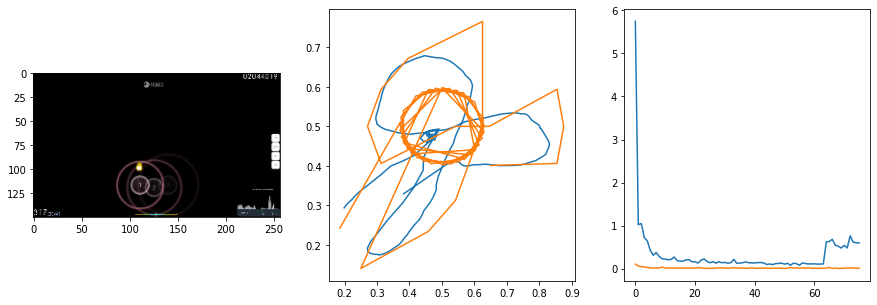

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  0.5561                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

76 of 128
pred: 0.4900318682193756 0.1867523193359375
gt: 0.8080032467842102 0.3282509446144104
(173, 56)


<Figure size 1080x360 with 0 Axes>

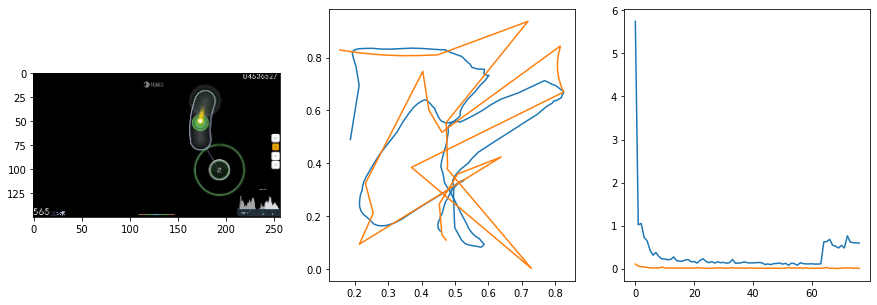

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.0304                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

77 of 128
pred: 0.4782165586948395 0.34100115299224854
gt: 0.6623086929321289 0.35374149680137634
(150, 59)


<Figure size 1080x360 with 0 Axes>

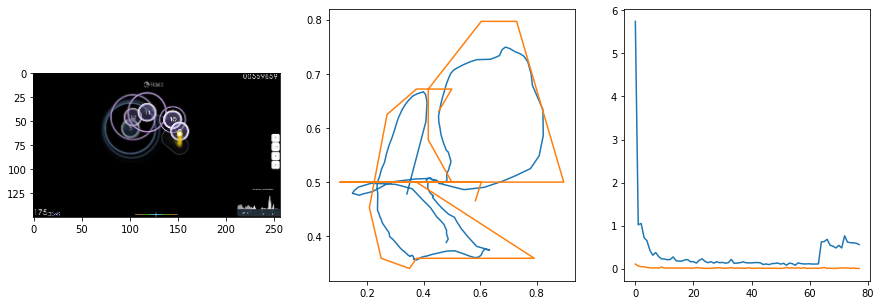

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.62it/s  1.1378                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

78 of 128
pred: 0.49615123867988586 0.3878787159919739
gt: 0.567365288734436 0.7887349724769592
(135, 109)


<Figure size 1080x360 with 0 Axes>

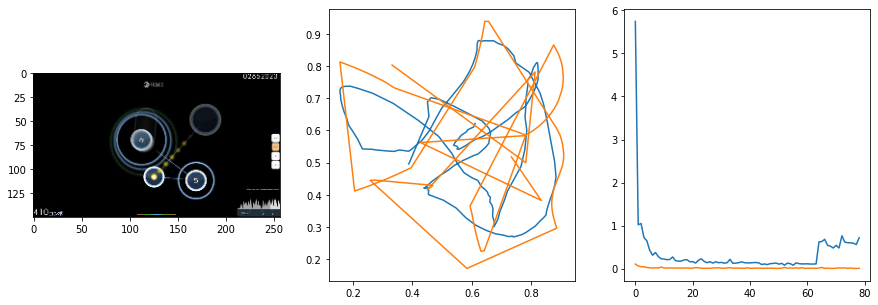

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  1.4644                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

79 of 128
pred: 0.36916637420654297 0.6553677916526794
gt: 0.25850000977516174 0.9904999732971191
(88, 133)


<Figure size 1080x360 with 0 Axes>

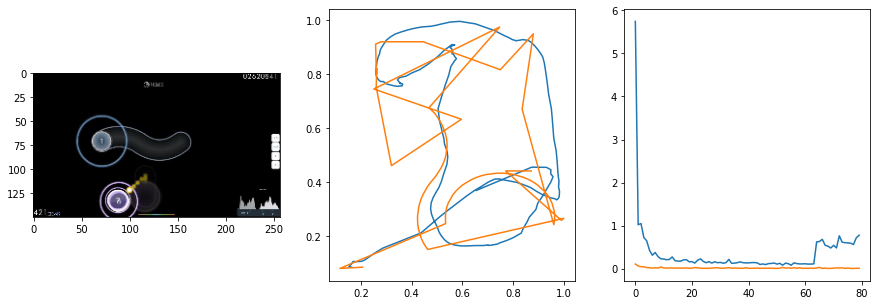

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.0235                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

80 of 128
pred: 0.4107918441295624 0.320399671792984
gt: 0.7500525116920471 0.5428720712661743
(164, 81)


<Figure size 1080x360 with 0 Axes>

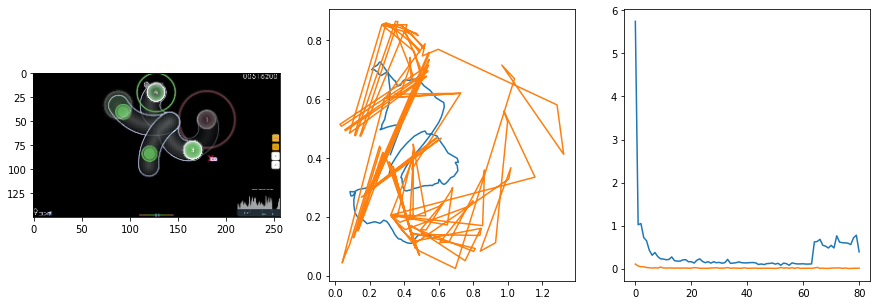

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  1.0195                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

81 of 128
pred: 0.3179057240486145 0.37021952867507935
gt: 0.29832687973976135 0.32903146743774414
(94, 56)


<Figure size 1080x360 with 0 Axes>

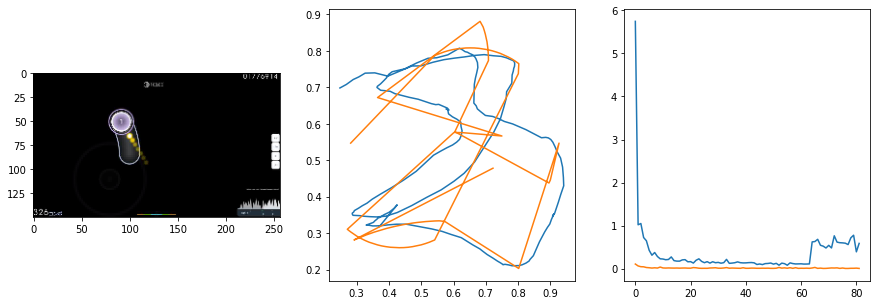

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.4425                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

82 of 128
pred: 0.5375080108642578 0.39630043506622314
gt: 0.6539062261581421 0.7171130776405334
(149, 101)


<Figure size 1080x360 with 0 Axes>

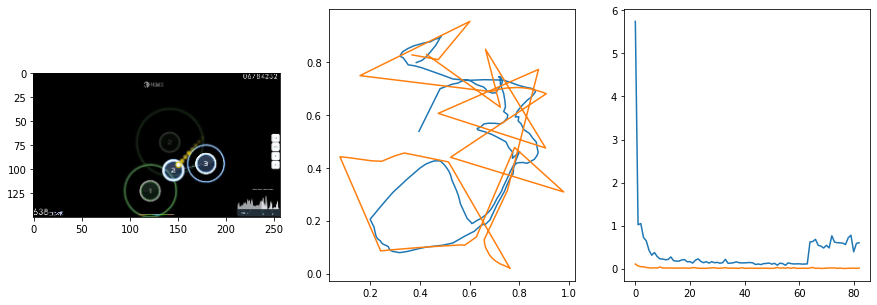

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.6922                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

83 of 128
pred: 0.2857480049133301 0.4643647074699402
gt: 0.44256120920181274 0.9199545383453369
(116, 124)


<Figure size 1080x360 with 0 Axes>

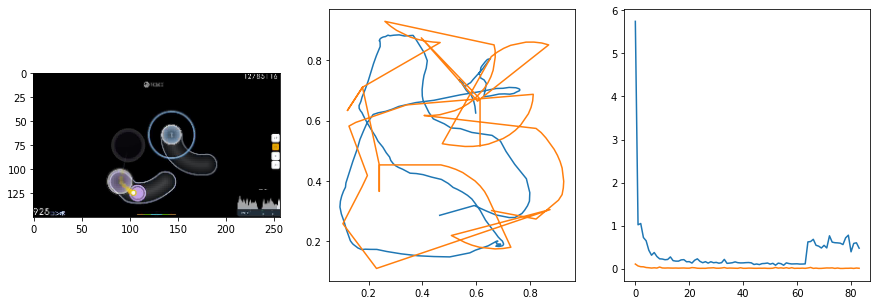

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.8106                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

84 of 128
pred: 0.2215179204940796 0.275226354598999
gt: 0.11545797437429428 0.5316810011863708
(65, 79)


<Figure size 1080x360 with 0 Axes>

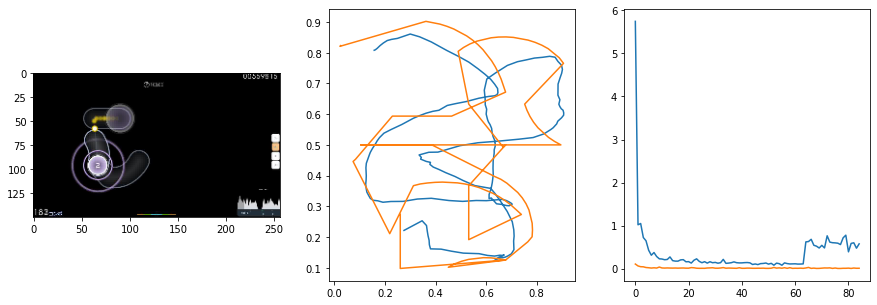

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.1855                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

85 of 128
pred: 0.5239574313163757 0.24560531973838806
gt: 0.7256985902786255 0.5
(160, 76)


<Figure size 1080x360 with 0 Axes>

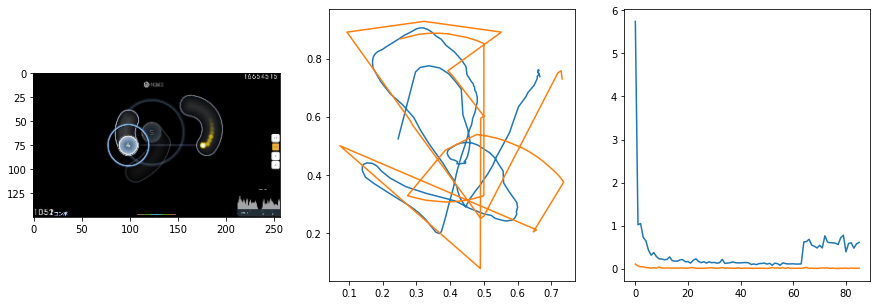

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.5228                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

86 of 128
pred: 0.21714632213115692 0.43119800090789795
gt: 0.502422571182251 0.20271539688110352
(125, 41)


<Figure size 1080x360 with 0 Axes>

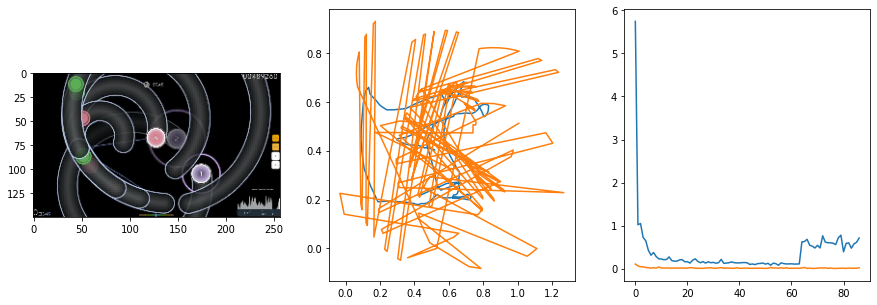

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.4706                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

87 of 128
pred: 0.27623802423477173 0.1803237348794937
gt: 0.37495461106300354 0.3285916745662689
(106, 56)


<Figure size 1080x360 with 0 Axes>

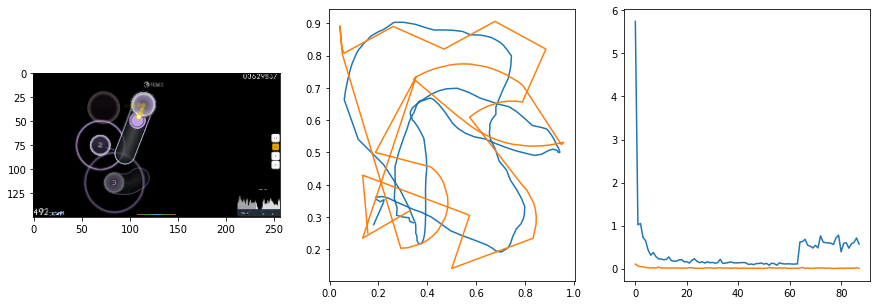

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.7509                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

88 of 128
pred: 0.22337834537029266 0.42445874214172363
gt: 0.138671875 0.8072916865348816
(69, 111)


<Figure size 1080x360 with 0 Axes>

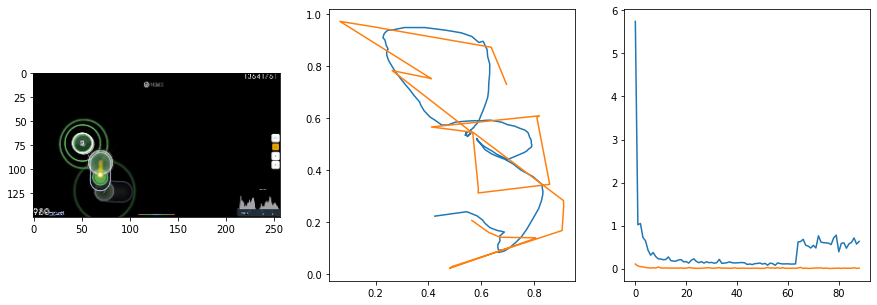

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.5795                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

89 of 128
pred: 0.41890811920166016 0.1629595011472702
gt: 0.7114369869232178 0.1316380649805069
(158, 33)


<Figure size 1080x360 with 0 Axes>

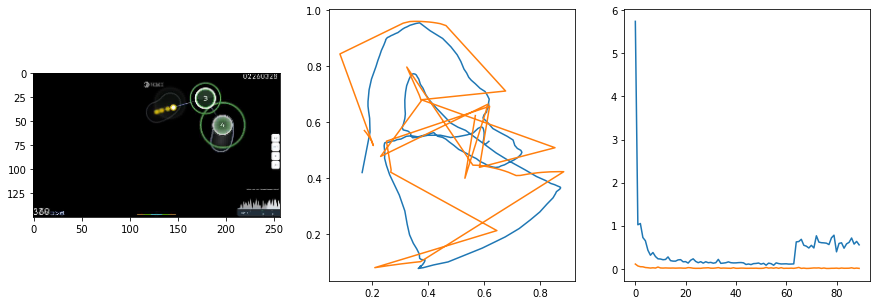

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.60it/s  0.3698                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

90 of 128
pred: 0.2270226925611496 0.30952930450439453
gt: 0.2147246152162552 0.5251656174659729
(81, 79)


<Figure size 1080x360 with 0 Axes>

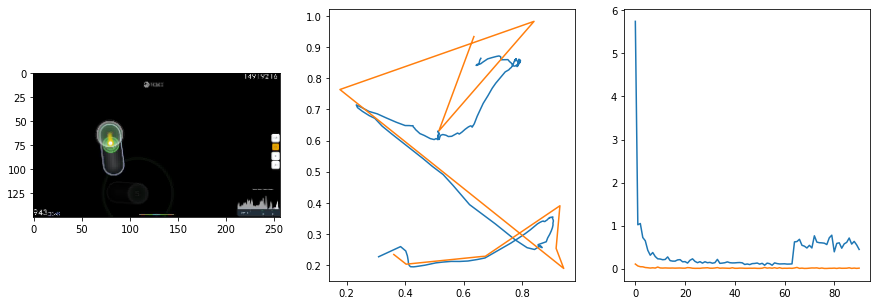

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.0352                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

91 of 128
pred: 0.3738853335380554 0.407692551612854
gt: 0.30754801630973816 0.3716987073421478
(95, 61)


<Figure size 1080x360 with 0 Axes>

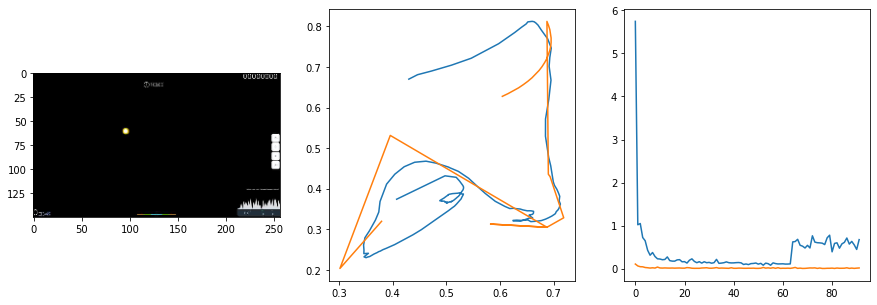

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  1.0626                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

92 of 128
pred: 0.6212772130966187 0.2903592884540558
gt: 0.9181259274482727 0.5
(190, 76)


<Figure size 1080x360 with 0 Axes>

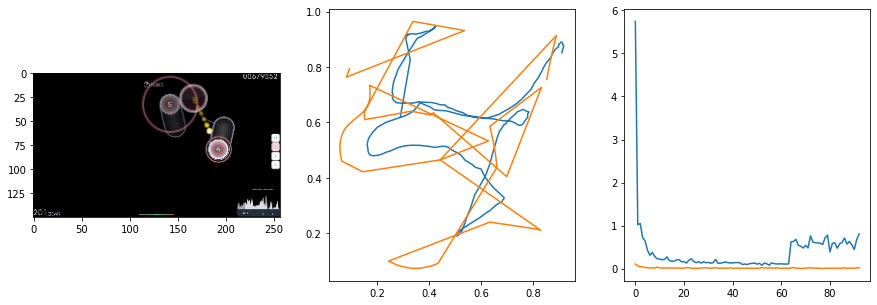

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.2098                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

93 of 128
pred: 0.6348080635070801 0.3661525249481201
gt: 0.8296521306037903 0.22195668518543243
(176, 43)


<Figure size 1080x360 with 0 Axes>

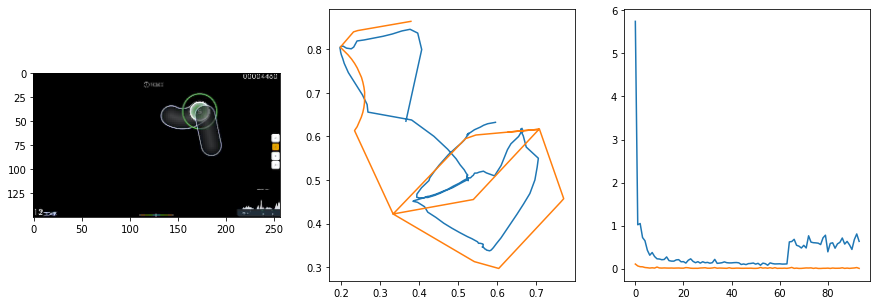

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.9102                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

94 of 128
pred: 0.34982454776763916 0.2906573414802551
gt: 0.5221255421638489 0.5864223837852478
(128, 86)


<Figure size 1080x360 with 0 Axes>

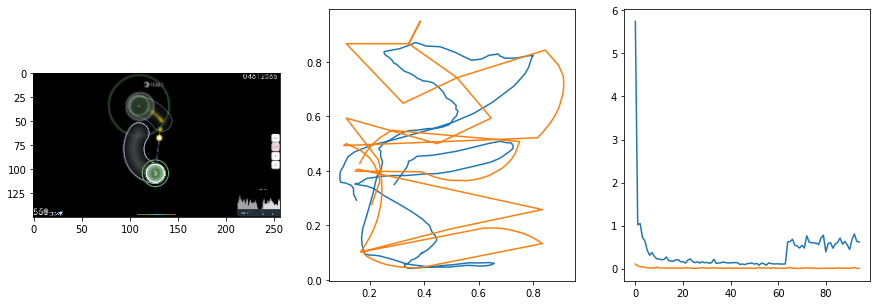

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.0180                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

95 of 128
pred: 0.4001888632774353 0.2940549850463867
gt: 0.5 0.6108333468437195
(125, 89)


<Figure size 1080x360 with 0 Axes>

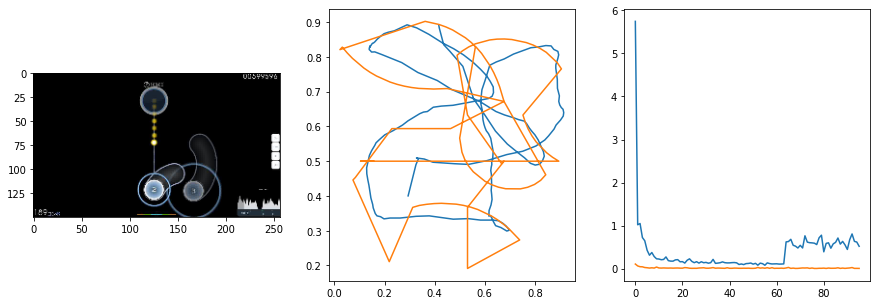

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.9732                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

96 of 128
pred: 0.3302176594734192 0.41136088967323303
gt: 0.42558810114860535 0.8279717564582825
(113, 114)


<Figure size 1080x360 with 0 Axes>

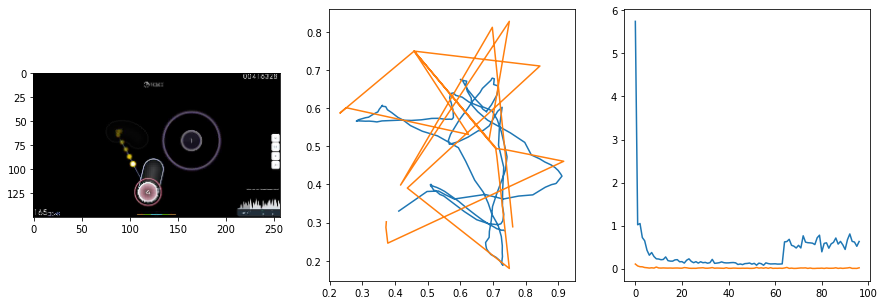

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  2.7799                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

97 of 128
pred: 0.3808024227619171 0.3868987262248993
gt: 0.4583207070827484 0.326272189617157
(119, 55)


<Figure size 1080x360 with 0 Axes>

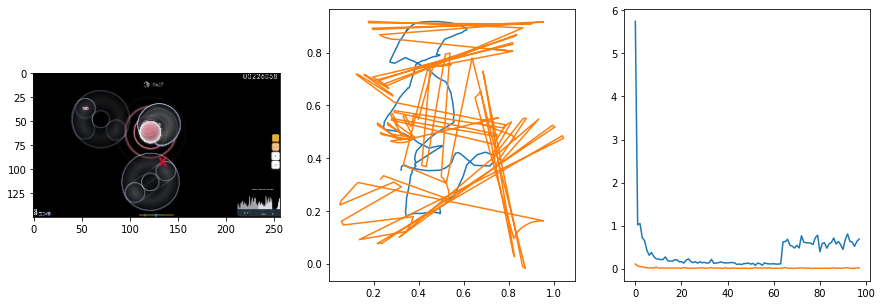

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.7568                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

98 of 128
pred: 0.3205820620059967 0.38837477564811707
gt: 0.5 0.4791666567325592
(125, 73)


<Figure size 1080x360 with 0 Axes>

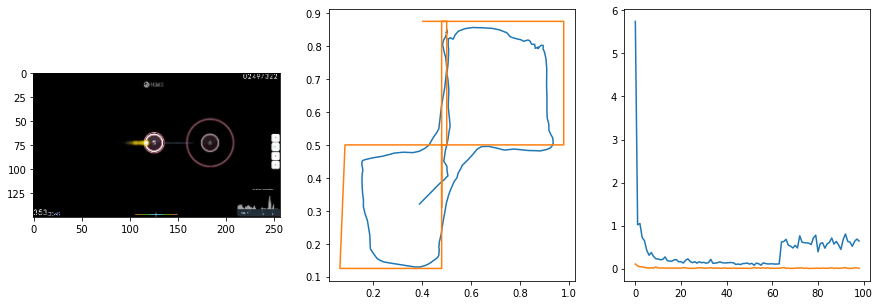

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  0.7038                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

99 of 128
pred: 0.512322187423706 0.6025153994560242
gt: 0.4252628684043884 0.6547732949256897
(113, 94)


<Figure size 1080x360 with 0 Axes>

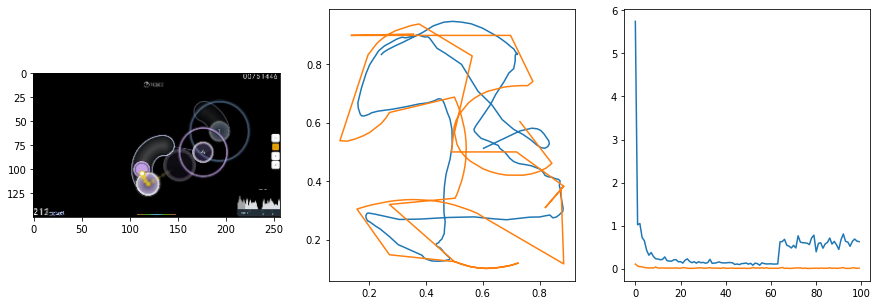

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.0140                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

100 of 128
pred: 0.6623930931091309 0.5040335059165955
gt: 0.982421875 0.9140625
(200, 124)


<Figure size 1080x360 with 0 Axes>

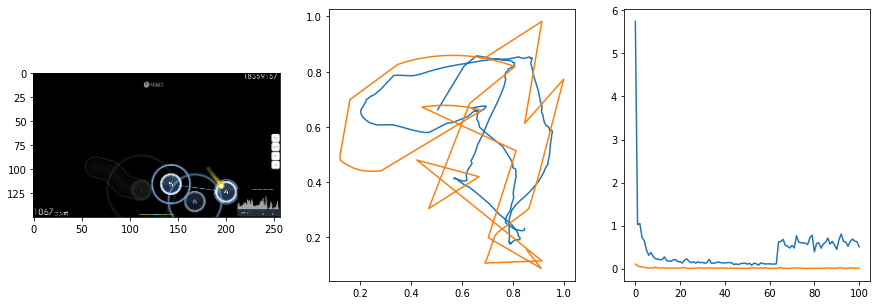

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.2723                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

101 of 128
pred: 0.2919469177722931 0.5983297228813171
gt: 0.1401119828224182 0.7216578125953674
(69, 101)


<Figure size 1080x360 with 0 Axes>

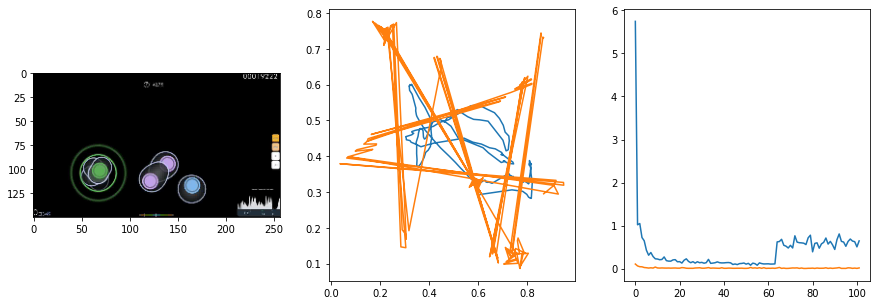

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.4107                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

102 of 128
pred: 0.19333839416503906 0.4738887548446655
gt: 0.298828125 0.9869791865348816
(94, 132)


<Figure size 1080x360 with 0 Axes>

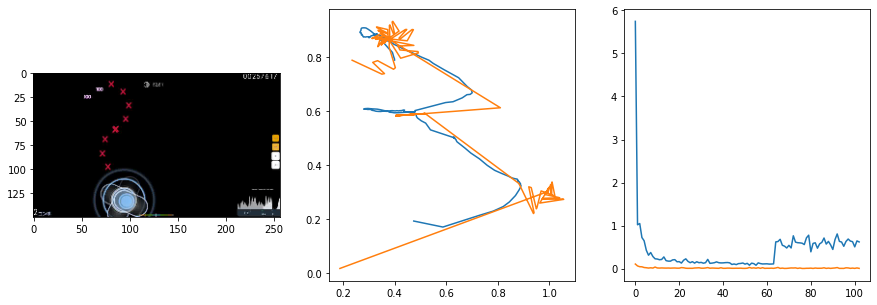

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.2869                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

103 of 128
pred: 0.4932886064052582 0.5964853167533875
gt: 0.7047991156578064 0.7023809552192688
(157, 99)


<Figure size 1080x360 with 0 Axes>

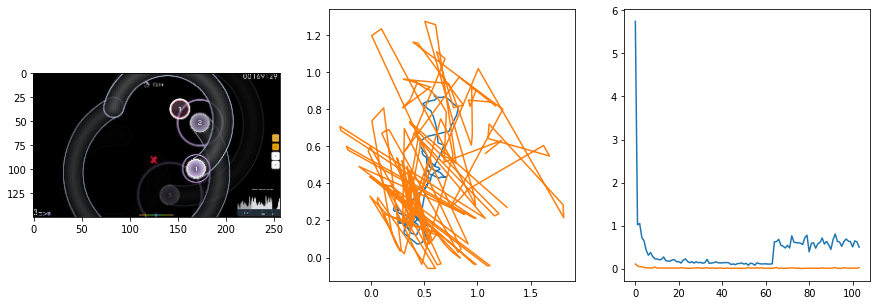

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.7229                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

104 of 128
pred: 0.6622026562690735 0.2895553708076477
gt: 0.939453125 0.2421875
(193, 46)


<Figure size 1080x360 with 0 Axes>

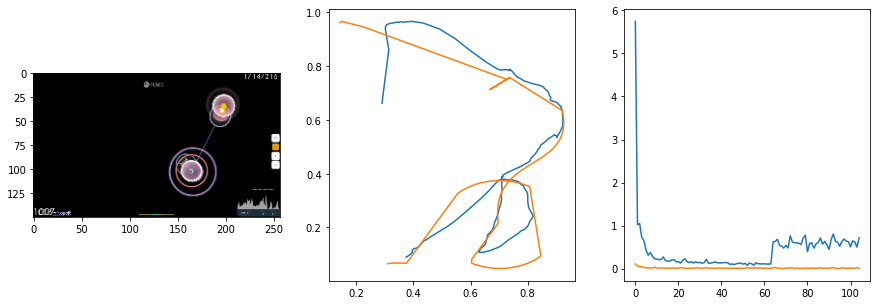

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  0.1490                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

105 of 128
pred: 0.47075507044792175 0.5587854385375977
gt: 0.599609375 0.7786458134651184
(140, 108)


<Figure size 1080x360 with 0 Axes>

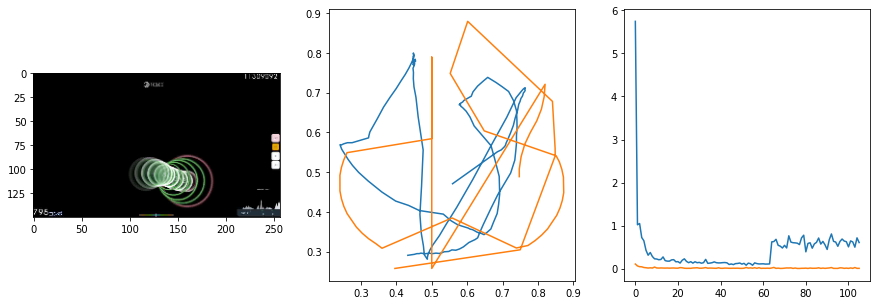

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.4866                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

106 of 128
pred: 0.5529398322105408 0.5143824815750122
gt: 0.7328559160232544 0.5475851893424988
(161, 81)


<Figure size 1080x360 with 0 Axes>

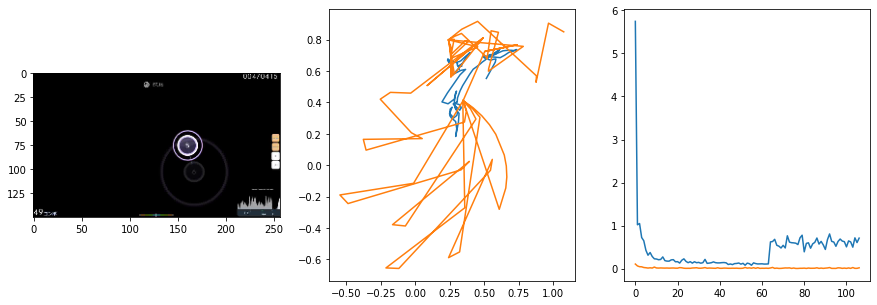

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.3629                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

107 of 128
pred: 0.3505209982395172 0.6531831622123718
gt: 0.2157847136259079 0.7952584624290466
(81, 110)


<Figure size 1080x360 with 0 Axes>

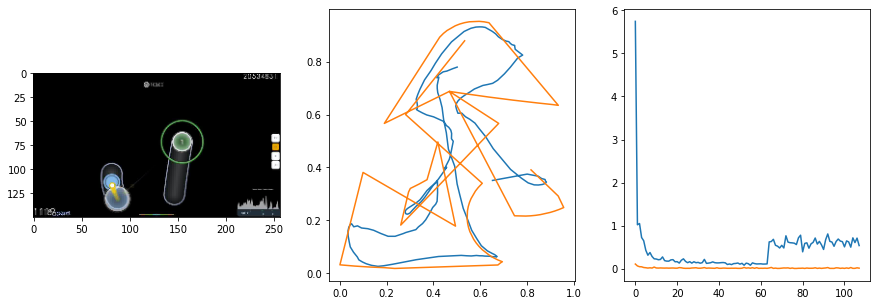

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  0.4981                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

108 of 128
pred: 0.21914835274219513 0.2811495065689087
gt: 0.19454720616340637 0.26906177401542664
(78, 49)


<Figure size 1080x360 with 0 Axes>

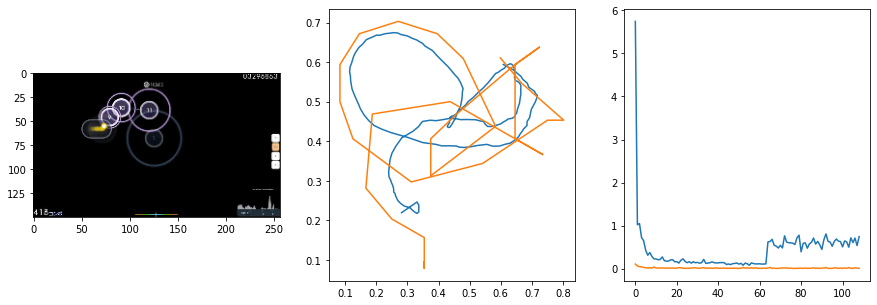

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.9517                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

109 of 128
pred: 0.6179462671279907 0.40005916357040405
gt: 0.751079797744751 0.24788278341293335
(164, 46)


<Figure size 1080x360 with 0 Axes>

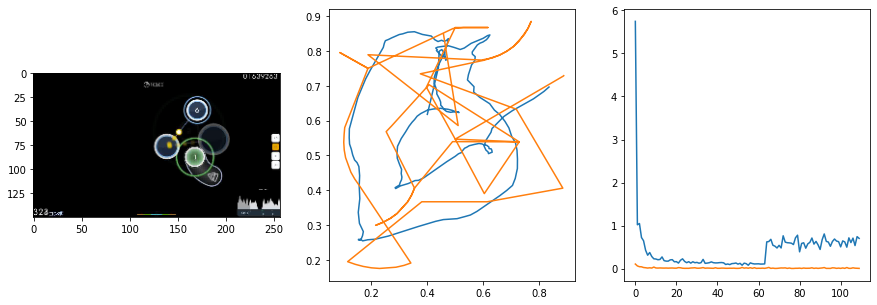

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.5564                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

110 of 128
pred: 0.3435136079788208 0.2109852284193039
gt: 0.5760001540184021 0.5100828409194946
(137, 77)


<Figure size 1080x360 with 0 Axes>

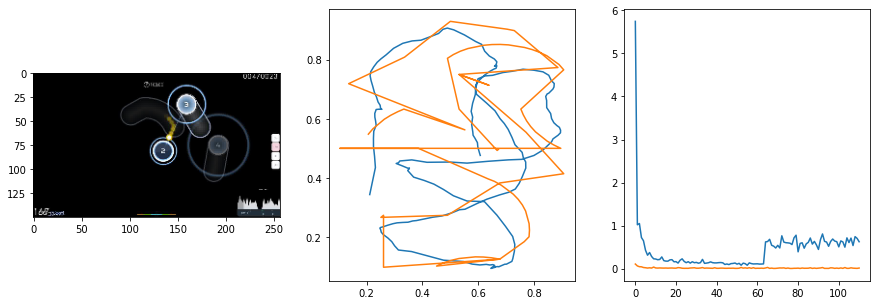

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.7843                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

111 of 128
pred: 0.2959330677986145 0.4345739185810089
gt: 0.24396008253097534 0.2648226022720337
(85, 48)


<Figure size 1080x360 with 0 Axes>

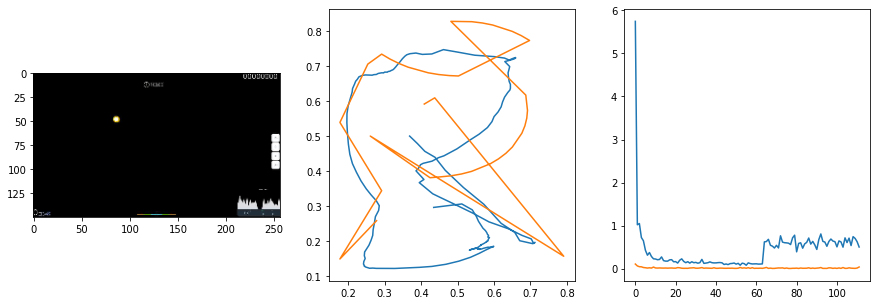

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.3772                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

112 of 128
pred: 0.3895333707332611 0.5152226090431213
gt: 0.4144604504108429 0.75
(112, 105)


<Figure size 1080x360 with 0 Axes>

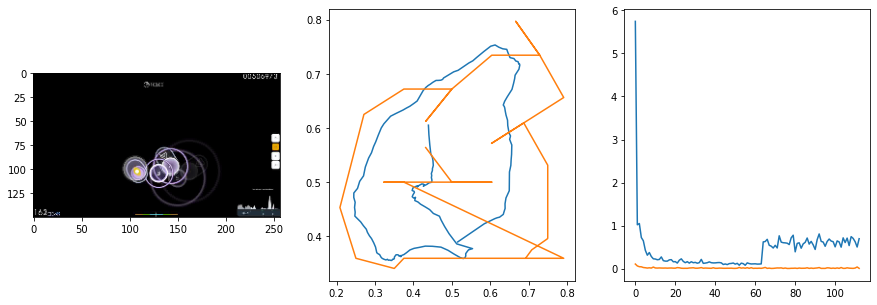

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.3179                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

113 of 128
pred: 0.48810842633247375 0.47068020701408386
gt: 0.578125 0.5949371457099915
(137, 87)


<Figure size 1080x360 with 0 Axes>

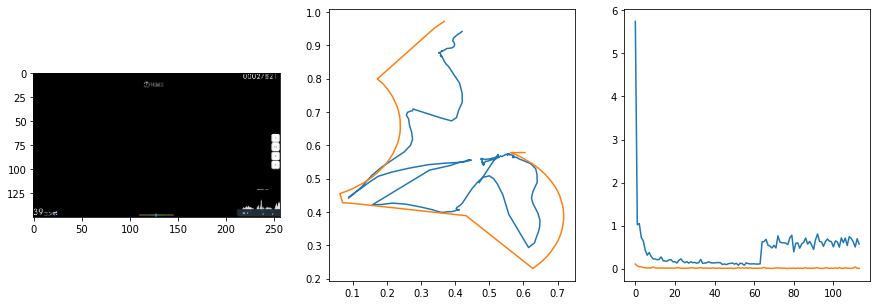

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.3897                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

114 of 128
pred: 0.5365187525749207 0.29708975553512573
gt: 0.8499950766563416 0.22785250842571259
(179, 44)


<Figure size 1080x360 with 0 Axes>

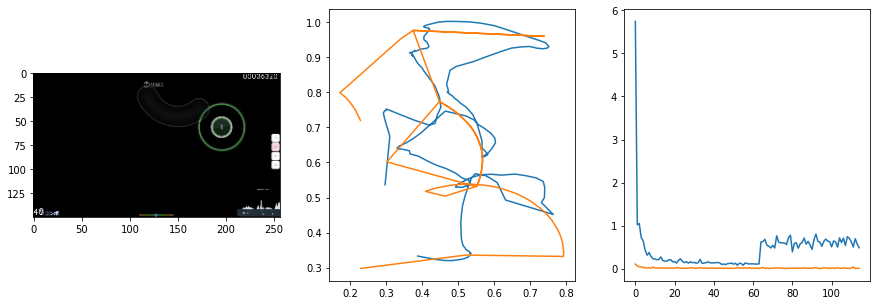

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  0.0098                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

115 of 128
pred: 0.360834002494812 0.535397469997406
gt: 0.4509431719779968 0.9839175343513489
(117, 132)


<Figure size 1080x360 with 0 Axes>

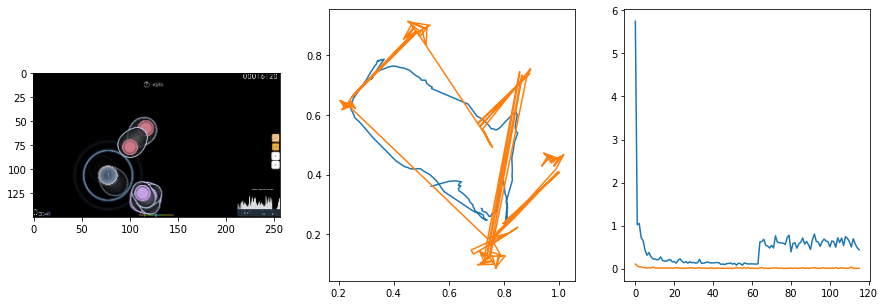

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  1.2388                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

116 of 128
pred: 0.5965901613235474 0.31200024485588074
gt: 0.8688317537307739 0.47108960151672363
(182, 72)


<Figure size 1080x360 with 0 Axes>

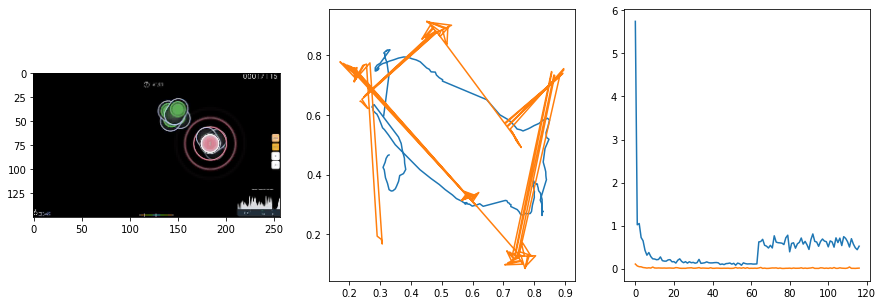

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.64it/s  0.7818                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

117 of 128
pred: 0.36634862422943115 0.5589697957038879
gt: 0.25806716084480286 0.5606070160865784
(88, 83)


<Figure size 1080x360 with 0 Axes>

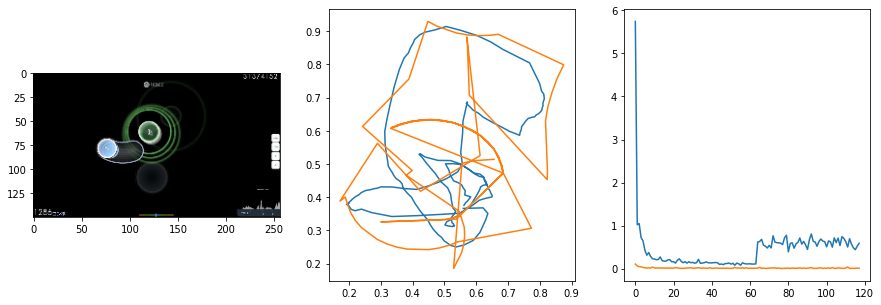

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.9009                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

118 of 128
pred: 0.3981725573539734 0.2772698998451233
gt: 0.46875 0.3733333349227905
(120, 61)


<Figure size 1080x360 with 0 Axes>

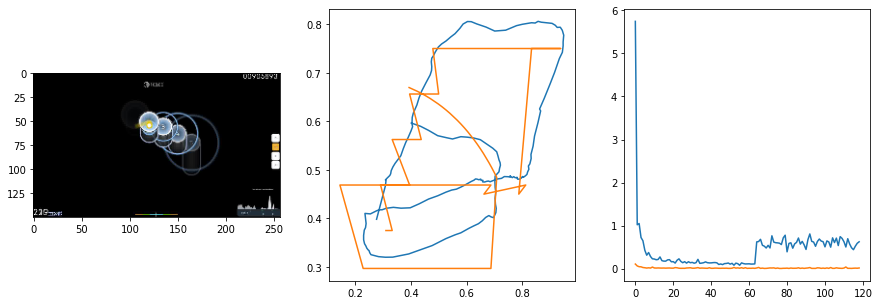

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.4753                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

119 of 128
pred: 0.5460517406463623 0.24878892302513123
gt: 0.590680718421936 0.32223597168922424
(139, 55)


<Figure size 1080x360 with 0 Axes>

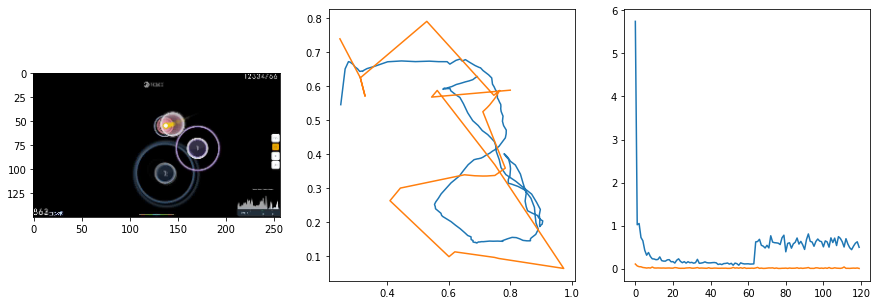

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.63it/s  0.5210                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

120 of 128
pred: 0.5734747648239136 0.34927472472190857
gt: 0.6931600570678711 0.3914753496646881
(155, 63)


<Figure size 1080x360 with 0 Axes>

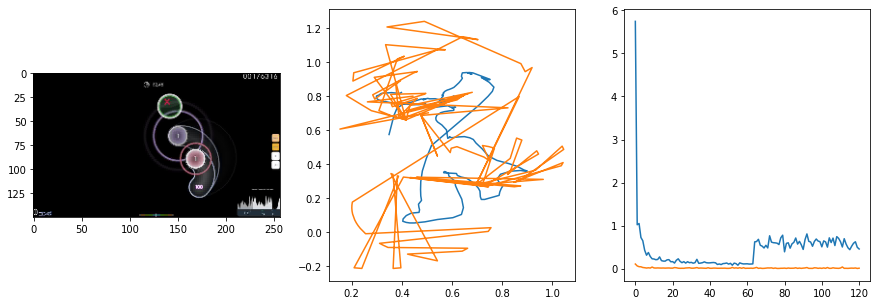

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  0.5513                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

121 of 128
pred: 0.4792438745498657 0.6421163082122803
gt: 0.5 0.929661750793457
(125, 126)


<Figure size 1080x360 with 0 Axes>

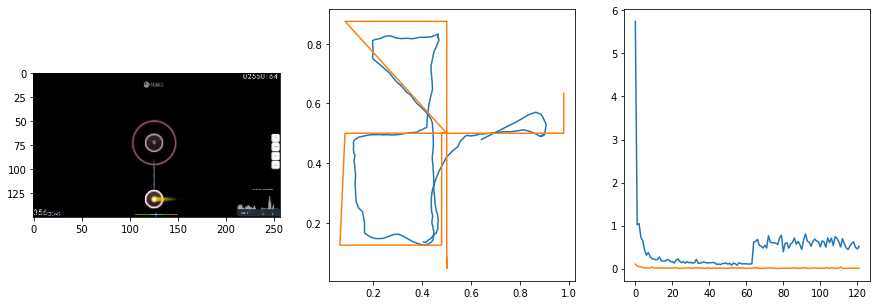

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.61it/s  0.0257                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

122 of 128
pred: 0.7165770530700684 0.40561431646347046
gt: 0.7111638784408569 0.4896068274974823
(158, 74)


<Figure size 1080x360 with 0 Axes>

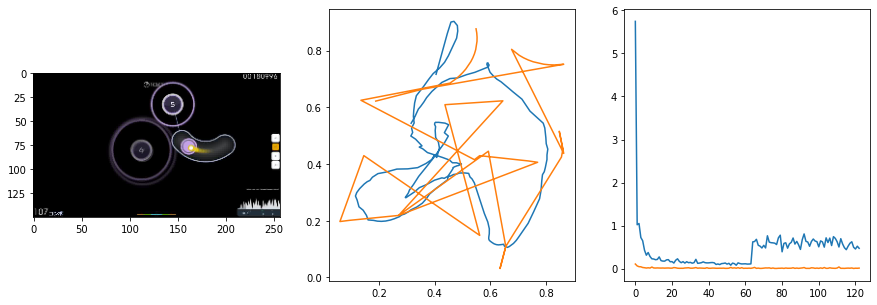

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.65it/s  0.8052                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

123 of 128
pred: 0.32329726219177246 0.6651758551597595
gt: 0.4147476851940155 0.8858146667480469
(112, 121)


<Figure size 1080x360 with 0 Axes>

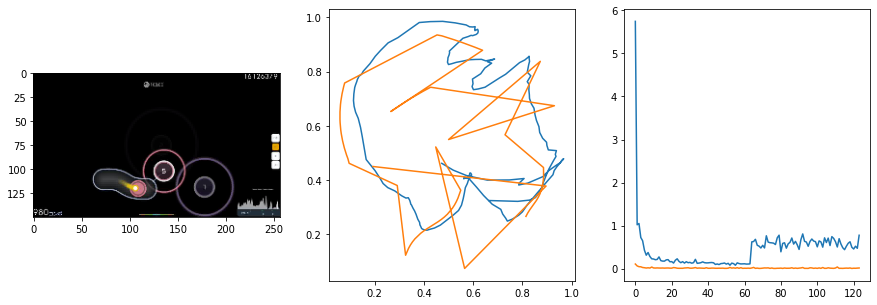

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.66it/s  0.9326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

124 of 128
pred: 0.5403256416320801 0.500632107257843
gt: 0.8373744487762451 0.4627687633037567
(177, 71)


<Figure size 1080x360 with 0 Axes>

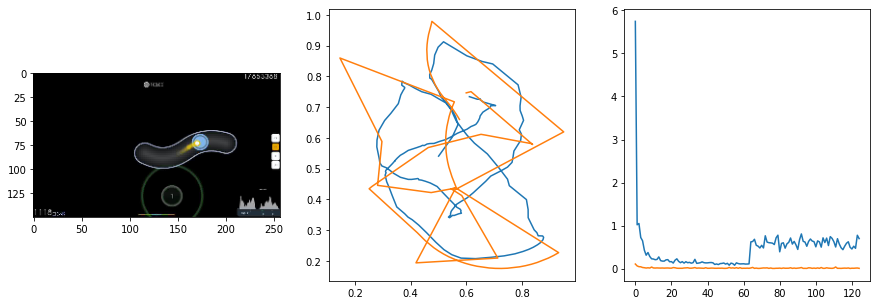

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:08<00:00:00  1.57it/s  0.1493                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

125 of 128
pred: 0.4064009189605713 0.199544757604599
gt: 0.6266741156578064 0.3769841194152832
(145, 61)


<Figure size 1080x360 with 0 Axes>

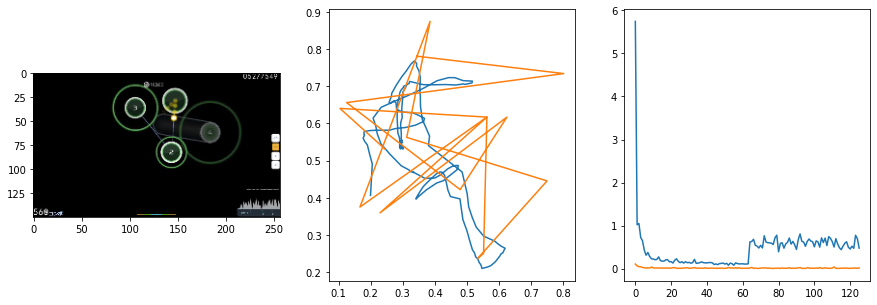

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.68it/s  0.6468                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

126 of 128
pred: 0.2925472855567932 0.5718593597412109
gt: 0.1875 0.8958333134651184
(77, 122)


<Figure size 1080x360 with 0 Axes>

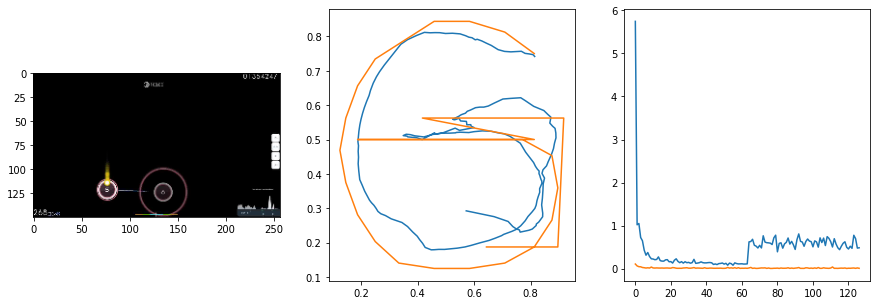

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.67it/s  1.0199                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

127 of 128
pred: 0.42784780263900757 0.25672948360443115
gt: 0.37109375 0.4947916567325592
(105, 75)


<Figure size 1080x360 with 0 Axes>

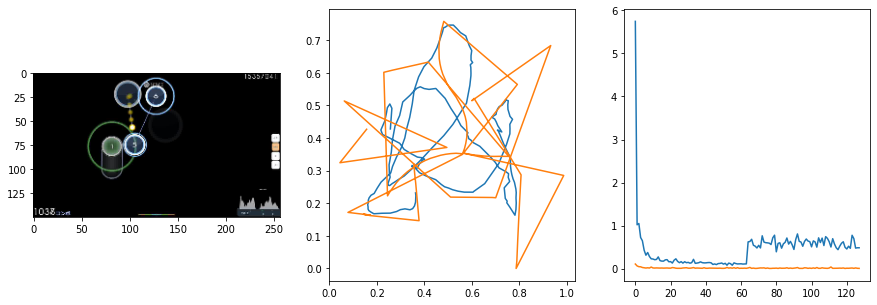

660.4381384849548 secs


In [19]:
start = time.time()

lamb = 3
epochs = 64
trainVN()

end = time.time()
print(end - start, 'secs')

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0116                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 64
pred: 0.7858656644821167 0.5746828317642212
gt: 0.875 0.23866666853427887
(183, 45)


<Figure size 1080x360 with 0 Axes>

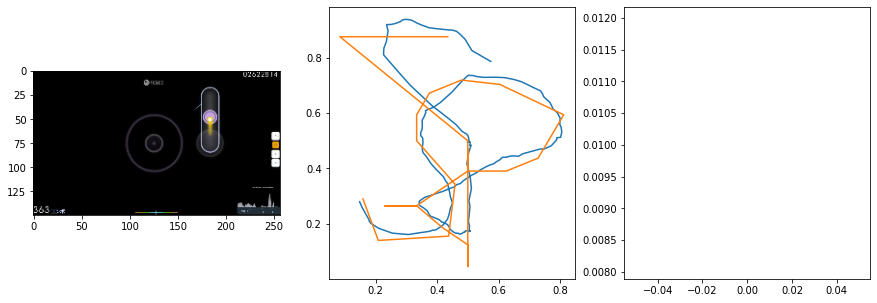

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.71it/s  0.0130                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 64
pred: 0.418514609336853 0.3419286012649536
gt: 0.515625 0.32600000500679016
(127, 55)


<Figure size 1080x360 with 0 Axes>

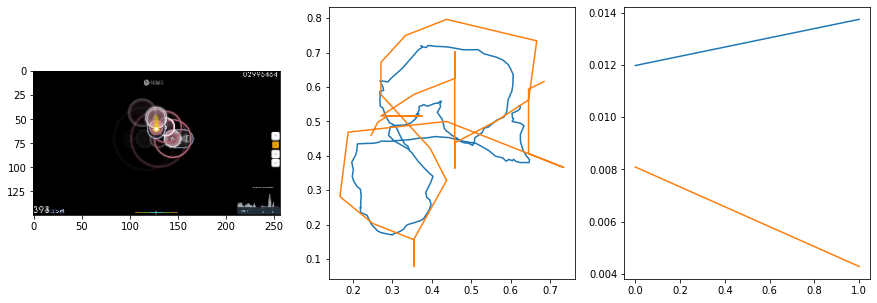

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0161                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 64
pred: 0.6792581081390381 0.6397849917411804
gt: 0.5053117871284485 0.576932430267334
(126, 85)


<Figure size 1080x360 with 0 Axes>

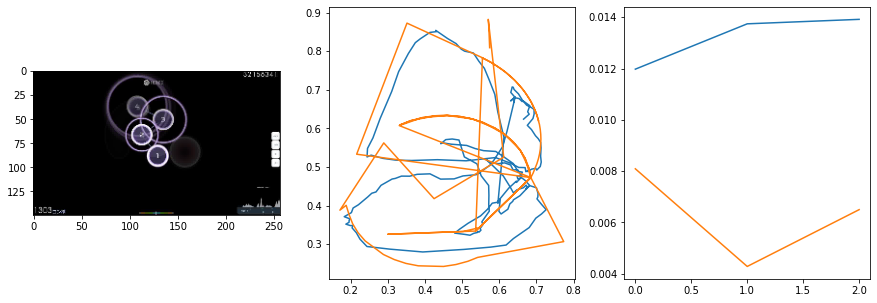

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0097                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 64
pred: 0.25537171959877014 0.4659011960029602
gt: 0.33282068371772766 0.7133352756500244
(99, 100)


<Figure size 1080x360 with 0 Axes>

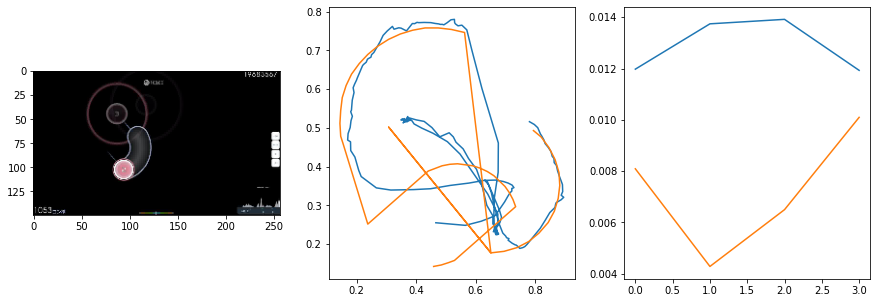

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.76it/s  0.0049                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 64
pred: 0.45496368408203125 0.45685914158821106
gt: 0.66015625 0.4609375
(150, 71)


<Figure size 1080x360 with 0 Axes>

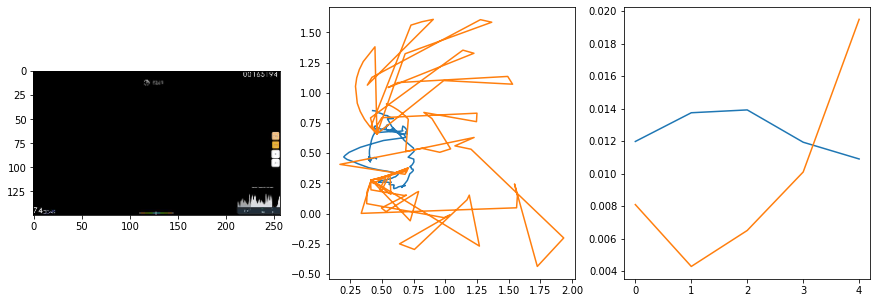

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.0139                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 64
pred: 0.6553051471710205 0.7395967245101929
gt: 0.5528242588043213 0.6107361912727356
(133, 89)


<Figure size 1080x360 with 0 Axes>

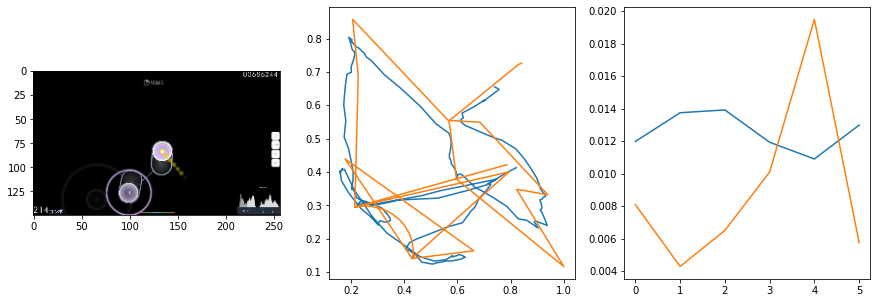

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.80it/s  0.0041                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 64
pred: 0.4409373104572296 0.44009333848953247
gt: 0.7005208134651184 0.7291666865348816
(156, 102)


<Figure size 1080x360 with 0 Axes>

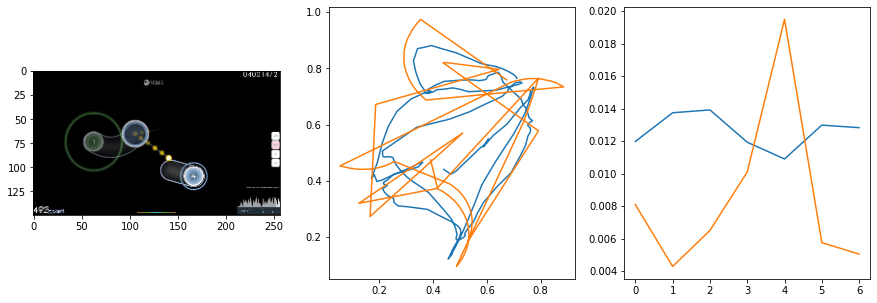

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.78it/s  0.0040                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 64
pred: 0.6524638533592224 0.5628281831741333
gt: 0.5150168538093567 0.8340818285942078
(127, 115)


<Figure size 1080x360 with 0 Axes>

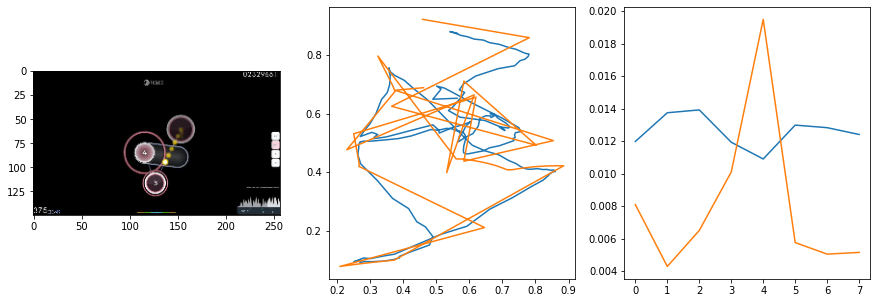

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.76it/s  0.0100                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 64
pred: 0.6936568021774292 0.29471147060394287
gt: 0.8076030611991882 0.4280634820461273
(173, 67)


<Figure size 1080x360 with 0 Axes>

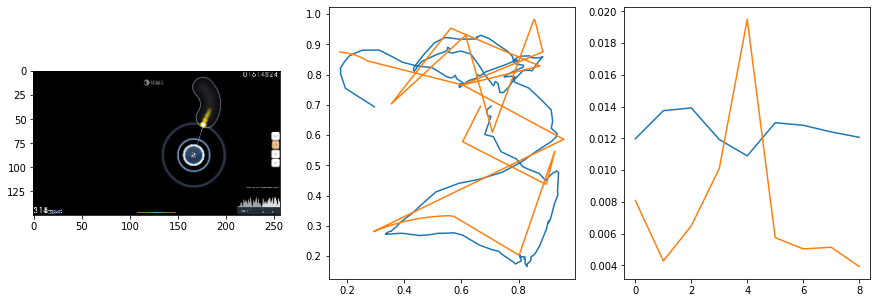

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0107                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 64
pred: 0.6179993152618408 0.5101401805877686
gt: 0.6096088886260986 0.303143709897995
(142, 53)


<Figure size 1080x360 with 0 Axes>

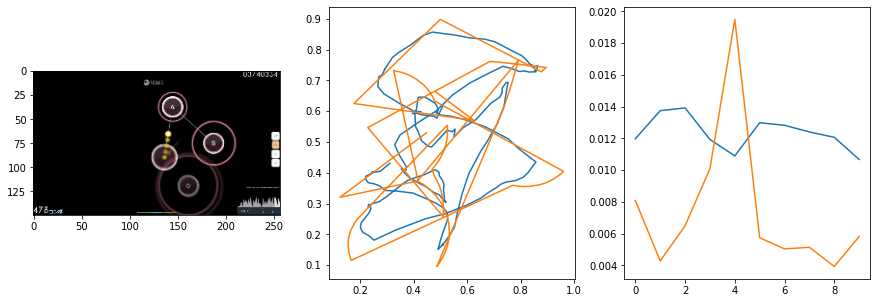

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  0.0232                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 64
pred: 0.5101990103721619 0.2972411513328552
gt: 0.793628454208374 0.20967429876327515
(171, 42)


<Figure size 1080x360 with 0 Axes>

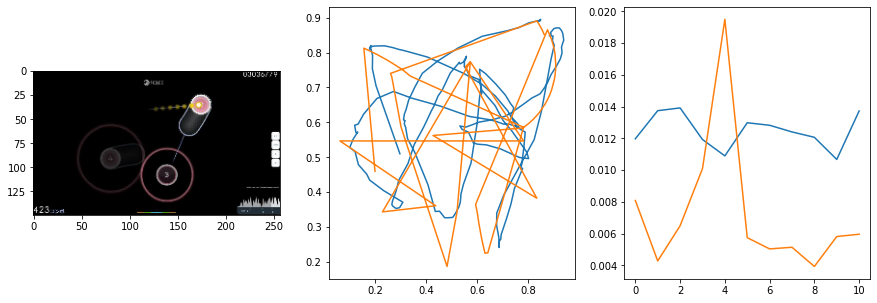

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.0101                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 64
pred: 0.25520825386047363 0.25382256507873535
gt: 0.14778228104114532 0.2896956503391266
(70, 51)


<Figure size 1080x360 with 0 Axes>

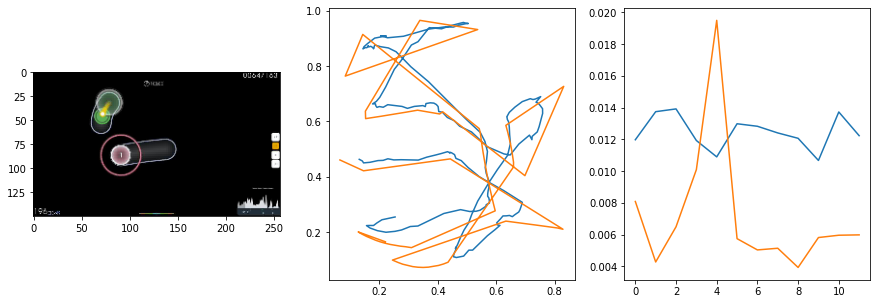

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0107                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 64
pred: 0.7264918684959412 0.5825929641723633
gt: 0.6219785213470459 0.4948361814022064
(144, 75)


<Figure size 1080x360 with 0 Axes>

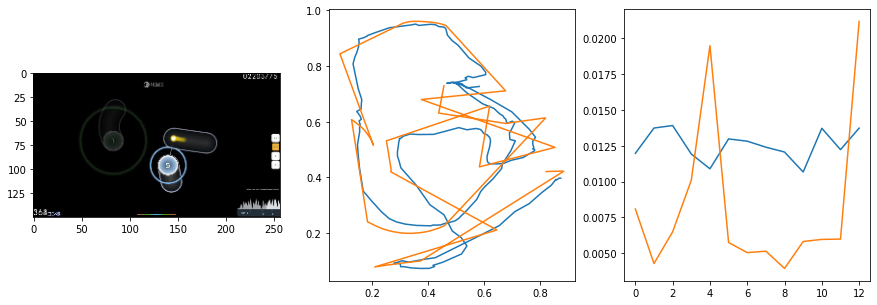

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0185                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 64
pred: 0.44640499353408813 0.5090669989585876
gt: 0.8068886399269104 0.6276074051856995
(173, 90)


<Figure size 1080x360 with 0 Axes>

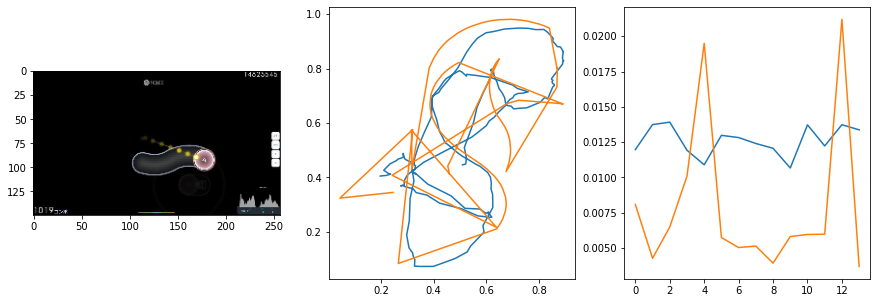

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0082                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 64
pred: 0.29341819882392883 0.6147027611732483
gt: 0.21227961778640747 0.46913233399391174
(80, 72)


<Figure size 1080x360 with 0 Axes>

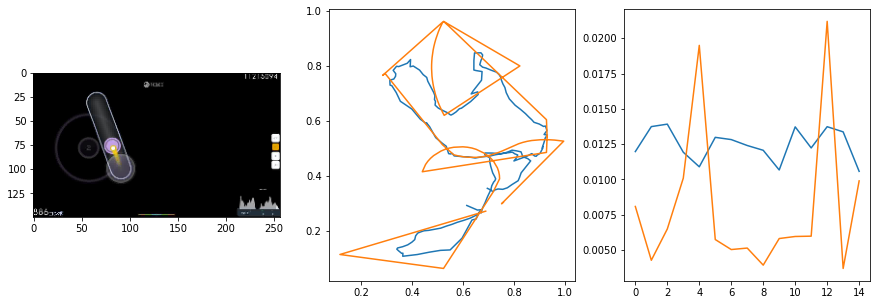

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.80it/s  0.0201                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 64
pred: 0.7008026242256165 0.4300870895385742
gt: 0.760732889175415 0.3631947338581085
(165, 60)


<Figure size 1080x360 with 0 Axes>

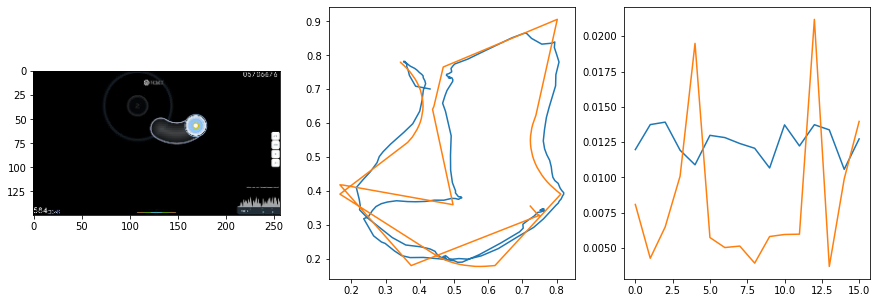

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0061                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 64
pred: 0.4534875750541687 0.5654898881912231
gt: 0.42753350734710693 0.4516890048980713
(114, 70)


<Figure size 1080x360 with 0 Axes>

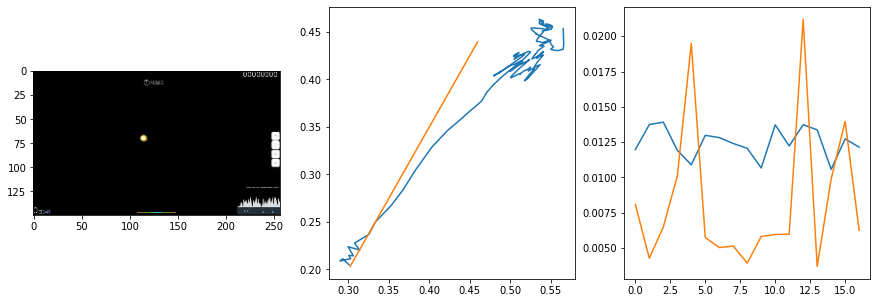

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0107                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 64
pred: 0.39696669578552246 0.4142304062843323
gt: 0.5340051054954529 0.5595927834510803
(130, 83)


<Figure size 1080x360 with 0 Axes>

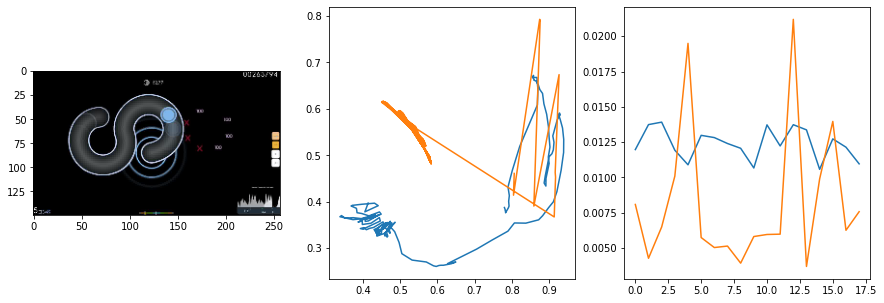

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0159                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 64
pred: 0.7091608643531799 0.662878692150116
gt: 0.6965082883834839 0.7909226417541504
(156, 109)


<Figure size 1080x360 with 0 Axes>

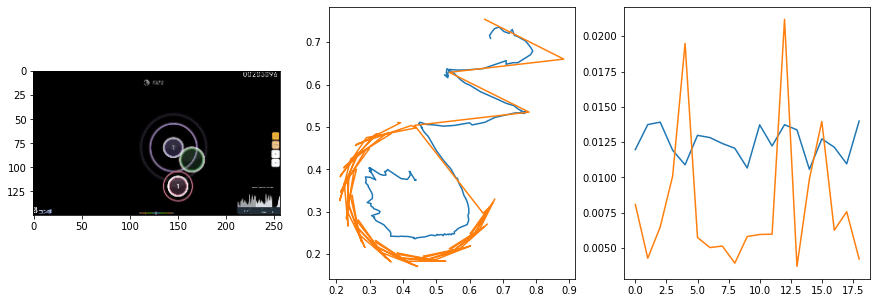

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0072                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 64
pred: 0.41419467329978943 0.7775933742523193
gt: 0.30181244015693665 0.7574915289878845
(94, 106)


<Figure size 1080x360 with 0 Axes>

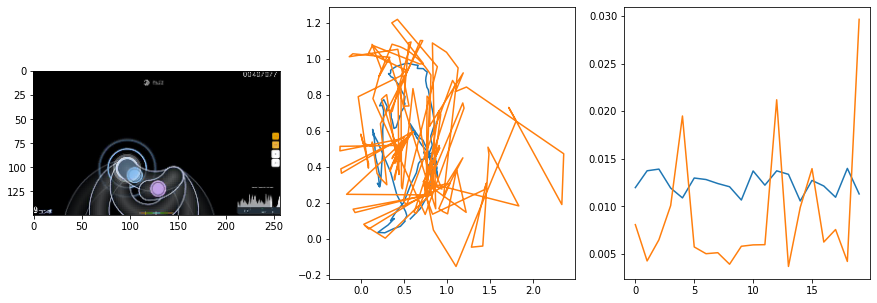

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0162                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 64
pred: 0.6150287985801697 0.5106251239776611
gt: 0.841463029384613 0.5018696188926697
(178, 76)


<Figure size 1080x360 with 0 Axes>

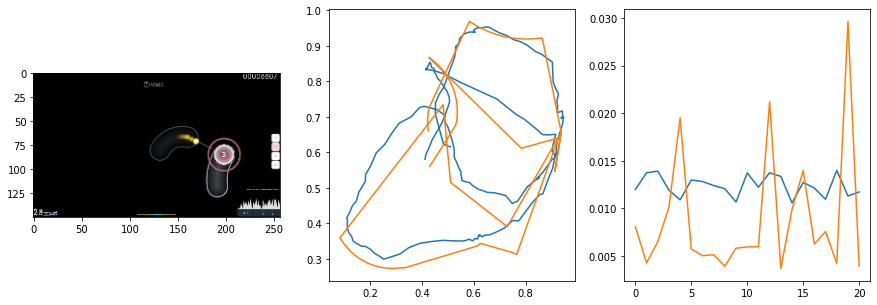

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0222                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 64
pred: 0.5382916331291199 0.4597327709197998
gt: 1.0519939661026 1.0066391229629517
(211, 135)


<Figure size 1080x360 with 0 Axes>

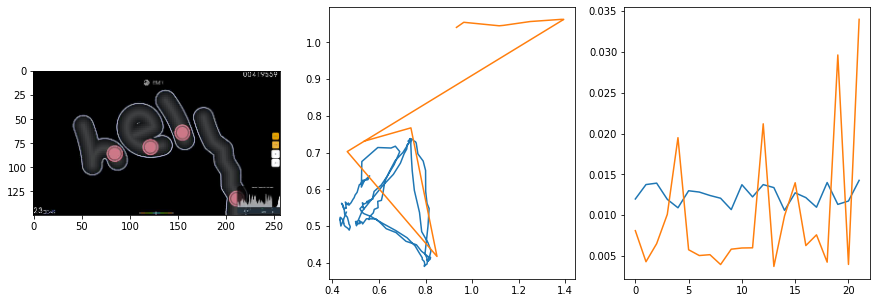

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0373                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 64
pred: 0.6029874086380005 0.6867774724960327
gt: 0.8569155335426331 0.7509644627571106
(180, 105)


<Figure size 1080x360 with 0 Axes>

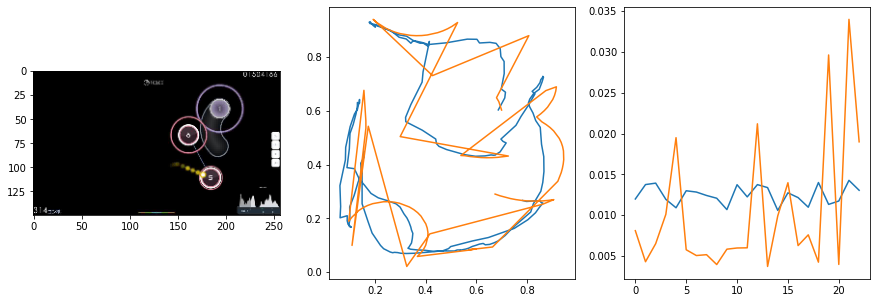

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0191                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 64
pred: 0.6937936544418335 0.4768754839897156
gt: 0.7752190232276917 0.6044138669967651
(168, 88)


<Figure size 1080x360 with 0 Axes>

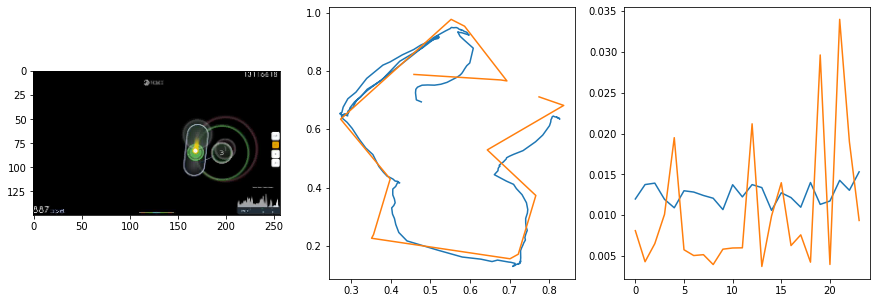

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.78it/s  0.0058                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 64
pred: 0.2891293168067932 0.6067258715629578
gt: 0.5360804200172424 0.7553420066833496
(131, 105)


<Figure size 1080x360 with 0 Axes>

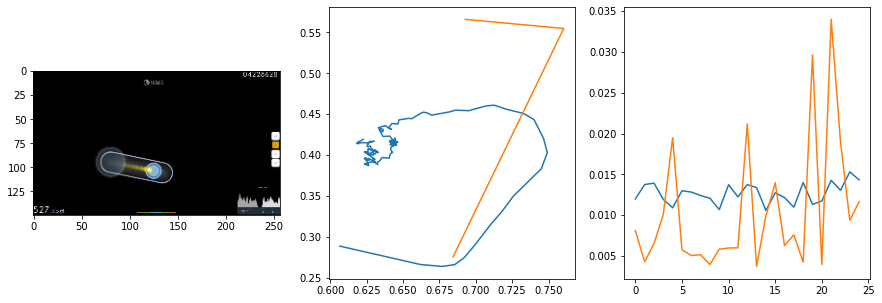

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.77it/s  0.0050                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 64
pred: 0.22299546003341675 0.6623783707618713
gt: 0.2300889790058136 0.5109230279922485
(83, 77)


<Figure size 1080x360 with 0 Axes>

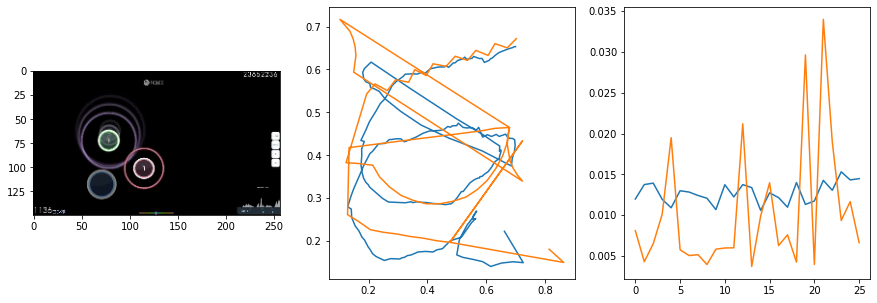

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0054                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 64
pred: 0.3719758093357086 0.27435290813446045
gt: 0.46484375 0.4427083432674408
(120, 69)


<Figure size 1080x360 with 0 Axes>

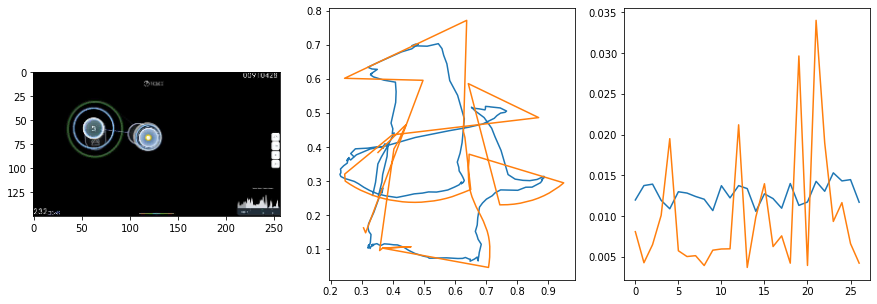

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.0131                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 64
pred: 0.21833834052085876 0.34907931089401245
gt: 0.17539860308170319 0.3116142153739929
(75, 54)


<Figure size 1080x360 with 0 Axes>

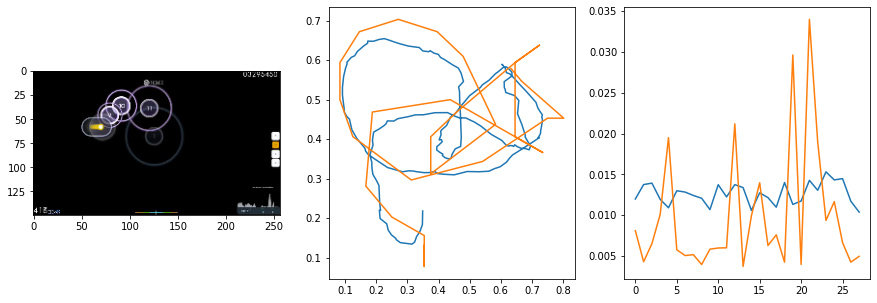

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.80it/s  0.0131                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 64
pred: 0.6494077444076538 0.6913268566131592
gt: 0.692187488079071 0.625
(155, 90)


<Figure size 1080x360 with 0 Axes>

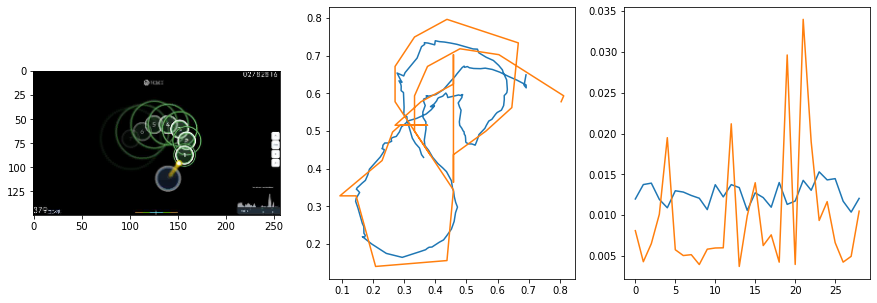

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.79it/s  0.0447                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 64
pred: 0.45706963539123535 0.26830005645751953
gt: 0.42331966757774353 0.3365860879421234
(113, 57)


<Figure size 1080x360 with 0 Axes>

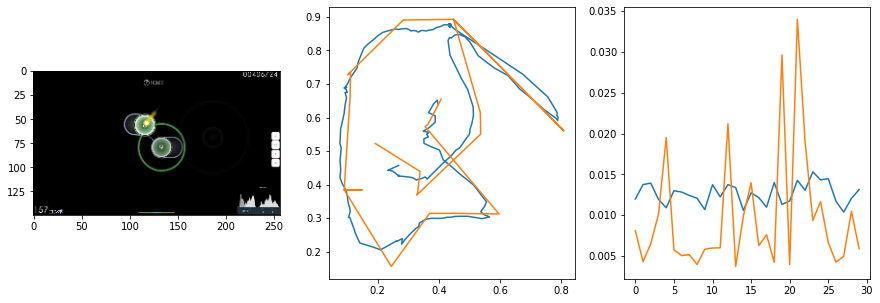

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0088                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 64
pred: 0.8422309160232544 0.5133215188980103
gt: 0.8548309803009033 0.5914646983146667
(180, 86)


<Figure size 1080x360 with 0 Axes>

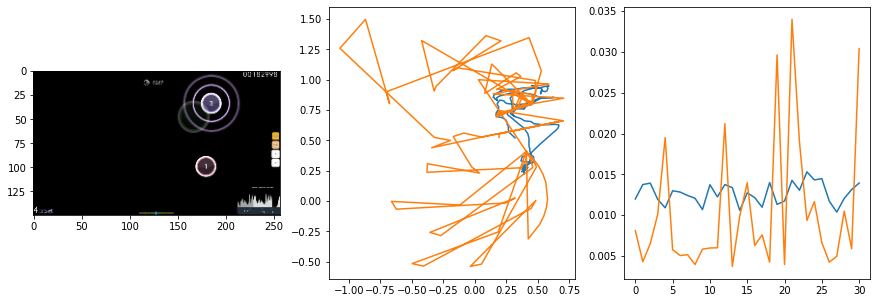

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.81it/s  0.0093                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 64
pred: 0.5420480370521545 0.2017243206501007
gt: 0.515625 0.203125
(127, 41)


<Figure size 1080x360 with 0 Axes>

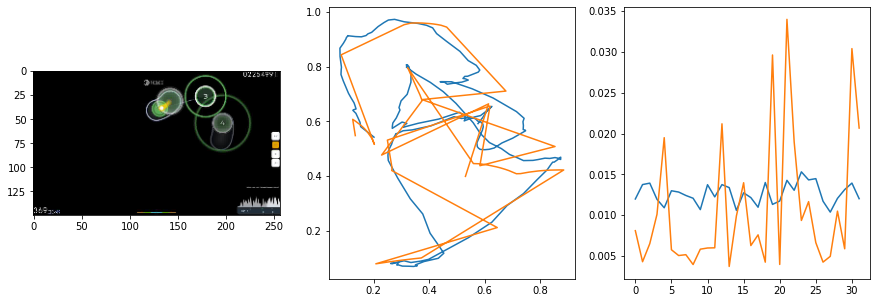

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.0109                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 64
pred: 0.5704692006111145 0.6474412679672241
gt: 0.5625 0.4711221158504486
(135, 72)


<Figure size 1080x360 with 0 Axes>

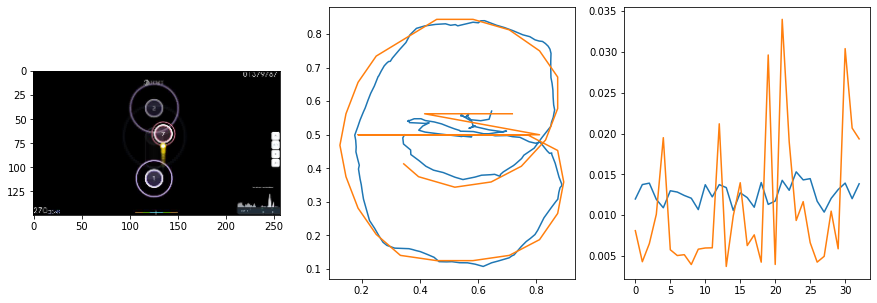

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0055                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 64
pred: 0.5952980518341064 0.6755094528198242
gt: 0.4565354585647583 0.7031917572021484
(118, 99)


<Figure size 1080x360 with 0 Axes>

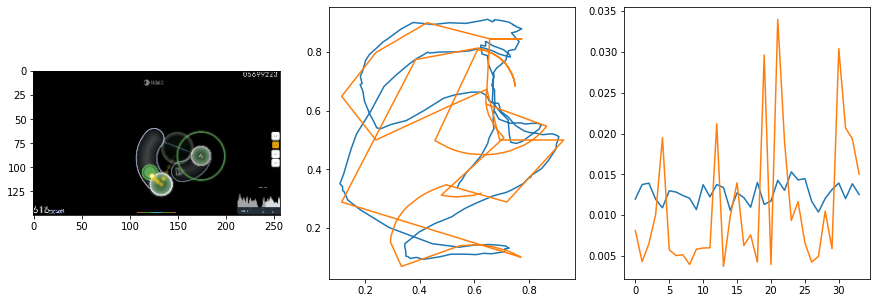

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0111                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 64
pred: 0.4372290074825287 0.5184914469718933
gt: 0.4016069173812866 0.6684431433677673
(110, 95)


<Figure size 1080x360 with 0 Axes>

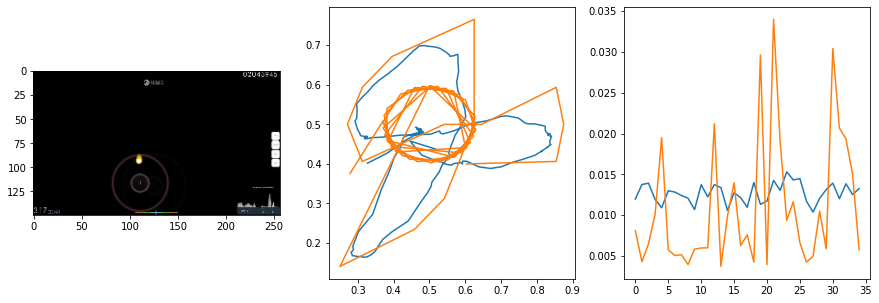

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0296                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 64
pred: 0.4948985278606415 0.786787748336792
gt: 0.58203125 0.765625
(138, 107)


<Figure size 1080x360 with 0 Axes>

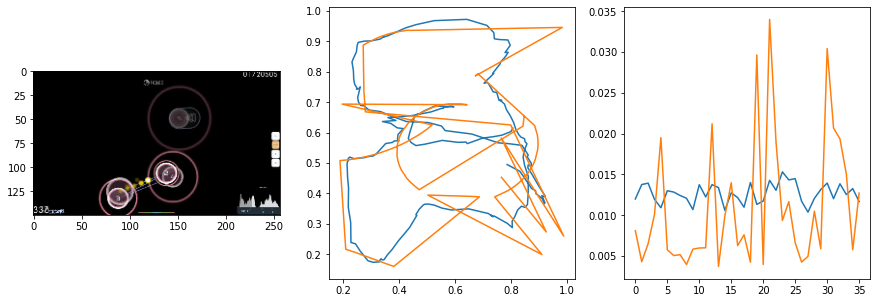

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.71it/s  0.0122                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 64
pred: 0.4804583787918091 0.46901795268058777
gt: 0.5609742403030396 0.7223150730133057
(134, 102)


<Figure size 1080x360 with 0 Axes>

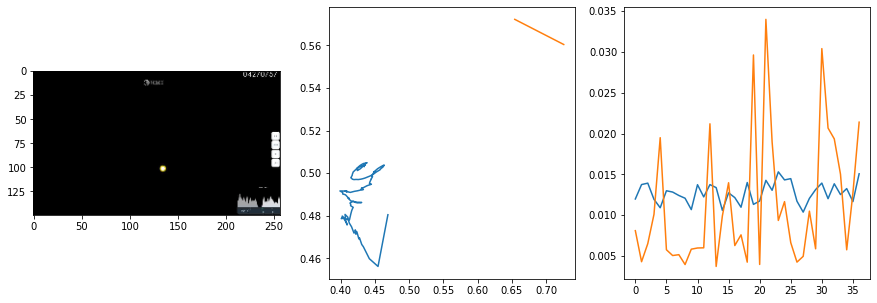

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0114                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 64
pred: 0.32051315903663635 0.6500382423400879
gt: 0.27236127853393555 0.6781993508338928
(90, 96)


<Figure size 1080x360 with 0 Axes>

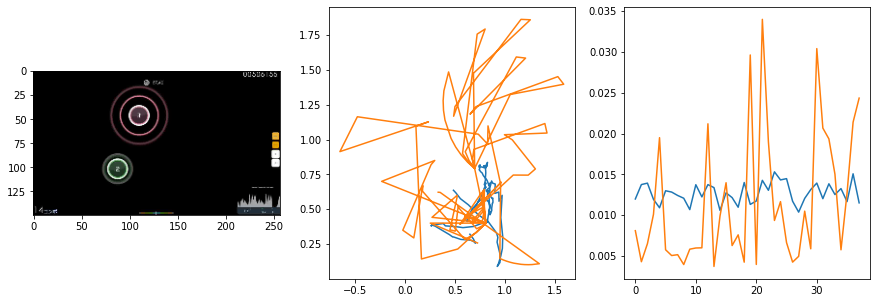

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0067                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 64
pred: 0.6499230861663818 0.49873489141464233
gt: 0.5017321705818176 0.39368000626564026
(125, 63)


<Figure size 1080x360 with 0 Axes>

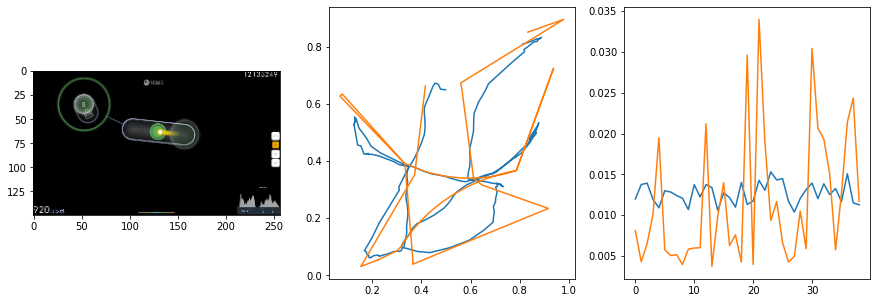

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.79it/s  0.0079                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 64
pred: 0.2179456204175949 0.36722850799560547
gt: 0.1038752943277359 0.375340074300766
(64, 61)


<Figure size 1080x360 with 0 Axes>

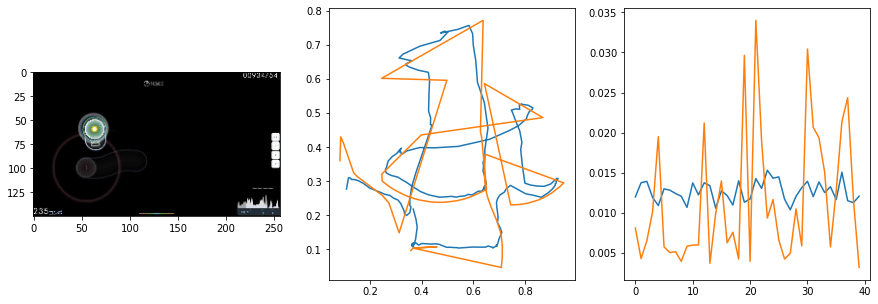

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.79it/s  0.0072                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 64
pred: 0.527450680732727 0.5828492045402527
gt: 0.5885955095291138 0.7820441722869873
(139, 108)


<Figure size 1080x360 with 0 Axes>

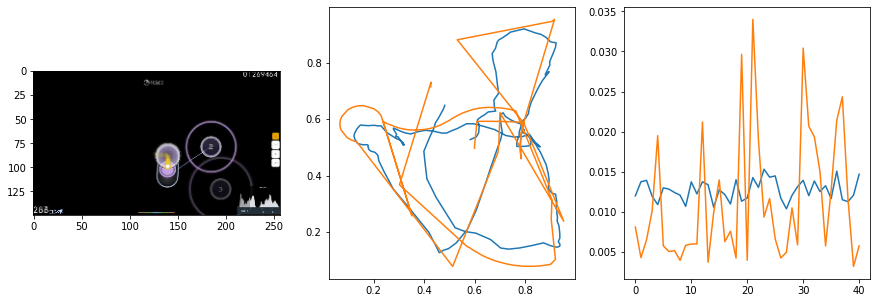

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0047                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 64
pred: 0.5900622606277466 0.5118553042411804
gt: 0.73046875 0.4791666567325592
(161, 73)


<Figure size 1080x360 with 0 Axes>

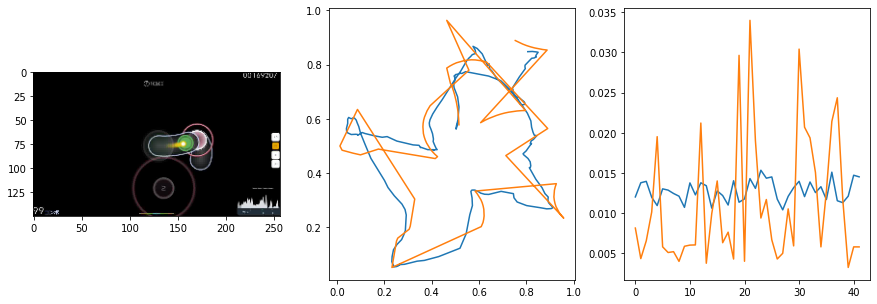

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0058                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 64
pred: 0.5136182308197021 0.6572681665420532
gt: 0.3643818795681 0.6835810542106628
(104, 97)


<Figure size 1080x360 with 0 Axes>

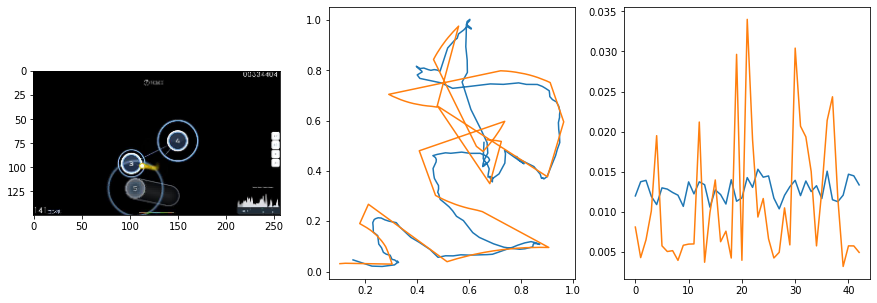

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.0131                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 64
pred: 0.17441463470458984 0.6198161244392395
gt: 0.08756732940673828 0.29210570454597473
(61, 51)


<Figure size 1080x360 with 0 Axes>

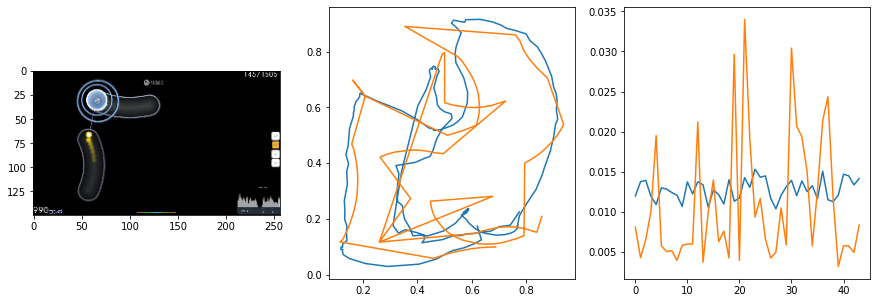

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.69it/s  0.0173                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 64
pred: 0.7533209919929504 0.3606121838092804
gt: 0.8786430954933167 0.4529878795146942
(184, 70)


<Figure size 1080x360 with 0 Axes>

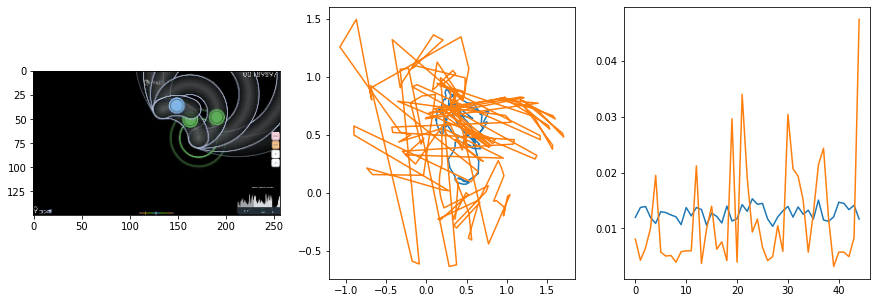

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.70it/s  0.0041                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 64
pred: 0.42781180143356323 0.5198431015014648
gt: 0.42784029245376587 0.5600370764732361
(114, 83)


<Figure size 1080x360 with 0 Axes>

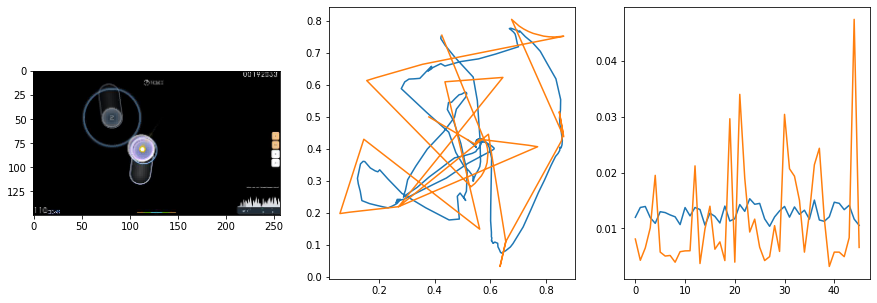

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0057                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 64
pred: 0.7934852838516235 0.5265990495681763
gt: 0.3865581750869751 0.23276685178279877
(107, 45)


<Figure size 1080x360 with 0 Axes>

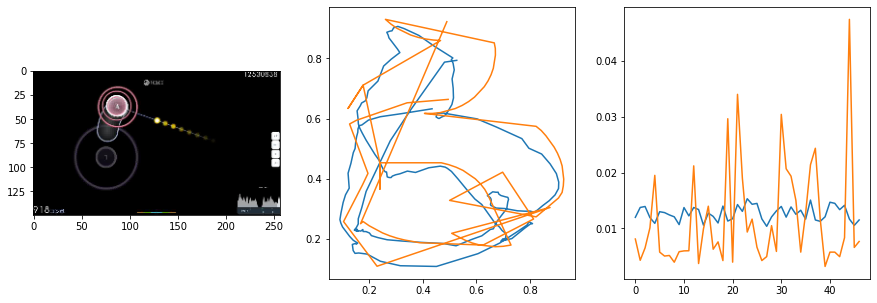

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0066                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 64
pred: 0.7877473831176758 0.5020902752876282
gt: 0.8659244775772095 0.3720439374446869
(182, 61)


<Figure size 1080x360 with 0 Axes>

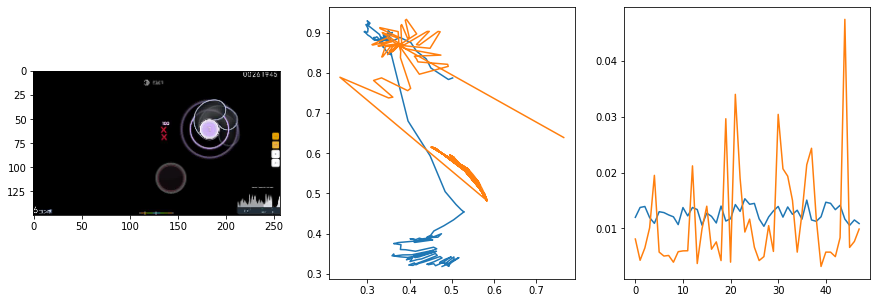

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0123                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 64
pred: 0.49270889163017273 0.284259557723999
gt: 0.5940688848495483 0.3460884392261505
(140, 58)


<Figure size 1080x360 with 0 Axes>

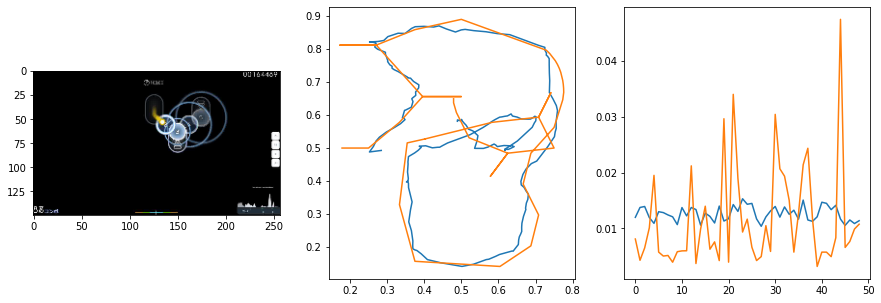

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0219                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 64
pred: 0.5285220146179199 0.6273118853569031
gt: 0.32018786668777466 0.25141727924346924
(97, 47)


<Figure size 1080x360 with 0 Axes>

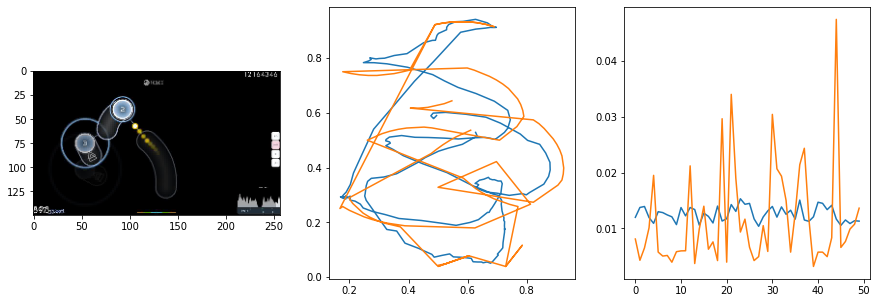

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0311                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 64
pred: 0.24559229612350464 0.7665376663208008
gt: 0.373046875 0.6666666865348816
(105, 95)


<Figure size 1080x360 with 0 Axes>

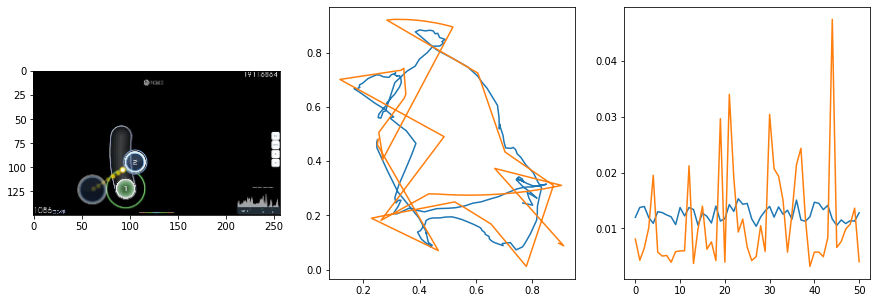

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0062                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 64
pred: 0.5342057943344116 0.5939587354660034
gt: 0.46249234676361084 0.44998130202293396
(119, 70)


<Figure size 1080x360 with 0 Axes>

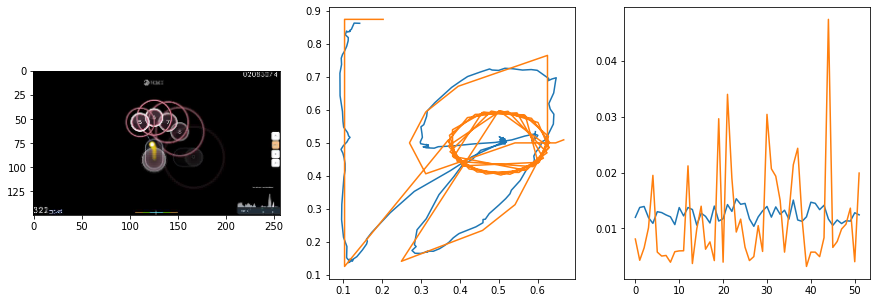

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0197                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 64
pred: 0.43681180477142334 0.7792885303497314
gt: 0.4576602280139923 0.9560381770133972
(118, 129)


<Figure size 1080x360 with 0 Axes>

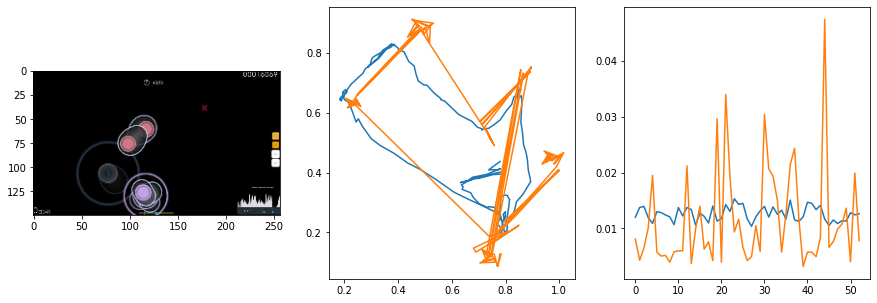

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0136                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 64
pred: 0.6888565421104431 0.6975066065788269
gt: 0.783203125 0.7057291865348816
(169, 100)


<Figure size 1080x360 with 0 Axes>

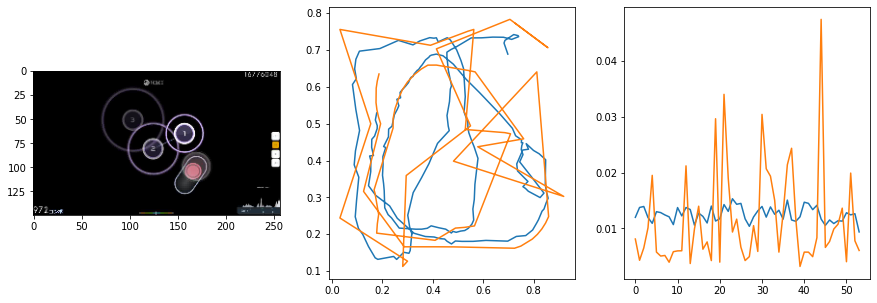

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0154                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 64
pred: 0.719258189201355 0.5718047618865967
gt: 0.662109375 0.5520833134651184
(150, 82)


<Figure size 1080x360 with 0 Axes>

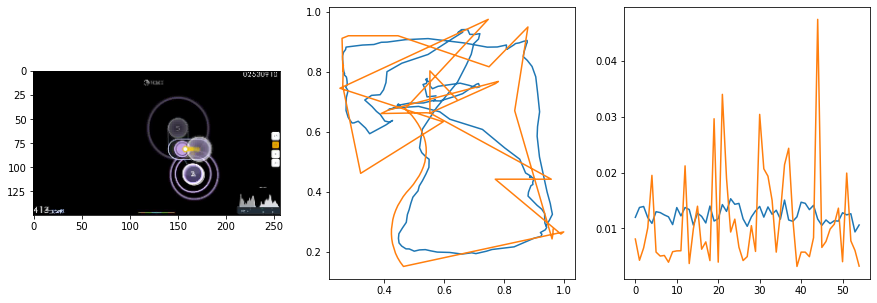

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.72it/s  0.0059                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 64
pred: 0.826295793056488 0.5374429225921631
gt: 0.8420758843421936 0.6121917366981506
(178, 89)


<Figure size 1080x360 with 0 Axes>

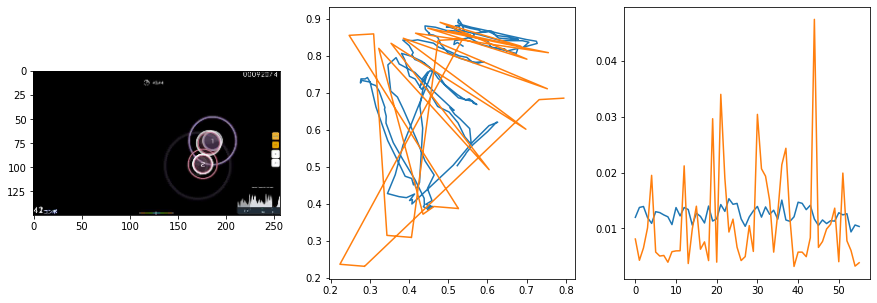

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.71it/s  0.0114                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 64
pred: 0.4793463945388794 0.47131988406181335
gt: 0.3953767716884613 0.3058813810348511
(109, 53)


<Figure size 1080x360 with 0 Axes>

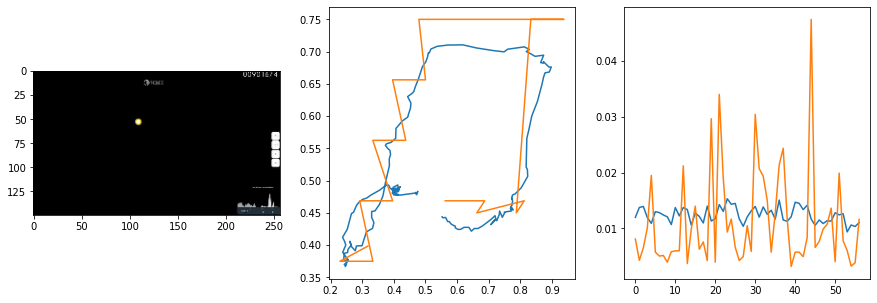

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.71it/s  0.0038                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 64
pred: 0.37228962779045105 0.6147527098655701
gt: 0.296875 0.9322916865348816
(94, 126)


<Figure size 1080x360 with 0 Axes>

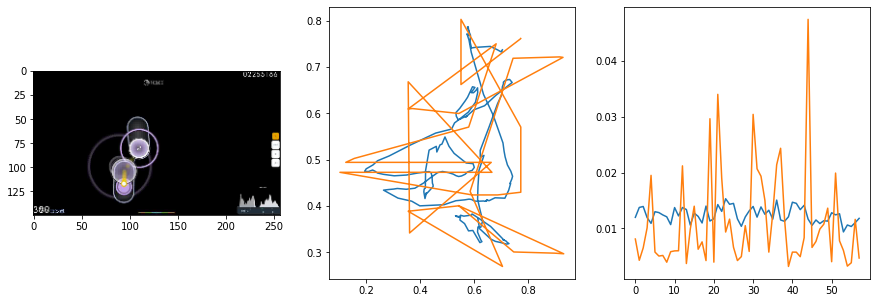

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0049                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 64
pred: 0.2534048855304718 0.6369115710258484
gt: 0.5573863983154297 0.8696280121803284
(134, 119)


<Figure size 1080x360 with 0 Axes>

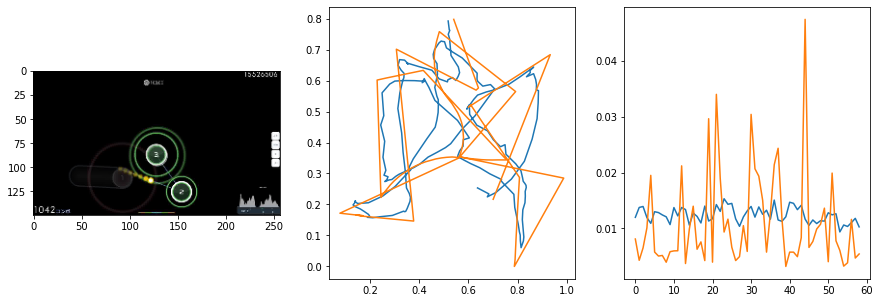

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.74it/s  0.0036                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 64
pred: 0.6542839407920837 0.506130576133728
gt: 0.7500989437103271 0.31987234950065613
(164, 55)


<Figure size 1080x360 with 0 Axes>

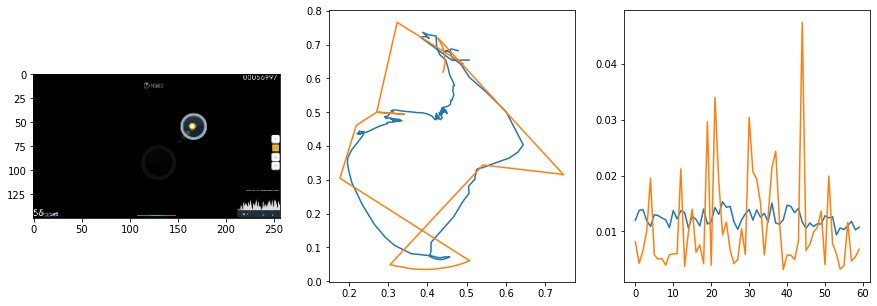

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0112                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 64
pred: 0.9216159582138062 0.3309316039085388
gt: 0.7214796543121338 0.2930499315261841
(159, 52)


<Figure size 1080x360 with 0 Axes>

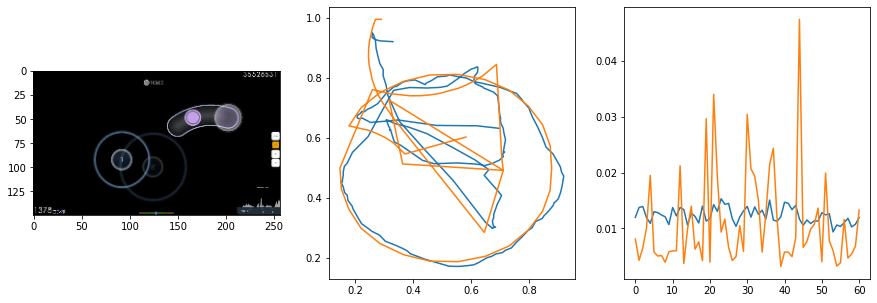

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.73it/s  0.0093                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 64
pred: 0.4234778583049774 0.5178879499435425
gt: 0.6755514740943909 0.5
(152, 76)


<Figure size 1080x360 with 0 Axes>

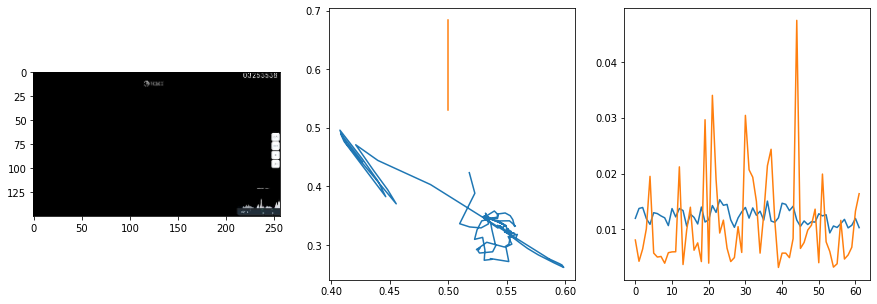

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.75it/s  0.0044                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 64
pred: 0.583215594291687 0.4097803235054016
gt: 0.755859375 0.3932291567325592
(165, 63)


<Figure size 1080x360 with 0 Axes>

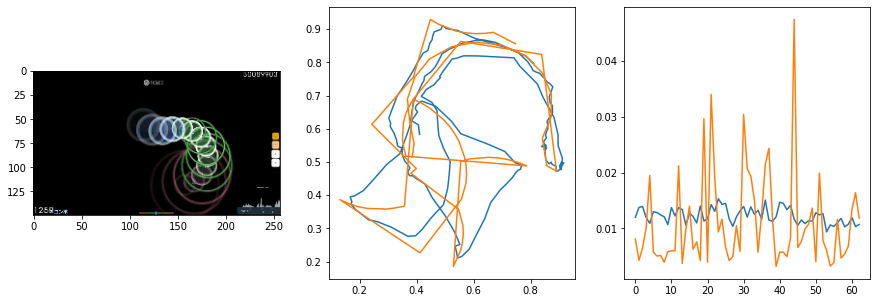

 Iters    Elapsed Time      Speed     loss                                      
 13/13  00:00:07<00:00:00  1.79it/s  0.0086                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 64
pred: 0.6923715472221375 0.6855506896972656
gt: 0.6471151113510132 0.7181524634361267
(148, 101)


<Figure size 1080x360 with 0 Axes>

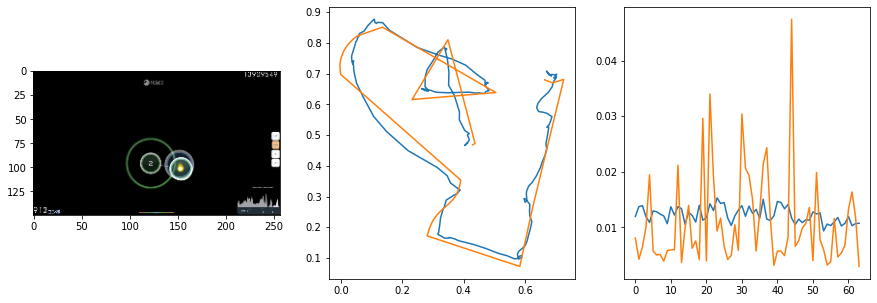

633.4024229049683 secs


In [ ]:
start = time.time()

lamb = 3
epochs = 64
trainVN()

end = time.time()
print(end - start, 'secs')

In [ ]:
torch.save(vn.state_dict(), model_path + str(epoch_cum) + '.pt')

# Test Model

In [ ]:
import os
import cv2
import torch
import torchvision.transforms as transforms

In [ ]:
vn.load_state_dict(torch.load(model_path + str(128) + '.pt'))

<All keys matched successfully>

In [ ]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
#osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
#osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'
#osud = '../demo/beatmaps/835194 Mili - Vulnerability'
#osuf = 'Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu'
#osud = '../demo/beatmaps/653534 Panda Eyes - ILY'
#osuf = 'Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu'
osud = '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun'
osuf = 'Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu'

In [ ]:
osr = OSR(osud, osuf, sample_rate=sample_rate, hop_size=hop_size, skin='./skin_hidden', vtmp='../demo/vids/')

In [ ]:
osr.create_vid()

***********************************************************
['ffmpeg', '-y', '-loglevel', 'info', '-thread_queue_size', '24', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1024x600', '-pix_fmt', 'yuv420p', '-r', '50.00', '-an', '-i', '-', '-i', '/tmp/06243aac-b4d3-11ec-b0b0-a85e4554c351temp/audio.mp3', '-acodec', 'aac', '-vcodec', 'mjpeg', '-preset', 'fast', '-crf', '18', '-ab', '320k', '-threads', '0', '../demo/vids/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu.avi']
***********************************************************


In [ ]:
video_path = os.path.join('../demo/vids/', osuf + '.avi')

In [ ]:
vn.to(device)
vn.init_hidden(1)
vn.eval()

VN(
  (convA): Conv2d(3, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (convB): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (linear1): Linear(in_features=2368, out_features=592, bias=True)
  (lstmA): LSTM(592, 64, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=64, out_features=32, bias=True)
  (linearB): Linear(in_features=32, out_features=2, bias=True)
)

In [ ]:
transform = transforms.ToTensor()
frames = []
vc = cv2.VideoCapture(video_path)
p = []
while True:
    r, f = vc.read()
    if r is False:
        break
    f = cv2.resize(f, (0,0), fx=scale, fy=scale)
    F = transform(f).to(device)
    with torch.no_grad():
        P = vn(F.unsqueeze(0).unsqueeze(0))
    p.append(P.squeeze(0).squeeze(0).cpu().detach().numpy())

# Create Replay Video

In [ ]:
from IPython.display import Video

In [ ]:
np.save('predVN.npy', p)

In [ ]:
eosud = osud.replace('/', '\/')

In [ ]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosud\/$osuf\",/" data.json
!sed -i "s/Output path.*/Output path\": \"videoVN.mp4\",/" data.json

In [ ]:
!python create_replayVN.py predVN.npy 50

2022-04-05 07:25:26,872:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-05 07:25:26,873:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'videoVN.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f3404db3550>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb'

In [ ]:
Video("videoVN.mp4")

In [ ]:
!sed -i "s/Output path.*/Output path\": \"video.mp4\",/" data.json

In [ ]:
!python create_replay.py predHN.npy predVN.npy 50 0.5

2022-04-05 01:28:27,439:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-05 01:28:27,439:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': "../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku/sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu", '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'video.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7f5a2cedf580>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'tex

In [ ]:
Video("video.mp4")